# Import_data

In [8]:
pip install databento

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 83.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 157.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [46]:
# from __future__ import annotations

# import re
# from datetime import datetime, timedelta, time as dtime
# from zoneinfo import ZoneInfo

# import numpy as np
# import pandas as pd
# import databento as db


# # ===== CONFIG =====
# API_KEY = "db-iKVuPA7sBdWpefhWQyHPkrSjJpLgH"
# client = db.Historical(API_KEY)

# # Parent symbol -> expands to all ES contracts
# PARENT = "ES.FUT"

# # Month code mapping
# MONTH_MAP = {'F':1,'G':2,'H':3,'J':4,'K':5,'M':6,'N':7,'Q':8,'U':9,'V':10,'X':11,'Z':12}
# SYM_RE = re.compile(r"^([A-Z]{1,3})([FGHJKMNQUVXZ])(\d{1,2})$")  # e.g. ESZ4, ESH25


# def _resolve_year(two_digit: int, ref_year: int) -> int:
#     """
#     Map a 1–2 digit year code to a full year close to the reference year (tracking day).
#     Works across 2010s/2020s and removes the earlier hack that caused wrong years.
#     """
#     candidates = [2000 + two_digit, 2010 + two_digit, 2020 + two_digit, 2030 + two_digit]
#     return min(candidates, key=lambda Y: (abs(Y - ref_year), Y))


# def _parse_expiry(symbol: str, ref_year: int) -> tuple[int, int]:
#     """
#     Return (YYYY, MM) for a futures symbol like ESZ4 / ESZ24.
#     """
#     m = SYM_RE.match(symbol)
#     if not m:
#         return (9999, 12)  # push unknowns to the back
#     _, mon_code, yy = m.groups()
#     mm = MONTH_MAP[mon_code]
#     y = int(yy)
#     yyyy = _resolve_year(y, ref_year)
#     return (yyyy, mm)


# def _build_bar_ends(start_dt, end_dt, freq="15min"):
#     """
#     Build 15-min bar end timestamps from session open to session close inclusive,
#     in America/Chicago timezone.
#     First bar ends at start_dt + 15min.
#     """
#     start_dt = pd.Timestamp(start_dt)
#     end_dt   = pd.Timestamp(end_dt)
#     first = (start_dt + pd.Timedelta(minutes=15)).tz_convert(start_dt.tz)
#     return pd.date_range(first, end_dt, freq=freq)


# def download_day(tracking_day: str, output_csv: str | None = None) -> pd.DataFrame:
#     """
#     Download TBBO + trades for the ES futures session that runs from
#     17:00 CT (prev day) to 16:00 CT (tracking_day), compute:
#       - Bid/Ask at each 15-min bar end (last known TBBO)
#       - VWAP since session open at each 15-min bar end
#     Keep only ONE contract at each timestamp: the front month (nearest expiry).
#     Save to CSV if output_csv is provided. Return the final DataFrame.
#     """
#     chi = ZoneInfo("America/Chicago")
#     day = datetime.fromisoformat(tracking_day).replace(tzinfo=chi)
#     start_dt = (day - timedelta(days=1)).replace(hour=17, minute=0, second=0, microsecond=0)
#     end_dt   = day.replace(hour=16, minute=0, second=0, microsecond=0)

#     # Build 15-minute bar end grid in Chicago time
#     bar_ends = _build_bar_ends(start_dt, end_dt, freq="15min")

#     # === Download raw data (expand parent to all active ES contracts) ===
#     quotes = client.timeseries.get_range(
#         dataset="GLBX.MDP3",
#         schema="tbbo",
#         symbols=[PARENT],
#         stype_in="parent",
#         start=start_dt.isoformat(),
#         end=end_dt.isoformat(),
#     ).to_df()

#     trades = client.timeseries.get_range(
#         dataset="GLBX.MDP3",
#         schema="trades",
#         symbols=[PARENT],
#         stype_in="parent",
#         start=start_dt.isoformat(),
#         end=end_dt.isoformat(),
#     ).to_df()

#     if quotes.empty and trades.empty:
#         raise RuntimeError("No data returned for the requested session.")

#     # === Keep only outright futures, drop inter-month spreads ===
#     # ESZ4, ESH25, etc. (2–3 letters root + month code + 1–2 digits year)
#     mask_q = quotes["symbol"].astype(str).str.match(SYM_RE)
#     mask_t = trades["symbol"].astype(str).str.match(SYM_RE)
#     quotes = quotes[mask_q].copy()
#     trades = trades[mask_t].copy()

#     # === Normalize timestamps to America/Chicago ===
#     # Databento returns tz-aware UTC; convert to CT for correct session math
#     quotes["Time"] = pd.to_datetime(quotes["ts_event"], utc=True).dt.tz_convert(chi)
#     trades["Time"] = pd.to_datetime(trades["ts_event"], utc=True).dt.tz_convert(chi)

#     # === Prepare TBBO at 15-min bar ends: last known before or at each bar end (per symbol) ===
#     def resample_tbbo_per_symbol(df_sym: pd.DataFrame) -> pd.DataFrame:
#         q = (
#             df_sym.loc[:, ["Time", "bid_px_00", "ask_px_00"]]
#             .sort_values("Time")
#             .drop_duplicates("Time", keep="last")
#         )
#         # asof needs both sides sorted and unique on the merge key
#         target = pd.DataFrame({"Time": bar_ends})
#         out = pd.merge_asof(
#             target, q, on="Time", direction="backward", allow_exact_matches=True
#         )
#         out["symbol"] = df_sym["symbol"].iloc[0]
#         return out

#     tbbo = (
#         quotes.sort_values(["symbol", "Time"])
#         .groupby("symbol", group_keys=False)
#         .apply(resample_tbbo_per_symbol)
#     )

#     # === VWAP since session open at each bar end: compute cumulatives first, then asof ===
#     if trades.empty:
#         # No trades: vwap is NaN; keep quotes only
#         vwap_bars = tbbo.loc[:, ["Time", "symbol"]].copy()
#         vwap_bars["vwap_cum"] = np.nan
#     else:
#         tr = trades.loc[:, ["symbol", "Time", "price", "size"]].copy()
#         tr = tr.sort_values(["symbol", "Time"])
#         tr["notional"] = tr["price"] * tr["size"]
#         # cumulative within the session, per symbol
#         tr["cum_notional"] = tr.groupby("symbol")["notional"].cumsum()
#         tr["cum_volume"]   = tr.groupby("symbol")["size"].cumsum()
#         tr = tr.loc[:, ["symbol", "Time", "cum_notional", "cum_volume"]]

#         def vwap_per_symbol(df_sym: pd.DataFrame) -> pd.DataFrame:
#             s = df_sym.loc[:, ["Time", "cum_notional", "cum_volume"]].drop_duplicates("Time")
#             s = s.sort_values("Time")
#             target = pd.DataFrame({"Time": bar_ends})
#             out = pd.merge_asof(
#                 target, s, on="Time", direction="backward", allow_exact_matches=True
#             )
#             out["symbol"] = df_sym["symbol"].iloc[0]
#             out["vwap_cum"] = out["cum_notional"] / out["cum_volume"]
#             return out.loc[:, ["Time", "symbol", "vwap_cum"]]

#         vwap_bars = (
#             tr.groupby("symbol", group_keys=False)
#               .apply(vwap_per_symbol)
#         )

#     # === Merge TBBO and VWAP on (Time, symbol) ===
#     bars = pd.merge(
#         tbbo, vwap_bars, on=["Time", "symbol"], how="left"
#     )

#     # === Select ONLY ONE product: the front month at each timestamp ===
#     ref_year = day.year
#     exp_ym = bars["symbol"].astype(str).map(lambda s: _parse_expiry(s, ref_year))
#     bars["exp_year"]  = [ym[0] for ym in exp_ym]
#     bars["exp_month"] = [ym[1] for ym in exp_ym]
#     bars["expiry_key"] = bars["exp_year"] * 12 + bars["exp_month"]

#     out = bars.sort_values(["Time", "expiry_key"]).reset_index(drop=True)
#     out = out.loc[:, ["Time", "symbol", "bid_px_00", "ask_px_00", "vwap_cum"]]

#     # If there were no trades up to a bar, vwap is NaN; forward-fill within the day is reasonable
#     out["vwap_cum"] = out["vwap_cum"].ffill()

#     # === NEW: keep only US Regular Trading Hours (09:30–16:00 ET == 08:30–15:00 CT) ===
#     rth_open_ct  = dtime(8, 30)
#     rth_close_ct = dtime(15, 0)
#     out = out[out["Time"].dt.time.between(rth_open_ct, rth_close_ct)]

#     # Optional: drop a trailing bar if it’s exactly at the close and everything is unchanged
#     # (comment this out if you prefer to keep the 16:00 stamp)
#     # if len(out) and out["Time"].iloc[-1] == pd.Timestamp(end_dt).tz_convert(chi):
#     #     out = out.iloc[:-1].copy()

#     if output_csv:
#         out.to_csv(output_csv, index=False)

#     return out


# # ===== Example usage =====
# df = download_day("2010-06-07", output_csv="/data/workspace_files/µ2010-06-07.csv")
# # display(df.head())

/tmp/ipykernel_584/1296003356.py:128: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(resample_tbbo_per_symbol)
/tmp/ipykernel_584/1296003356.py:158: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(vwap_per_symbol)


In [47]:
df

,Time,symbol,bid_px_00,ask_px_00,vwap_cum
244,2010-06-07 08:30:00-05:00,ESM0,1066.75,1067.00,1063.385637
245,2010-06-07 08:30:00-05:00,ESU0,1062.00,1062.25,1059.694951
246,2010-06-07 08:30:00-05:00,ESZ0,1046.50,1059.25,1055.128378
247,2010-06-07 08:30:00-05:00,ESH1,NaN,NaN,1055.128378
248,2010-06-07 08:45:00-05:00,ESM0,1061.50,1061.75,1063.737748
...,...,...,...,...,...
347,2010-06-07 14:45:00-05:00,ESH1,1045.50,1048.25,1048.250000
348,2010-06-07 15:00:00-05:00,ESM0,1049.50,1049.75,1061.629310
349,2010-06-07 15:00:00-05:00,ESU0,1045.00,1045.75,1057.399728
350,2010-06-07 15:00:00-05:00,ESZ0,1040.75,1041.00,1053.128571


In [216]:
# from time import sleep
# import pandas as pd
# from pathlib import Path


# def run_range(download_fn, start="2010-06-06", end="2010-06-10", business_days=True, pause_sec=0.0):

#     # Choose trading days: Mon–Fri (business) or every calendar day
#     rng = (pd.bdate_range if business_days else pd.date_range)(start=start, end=end, freq="D")
#     failures = []

#     total = len(rng)
#     for i, d in enumerate(rng, 1):
#         td = d.date().isoformat()
#         try:
#             print(f"[{i}/{total}] {td} ... ", end="", flush=True)
#             download_fn(td)   # <- call the download_day function
#             print("done")
#         except Exception as e:
#             print("FAILED")
#             failures.append((td, str(e)))
#         if pause_sec:
#             sleep(pause_sec)

#     print(f"\nFinished: {total - len(failures)} ok, {len(failures)} failed.")
#     if failures:
#         print("Sample failures (up to 10):")
#         for td, msg in failures[:10]:
#             print(f"  {td}: {msg}")


# # === Example run ===
# # This will loop from 2010-06-06 to 2025-01-01 and call your download_day()
# # one date at a time, weekdays only.


# outdir = Path("/data/workspace_files/us_data")
# outdir.mkdir(parents=True, exist_ok=True)

# run_range(
#     lambda d: download_day(d, output_csv=str(outdir / f"{d}.csv")),
#     start="2010-06-06",
#     end="2025-01-01",
#     business_days=True,
#     pause_sec=0.0,
# )

[1/5324] 2010-06-06 ... FAILED
[2/5324] 2010-06-07 ... done
[3/5324] 2010-06-08 ... done
[4/5324] 2010-06-09 ... done
[5/5324] 2010-06-10 ... done
[6/5324] 2010-06-11 ... done
[7/5324] 2010-06-12 ... FAILED
[8/5324] 2010-06-13 ... FAILED
[9/5324] 2010-06-14 ... done
[10/5324] 2010-06-15 ... done
[11/5324] 2010-06-16 ... done
[12/5324] 2010-06-17 ... done
[13/5324] 2010-06-18 ... done
[14/5324] 2010-06-19 ... FAILED
[15/5324] 2010-06-20 ... FAILED
[16/5324] 2010-06-21 ... done
[17/5324] 2010-06-22 ... done
[18/5324] 2010-06-23 ... done
[19/5324] 2010-06-24 ... done
[20/5324] 2010-06-25 ... done
[21/5324] 2010-06-26 ... FAILED
[22/5324] 2010-06-27 ... FAILED
[23/5324] 2010-06-28 ... done
[24/5324] 2010-06-29 ... done
[25/5324] 2010-06-30 ... done
[26/5324] 2010-07-01 ... done
[27/5324] 2010-07-02 ... done
[28/5324] 2010-07-03 ... FAILED
[29/5324] 2010-07-04 ... FAILED
[30/5324] 2010-07-05 ... done
[31/5324] 2010-07-06 ... done
[32/5324] 2010-07-07 ... done
[33/5324] 2010-07-08 ... done
[

  .apply(vwap_per_symbol)
/tmp/ipykernel_584/1296003356.py:128: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(resample_tbbo_per_symbol)
/tmp/ipykernel_584/1296003356.py:158: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(vwap_per_symbol)
/tmp/ipykernel_584/1296003356.py:128: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future

In [35]:
from __future__ import annotations

import re
from datetime import datetime, timedelta, time as dtime
from zoneinfo import ZoneInfo

import numpy as np
import pandas as pd
import databento as db


# ===== CONFIG =====
API_KEY = "db-iKVuPA7sBdWpefhWQyHPkrSjJpLgH"
client = db.Historical(API_KEY)

# Parent symbol -> expands to all ES contracts
PARENT = "ES.FUT"

# Month code mapping & symbol regex (e.g., ESZ4, ESH25)
MONTH_MAP = {'F':1,'G':2,'H':3,'J':4,'K':5,'M':6,'N':7,'Q':8,'U':9,'V':10,'X':11,'Z':12}
SYM_RE = re.compile(r"^([A-Z]{1,3})([FGHJKMNQUVXZ])(\d{1,2})$")  # root + month + 1–2 digit year


def _resolve_year(two_digit: int, ref_year: int) -> int:
    """
    Map a 1–2 digit year code to a full year close to the reference year (tracking day).
    """
    candidates = [2000 + two_digit, 2010 + two_digit, 2020 + two_digit, 2030 + two_digit]
    return min(candidates, key=lambda Y: (abs(Y - ref_year), Y))


def _parse_expiry(symbol: str, ref_year: int) -> tuple[int, int]:
    """
    Return (YYYY, MM) for a futures symbol like ESZ4 / ESZ24.
    """
    m = SYM_RE.match(symbol)
    if not m:
        return (9999, 12)  # push unknowns to the back
    _, mon_code, yy = m.groups()
    mm = MONTH_MAP[mon_code]
    y = int(yy)
    yyyy = _resolve_year(y, ref_year)
    return (yyyy, mm)


def _build_bar_ends(start_dt, end_dt, freq="15min"):
    """
    Build bar-end timestamps from RTH open to RTH close inclusive, in America/Chicago time.
    Bars are shifted by +3 minutes relative to the regular grid.
    First bar ends at start_dt + 3 minutes (e.g. 08:33 CT), then every `freq` thereafter.
    Last bar is clipped so it does not exceed end_dt (15:00 CT).
    """
    start_dt = pd.Timestamp(start_dt)
    end_dt   = pd.Timestamp(end_dt)

    # Build grid: start at RTH open + 3min, then every `freq`
    first = start_dt + pd.Timedelta("3min")
    grid = pd.date_range(first, end_dt + pd.Timedelta(freq), freq=freq)

    # Clip any value that overshoots the session close (e.g., 15:03 -> 15:00)
    grid = grid.where(grid <= end_dt, end_dt)

    # Drop duplicates if last two collapse at 15:00
    grid = grid.drop_duplicates()

    return grid



def download_us_rth_day(tracking_day: str,
                        freq: str = "15min",
                        output_csv: str | None = None) -> pd.DataFrame:
    """
    Download TBBO + trades for ES during **US Regular Trading Hours** (09:30–16:00 ET),
    compute:
      - Bid/Ask at each bar end (last known TBBO)
      - VWAP since RTH open (cumulative from 09:30 ET) at each bar end
    Keep only ONE contract at each timestamp: the front month (nearest expiry).
    Save to CSV if output_csv is provided. Return the final DataFrame.
    """
    chi = ZoneInfo("America/Chicago")
    nyc = ZoneInfo("America/New_York")

    # Tracking day in CT (we anchor on the local date)
    day_ct = datetime.fromisoformat(tracking_day).replace(tzinfo=chi)

    # US RTH window: 09:30–16:00 ET == 08:30–15:00 CT for the same civil day
    rth_open_ct  = day_ct.replace(hour=8, minute=30, second=0, microsecond=0)
    rth_close_ct = day_ct.replace(hour=15, minute=0, second=0, microsecond=0)

    # Bar ends grid in CT, within RTH only
    bar_ends = _build_bar_ends(rth_open_ct, rth_close_ct, freq=freq)

    # === Download raw data (expand parent to all active ES contracts) within RTH window ===
    quotes = client.timeseries.get_range(
        dataset="GLBX.MDP3",
        schema="tbbo",
        symbols=[PARENT],
        stype_in="parent",
        start=rth_open_ct.isoformat(),
        end=rth_close_ct.isoformat(),
    ).to_df()

    trades = client.timeseries.get_range(
        dataset="GLBX.MDP3",
        schema="trades",
        symbols=[PARENT],
        stype_in="parent",
        start=rth_open_ct.isoformat(),
        end=rth_close_ct.isoformat(),
    ).to_df()

    if quotes.empty and trades.empty:
        raise RuntimeError("No data returned for the requested RTH window.")

    # === Keep only outright futures, drop inter-month spreads ===
    mask_q = quotes["symbol"].astype(str).str.match(SYM_RE)
    quotes = quotes[mask_q].copy()
    if not trades.empty:
        mask_t = trades["symbol"].astype(str).str.match(SYM_RE)
        trades = trades[mask_t].copy()

    # === Normalize timestamps to America/Chicago ===
    quotes["Time"] = pd.to_datetime(quotes["ts_event"], utc=True).dt.tz_convert(chi)
    if not trades.empty:
        trades["Time"] = pd.to_datetime(trades["ts_event"], utc=True).dt.tz_convert(chi)

    # === Prepare TBBO at bar ends: last known before or at each bar end (per symbol) ===
    def resample_tbbo_per_symbol(df_sym: pd.DataFrame) -> pd.DataFrame:
        q = (
            df_sym.loc[:, ["Time", "bid_px_00", "ask_px_00"]]
            .sort_values("Time")
            .drop_duplicates("Time", keep="last")
        )
        target = pd.DataFrame({"Time": bar_ends})
        out = pd.merge_asof(
            target, q, on="Time", direction="backward", allow_exact_matches=True
        )
        out["symbol"] = df_sym["symbol"].iloc[0]
        return out

    tbbo = (
        quotes.sort_values(["symbol", "Time"])
              .groupby("symbol", group_keys=False)
              .apply(resample_tbbo_per_symbol)
    )

    # === VWAP since RTH open: cumulative only within the RTH window (per symbol) ===
    if trades.empty:
        vwap_bars = tbbo.loc[:, ["Time", "symbol"]].copy()
        vwap_bars["vwap_cum"] = np.nan
    else:
        tr = trades.loc[:, ["symbol", "Time", "price", "size"]].copy()
        tr = tr.sort_values(["symbol", "Time"])
        tr["notional"] = tr["price"] * tr["size"]
        # start cumulation at RTH open by filtering to the RTH window only
        tr = tr[(tr["Time"] >= rth_open_ct) & (tr["Time"] <= rth_close_ct)]
        tr["cum_notional"] = tr.groupby("symbol")["notional"].cumsum()
        tr["cum_volume"]   = tr.groupby("symbol")["size"].cumsum()
        tr = tr.loc[:, ["symbol", "Time", "cum_notional", "cum_volume"]]

        def vwap_per_symbol(df_sym: pd.DataFrame) -> pd.DataFrame:
            s = df_sym.loc[:, ["Time", "cum_notional", "cum_volume"]].drop_duplicates("Time")
            s = s.sort_values("Time")
            target = pd.DataFrame({"Time": bar_ends})
            out = pd.merge_asof(
                target, s, on="Time", direction="backward", allow_exact_matches=True
            )
            out["symbol"] = df_sym["symbol"].iloc[0]
            out["vwap_cum"] = out["cum_notional"] / out["cum_volume"]
            return out.loc[:, ["Time", "symbol", "vwap_cum"]]

        vwap_bars = tr.groupby("symbol", group_keys=False).apply(vwap_per_symbol)

    # === Merge TBBO and VWAP on (Time, symbol) ===
    bars = pd.merge(tbbo, vwap_bars, on=["Time", "symbol"], how="left")

    # === Determine front month (nearest expiry) per timestamp and keep only that ===
    ref_year = day_ct.year
    exp_ym = bars["symbol"].astype(str).map(lambda s: _parse_expiry(s, ref_year))
    bars["exp_year"]  = [ym[0] for ym in exp_ym]
    bars["exp_month"] = [ym[1] for ym in exp_ym]
    bars["expiry_key"] = bars["exp_year"] * 12 + bars["exp_month"]



    # IMPORTANT: columns indexer must be a LIST (not a tuple)
    out = bars.loc[:, ["Time", "symbol", "bid_px_00", "ask_px_00", "vwap_cum", "exp_year", "exp_month", "expiry_key"]].sort_values("Time")



    # Forward-fill VWAP after first valid trade within the day
    # (initial NaNs—before first trade—are left as NaN)
    first_valid = out["vwap_cum"].first_valid_index()
    if first_valid is not None:
        out.loc[first_valid:, "vwap_cum"] = out.loc[first_valid:, "vwap_cum"].ffill()

    if output_csv:
        out.to_csv(output_csv, index=False)

    return out

In [33]:
# ===== Example usage =====
df = download_us_rth_day("2010-06-07", freq="15min", output_csv="/data/workspace_files/2010-06-07_RTH.csv")
display(df.head())

RTH open (CT):  2010-06-07 08:30:00-05:00
RTH close (CT): 2010-06-07 15:00:00-05:00
bar_ends[0..3]: [Timestamp('2010-06-07 08:33:00-0500', tz='America/Chicago'), Timestamp('2010-06-07 08:48:00-0500', tz='America/Chicago'), Timestamp('2010-06-07 09:03:00-0500', tz='America/Chicago')]
bar_ends[-3..]: [Timestamp('2010-06-07 14:33:00-0500', tz='America/Chicago'), Timestamp('2010-06-07 14:48:00-0500', tz='America/Chicago'), Timestamp('2010-06-07 15:00:00-0500', tz='America/Chicago')]
num bars: 27


/tmp/ipykernel_3394/3203890827.py:145: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(resample_tbbo_per_symbol)
/tmp/ipykernel_3394/3203890827.py:173: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  vwap_bars = tr.groupby("symbol", group_keys=False).apply(vwap_per_symbol)


,Time,symbol,bid_px_00,ask_px_00,vwap_cum,exp_year,exp_month,expiry_key
0,2010-06-07 08:33:00-05:00,ESH1,NaN,NaN,NaN,2011,3,24135
54,2010-06-07 08:33:00-05:00,ESU0,1063.5,1063.75,1062.639279,2010,9,24129
81,2010-06-07 08:33:00-05:00,ESZ0,1057.5,1059.00,1059.000000,2010,12,24132
27,2010-06-07 08:33:00-05:00,ESM0,1068.0,1068.25,1066.815187,2010,6,24126
82,2010-06-07 08:48:00-05:00,ESZ0,1053.0,1053.25,1055.666667,2010,12,24132


In [40]:
from time import sleep
import pandas as pd
from pathlib import Path

def run_range(download_fn, start="2010-06-06", end="2010-06-10",
              business_days=True, pause_sec=0.0):
    # Choose trading days: Mon–Fri (business) or every calendar day
    rng = (pd.bdate_range if business_days else pd.date_range)(
        start=start, end=end, freq="D"
    )
    failures = []
    total = len(rng)

    for i, d in enumerate(rng, 1):
        td = d.date().isoformat()
        try:
            print(f"[{i}/{total}] {td} ... ", end="", flush=True)
            download_fn(td)
            print("done")
        except Exception as e:
            print("FAILED")
            failures.append((td, str(e)))
        if pause_sec:
            sleep(pause_sec)

    print(f"\nFinished: {total - len(failures)} ok, {len(failures)} failed.")
    if failures:
        print("Sample failures (up to 10):")
        for td, msg in failures[:10]:
            print(f"  {td}: {msg}")

# === Example run ===
outdir = Path("/data/workspace_files/us_data")
outdir.mkdir(parents=True, exist_ok=True)

# If your function is named download_us_rth_day (per the latest code), use that:
run_range(
    lambda d: download_us_rth_day(d, freq="15min",
                                  output_csv=str(outdir / f"{d}.csv")),
    start="2010-06-07",
    end="2025-01-01",
    business_days=True,
    pause_sec=0.0,
)

# You should now see files like:
# /data/workspace_files/2010-06-07_RTH.csv
# /data/workspace_files/2010-06-08_RTH.csv

[1/5323] 2010-06-07 ... done
[2/5323] 2010-06-08 ... done
[3/5323] 2010-06-09 ... 

/tmp/ipykernel_3394/812558982.py:145: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(resample_tbbo_per_symbol)
/tmp/ipykernel_3394/812558982.py:173: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  vwap_bars = tr.groupby("symbol", group_keys=False).apply(vwap_per_symbol)
/tmp/ipykernel_3394/812558982.py:145: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is dep

KeyboardInterrupt: KeyboardInterrupt

# Merge data together

In [101]:
from pathlib import Path
import re
import numpy as np
import pandas as pd

DATE_RE = re.compile(r"(\d{4}-\d{2}-\d{2})\.csv$")

def load_daily_folder(
    folder: str | Path,
    start: str | None = None,
    end: str | None = None
) -> pd.DataFrame:

    folder = Path(folder)
    files = []
    for fp in sorted(folder.glob("*.csv")):
        m = DATE_RE.search(fp.name)
        if not m:
            continue
        day = m.group(1)
        if start and day < start:
            continue
        if end and day >= end:
            continue
        files.append((day, fp))

    if not files:
        raise FileNotFoundError("No matching CSV files found in the given range.")

    dfs = []
    for day, fp in files:
        print(fp)
        df = pd.read_csv(fp, low_memory=False)

        # --- TEMP datetime in ET for calculations; DO NOT modify df['Time'] ---
        t = pd.to_datetime(df["Time"], errors="coerce")
        # if naive, treat as Chicago local; if tz-aware, keep and convert
        if getattr(t.dtype, "tz", None) is None:
            t = t.dt.tz_localize("America/Chicago")
        time_et_tmp = t.dt.tz_convert("America/New_York")

        ### we compute the time until expiry to rank the contracts
        mmap = {'F':1,'G':2,'H':3,'J':4,'K':5,'M':6,'N':7,'Q':8,'U':9,'V':10,'X':11,'Z':12}
        m = df['symbol'].astype(str).str.extract(r'([FGHJKMNQUVXZ])(\d{1,2})$')
        df['exp_month'] = m[0].map(mmap).astype('Int64')
        y = pd.to_numeric(m[1], errors='coerce')
        df['exp_year']  = np.where(y < 10, 2020 + y, 2000 + y)   # 4→2024, 24→2024

        base = pd.to_datetime(
            df['exp_year'].astype(int, errors='ignore').astype(str) + 
            df['exp_month'].astype(int, errors='ignore').astype(str).str.zfill(2),
            format='%Y%m',
            errors='coerce'
        )
        third_fri = base + pd.offsets.WeekOfMonth(week=2, weekday=4)  # 3rd Friday
        df['expiry_dt_et'] = third_fri.dt.tz_localize('America/New_York') + pd.Timedelta(hours=9, minutes=30)

        # Use temporary ET time for subtraction; df['Time'] is unchanged
        df['time_to_expiry'] = df['expiry_dt_et'] - time_et_tmp
        df['days_to_expiry'] = df['time_to_expiry'].dt.total_seconds() / 86400

        df['expiry_order'] = df.groupby('Time')['expiry_dt_et'].rank(method='dense').astype(int)

        dfs.append(df)

    out = pd.concat(dfs, ignore_index=False, sort=False)
    return out


final_df = load_daily_folder(
    folder="/data/workspace_files/us_data",
    start="2010-06-06",
    end="2025-01-01",
)

print(final_df.shape)

# keeping only the useful columns
final_df = final_df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

final_df.to_csv('/data/workspace_files/final_us_data.csv', index=False)
final_df

/data/workspace_files/us_data/2010-06-07.csv
/data/workspace_files/us_data/2010-06-08.csv
/data/workspace_files/us_data/2010-06-09.csv
/data/workspace_files/us_data/2010-06-10.csv
/data/workspace_files/us_data/2010-06-11.csv
/data/workspace_files/us_data/2010-06-14.csv
/data/workspace_files/us_data/2010-06-15.csv
/data/workspace_files/us_data/2010-06-16.csv
/data/workspace_files/us_data/2010-06-17.csv
/data/workspace_files/us_data/2010-06-18.csv
/data/workspace_files/us_data/2010-06-21.csv
/data/workspace_files/us_data/2010-06-22.csv
/data/workspace_files/us_data/2010-06-23.csv
/data/workspace_files/us_data/2010-06-24.csv
/data/workspace_files/us_data/2010-06-25.csv
/data/workspace_files/us_data/2010-06-28.csv
/data/workspace_files/us_data/2010-06-29.csv
/data/workspace_files/us_data/2010-06-30.csv
/data/workspace_files/us_data/2010-07-01.csv
/data/workspace_files/us_data/2010-07-02.csv
/data/workspace_files/us_data/2010-07-05.csv
/data/workspace_files/us_data/2010-07-06.csv
/data/work

/tmp/ipykernel_3069/2913056909.py:55: PerformanceWarning: Non-vectorized DateOffset being applied to Series or DatetimeIndex.
  third_fri = base + pd.offsets.WeekOfMonth(week=2, weekday=4)  # 3rd Friday
/tmp/ipykernel_3069/2913056909.py:55: PerformanceWarning: Non-vectorized DateOffset being applied to Series or DatetimeIndex.
  third_fri = base + pd.offsets.WeekOfMonth(week=2, weekday=4)  # 3rd Friday
/tmp/ipykernel_3069/2913056909.py:55: PerformanceWarning: Non-vectorized DateOffset being applied to Series or DatetimeIndex.
  third_fri = base + pd.offsets.WeekOfMonth(week=2, weekday=4)  # 3rd Friday
/tmp/ipykernel_3069/2913056909.py:55: PerformanceWarning: Non-vectorized DateOffset being applied to Series or DatetimeIndex.
  third_fri = base + pd.offsets.WeekOfMonth(week=2, weekday=4)  # 3rd Friday
/tmp/ipykernel_3069/2913056909.py:55: PerformanceWarning: Non-vectorized DateOffset being applied to Series or DatetimeIndex.
  third_fri = base + pd.offsets.WeekOfMonth(week=2, weekday=4)

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum
0,2010-06-07 08:33:00-05:00,ESH1,4,NaN,NaN,NaN
1,2010-06-07 08:33:00-05:00,ESU0,2,1063.50,1063.75,1062.639279
2,2010-06-07 08:33:00-05:00,ESZ0,3,1057.50,1059.00,1059.000000
3,2010-06-07 08:33:00-05:00,ESM0,1,1068.00,1068.25,1066.815187
4,2010-06-07 08:48:00-05:00,ESZ0,3,1053.00,1053.25,1055.666667
...,...,...,...,...,...,...
76,2024-12-31 14:48:00-06:00,ESM5,2,5988.75,5989.50,6001.542179
77,2024-12-31 14:48:00-06:00,ESH5,1,5938.75,5939.00,5945.408449
78,2024-12-31 15:00:00-06:00,ESM5,2,5988.25,5988.75,6000.178141
79,2024-12-31 15:00:00-06:00,ESH5,1,5935.00,5935.25,5944.049824


# Backtest_v0

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import matplotlib.dates as mdates

# Compute values

In [49]:
### import the data
df = pd.read_csv('/data/workspace_files/final_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]


### get day and hour
df["Time"] = pd.to_datetime(df["Time"])
df["hour"] = df["Time"].dt.strftime("%H:%M")
df["day"] = df["Time"].dt.date       # gives yyyy-mm-dd


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed']) + 0.001 * df['open_price']


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed']) - 0.001 * df['open_price']


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
753,2019-01-11 01:15:00+00:00,ESH0,1,NaN,NaN,2598.333333,01:15,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1017,2019-01-11 01:30:00+00:00,ESH0,1,NaN,NaN,2597.430556,01:30,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1281,2019-01-11 01:45:00+00:00,ESH0,1,NaN,NaN,2597.430556,01:45,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1545,2019-01-11 02:00:00+00:00,ESH0,1,NaN,NaN,2597.430556,02:00,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1809,2019-01-11 02:15:00+00:00,ESH0,1,NaN,NaN,2597.548077,02:15,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1012050,2019-12-20 23:00:00+00:00,ESZ9,5,3219.25,3220.0,3209.685285,23:00,2019-12-20,3219.625,3208.250,3219.625,3208.625,0.003546,0.003624,3223.459871,3193.416488,0.003546,0.003750
1012125,2019-12-20 23:15:00+00:00,ESZ9,5,3219.25,3220.0,3209.685285,23:15,2019-12-20,3219.625,3208.250,3219.625,3208.625,0.003546,0.003979,3224.599822,3192.276670,0.003546,0.003750
1012200,2019-12-20 23:30:00+00:00,ESZ9,5,3219.25,3220.0,3209.685285,23:30,2019-12-20,3219.625,3208.250,3219.625,3208.625,0.003546,0.004015,3224.717154,3192.159351,0.003546,0.003750
1012275,2019-12-20 23:45:00+00:00,ESZ9,5,3219.25,3220.0,3209.685285,23:45,2019-12-20,3219.625,3208.250,3219.625,3208.625,0.003546,0.004156,3225.168037,3191.708521,0.003546,0.003750


# Plots

In [50]:
df[df['day']==pd.to_datetime("2010-07-01").date()]

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
24499,2010-07-01 00:15:00+00:00,ESH1,3,NaN,NaN,1019.027778,00:15,2010-07-01,NaN,1011.875,1011.125,1031.000,NaN,NaN,NaN,NaN,-0.000741,0.003564
24732,2010-07-01 00:30:00+00:00,ESH1,3,NaN,NaN,1019.068182,00:30,2010-07-01,NaN,1011.875,1011.125,1031.000,NaN,NaN,NaN,NaN,-0.000741,0.003564
24965,2010-07-01 00:45:00+00:00,ESH1,3,NaN,NaN,1019.068182,00:45,2010-07-01,NaN,1011.875,1011.125,1031.000,NaN,NaN,NaN,NaN,-0.000741,0.003564
25198,2010-07-01 01:00:00+00:00,ESH1,3,NaN,NaN,1019.068182,01:00,2010-07-01,NaN,1011.875,1011.125,1031.000,NaN,NaN,NaN,NaN,-0.000741,0.003564
25431,2010-07-01 01:15:00+00:00,ESH1,3,NaN,NaN,1019.125000,01:15,2010-07-01,NaN,1011.875,1011.125,1031.000,NaN,NaN,NaN,NaN,-0.000741,0.003564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
774576,2010-07-01 22:00:00+00:00,ESZ0,2,1018.00,1018.25,1015.202152,22:00,2010-07-01,1018.125,1018.875,1017.375,1020.375,0.000736,0.009595,1031.184067,1008.080325,-0.001472,0.012357
774958,2010-07-01 22:15:00+00:00,ESZ0,2,1017.50,1018.00,1015.216733,22:15,2010-07-01,1017.750,1018.875,1017.375,1020.375,0.001104,0.009470,1031.056343,1008.207861,-0.001472,0.012357
775340,2010-07-01 22:30:00+00:00,ESZ0,2,1017.50,1018.00,1015.216733,22:30,2010-07-01,1017.750,1018.875,1017.375,1020.375,0.001104,0.009470,1031.056343,1008.207861,-0.001472,0.012357
775722,2010-07-01 22:45:00+00:00,ESZ0,2,1016.75,1018.00,1015.218400,22:45,2010-07-01,1017.375,1018.875,1017.375,1020.375,0.001472,0.009390,1030.975074,1008.289011,-0.001472,0.012357


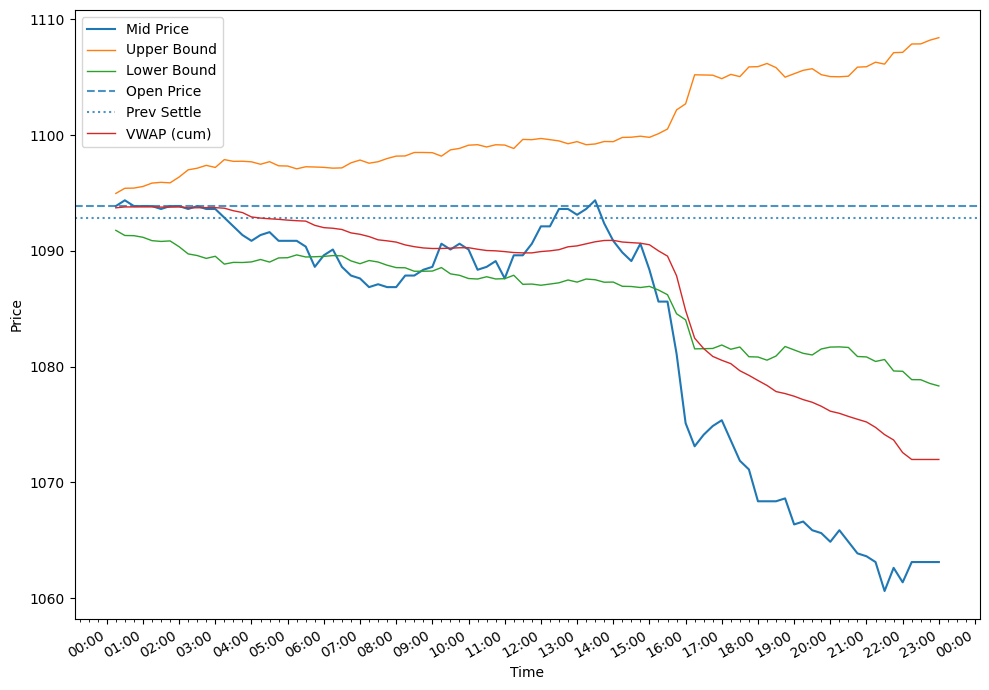

In [51]:

day_str = "2010-07-16"
day = pd.to_datetime(day_str).date()

one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

# Backtest strategy on one day

In [52]:
day_str = "2010-07-16"
day = pd.to_datetime(day_str).date()

one = df[df['expiry_order'] == 1]
one = (one.loc[(one['day'] == day)]
         .sort_values('Time')
         .copy())
one = one.sort_values('hour')
one

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
502696,2010-07-16 00:15:00+00:00,ESU0,1,1093.75,1094.00,1093.725399,00:15,2010-07-16,1093.875,1093.875,1063.125,1092.875,0.000000,0.000000,1094.968875,1091.781125,-0.028111,0.017155
502926,2010-07-16 00:30:00+00:00,ESU0,1,1094.25,1094.50,1093.801985,00:30,2010-07-16,1094.375,1093.875,1063.125,1092.875,0.000457,0.000407,1095.413835,1091.336572,-0.028111,0.017155
503156,2010-07-16 00:45:00+00:00,ESU0,1,1093.75,1094.00,1093.804603,00:45,2010-07-16,1093.875,1093.875,1063.125,1092.875,0.000000,0.000422,1095.430187,1091.320234,-0.028111,0.017155
503386,2010-07-16 01:00:00+00:00,ESU0,1,1093.75,1094.00,1093.810111,01:00,2010-07-16,1093.875,1093.875,1063.125,1092.875,0.000000,0.000550,1095.569983,1091.180567,-0.028111,0.017155
503616,2010-07-16 01:15:00+00:00,ESU0,1,1093.75,1094.00,1093.810674,01:15,2010-07-16,1093.875,1093.875,1063.125,1092.875,0.000000,0.000816,1095.861479,1090.889337,-0.028111,0.017155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528599,2010-07-16 22:00:00+00:00,ESU0,1,1061.25,1061.50,1072.579453,22:00,2010-07-16,1061.375,1093.875,1063.125,1092.875,0.029711,0.011142,1107.156597,1079.604544,-0.028111,0.017155
528900,2010-07-16 22:15:00+00:00,ESU0,1,1063.00,1063.25,1071.986192,22:15,2010-07-16,1063.125,1093.875,1063.125,1092.875,0.028111,0.011801,1107.878163,1078.883639,-0.028111,0.017155
529201,2010-07-16 22:30:00+00:00,ESU0,1,1063.00,1063.25,1071.986192,22:30,2010-07-16,1063.125,1093.875,1063.125,1092.875,0.028111,0.011810,1107.887321,1078.874488,-0.028111,0.017155
529502,2010-07-16 22:45:00+00:00,ESU0,1,1063.00,1063.25,1071.986192,22:45,2010-07-16,1063.125,1093.875,1063.125,1092.875,0.028111,0.012101,1108.205999,1078.556102,-0.028111,0.017155


In [53]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
            .sort_values('Time')
            .copy())
    backtest_df = backtest_df.sort_values('hour')
    
    position = 0
    sigma_target = 0.02
    total_shares_to_hold = math.floor(initial_cash * min(4, sigma_target/backtest_df['ret_std_14d'].values[0] / backtest_df['open_price'].values[0]))

    bid_list = backtest_df['bid_px_00'].values
    ask_list = backtest_df['ask_px_00'].values
    upper_bound = backtest_df['upper_bound'].values
    lower_bound = backtest_df['lower_bound'].values
    vwap_list = backtest_df['vwap_cum'].values
    hour = backtest_df['hour'].values

    if not (len(bid_list) == len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound)):
        return initial_cash
    elif any(pd.isna(x) for x in bid_list + ask_list + vwap_list + upper_bound + lower_bound):
        return initial_cash

    for i in range(len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i])>= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * bid_list[i]
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * ask_list[i]
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * ask_list[-1]
        # print(f"Sold {position} shares at {ask_list[-1]} on {day_str} at {hour[-1]}")
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * bid_list[-1]
        # print(f"Bought {abs(position)} shares at {bid_list[-1]} on {day_str} at {hour[-1]}")
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [54]:
backtest_one_day(df, "2010-07-16", 1, 100000)

101961.0

# Test backtesting on mutiple day scenario

100000


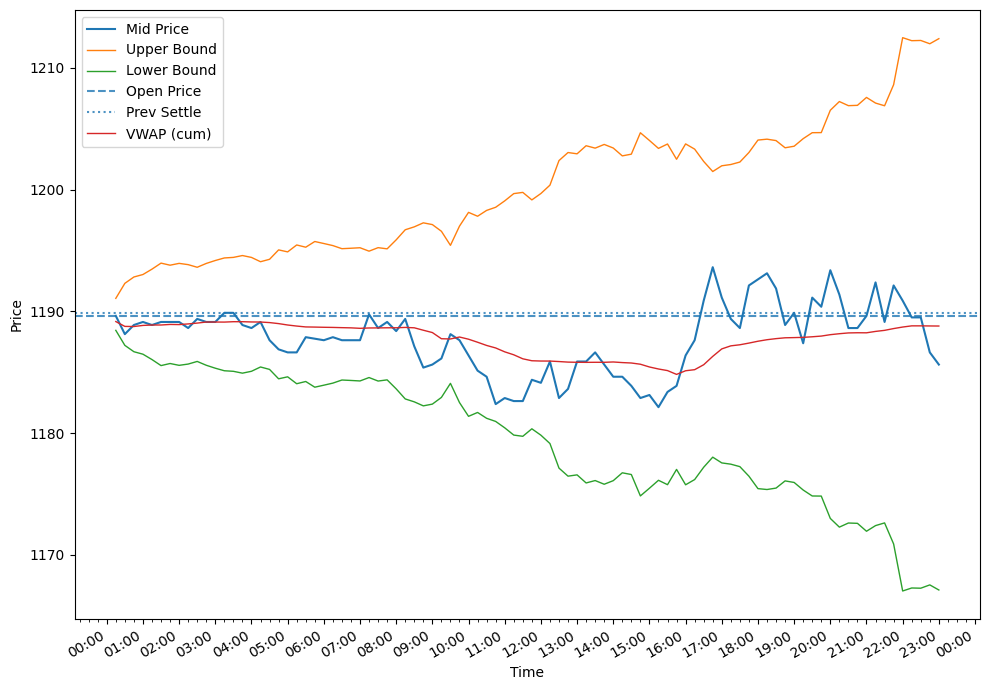

In [55]:
day_str = "2011-10-11"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

100084.0


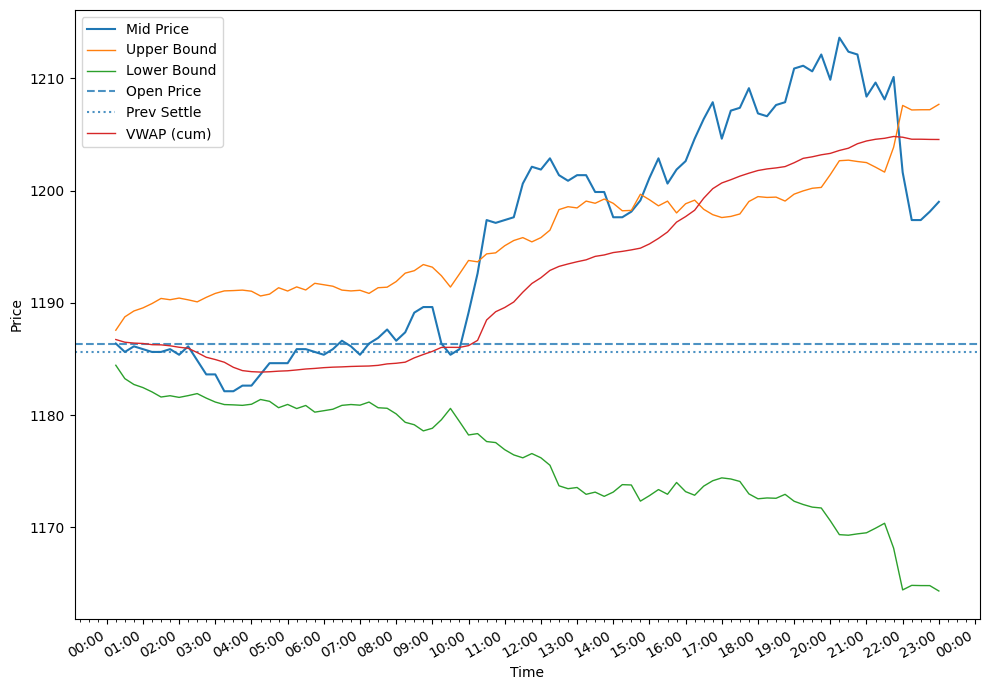

In [56]:
day_str = "2011-10-12"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

92322.25


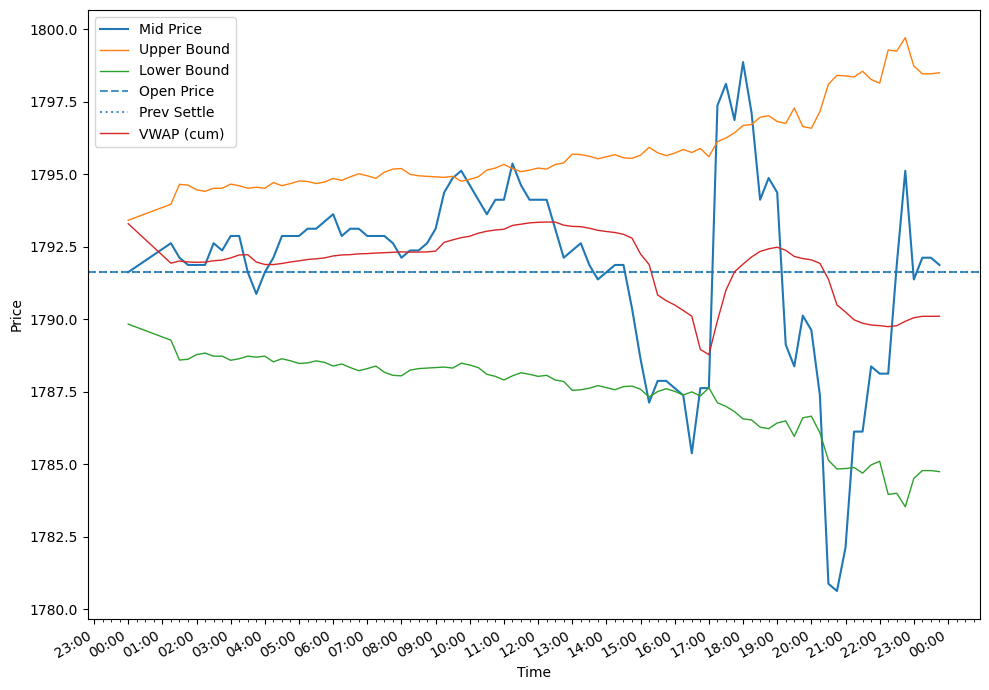

In [57]:
day_str = "2013-12-04"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

# Backtest on all days since 2011

In [58]:
def backtest(backtest_df, rank_to_expiry, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days[15:]:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

In [12]:
results = backtest(df, 1)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-28 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
1,2010-06-29 00:00:00+00:00,100000.00,103690.50,3690.50,0.036905,True
2,2010-06-30 00:00:00+00:00,103690.50,102419.50,-1271.00,-0.012258,True
3,2010-07-01 00:00:00+00:00,102419.50,100012.50,-2407.00,-0.023501,True
4,2010-07-02 00:00:00+00:00,100012.50,98311.50,-1701.00,-0.017008,True
...,...,...,...,...,...,...
3204,2022-01-31 00:00:00+00:00,10156.50,10179.00,22.50,0.002215,True
3205,2022-02-01 00:00:00+00:00,10179.00,10182.00,3.00,0.000295,True
3206,2022-02-02 00:00:00+00:00,10182.00,10182.00,0.00,0.000000,False
3207,2022-02-03 00:00:00+00:00,10182.00,10133.25,-48.75,-0.004788,True


In [59]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [14]:
evaluate_strategy(results)

{'total_return': -0.8986675,
 'irr_annual': -0.16454645117107514,
 'vol_annual': 0.17313496553761332,
 'sharpe': -0.951455190940044,
 'hit_ratio': 0.3565726450239489,
 'mdd': -0.9126188854761673,
 'n_days': 3209,
 'n_traded_days': 1879}

In [15]:
results.sort_values('return')

,date,start_cash,end_cash,pnl,return,traded
945,2013-12-04 00:00:00+00:00,39988.25,36921.50,-3066.75,-0.076691,True
1959,2017-08-09 00:00:00+00:00,16082.75,15010.25,-1072.50,-0.066686,True
439,2012-01-27 00:00:00+00:00,69564.00,64929.50,-4634.50,-0.066622,True
804,2013-05-22 00:00:00+00:00,51067.25,48019.25,-3048.00,-0.059686,True
1644,2016-06-15 00:00:00+00:00,29925.50,28279.00,-1646.50,-0.055020,True
...,...,...,...,...,...,...
1899,2017-05-17 00:00:00+00:00,18622.00,19537.00,915.00,0.049135,True
1960,2017-08-10 00:00:00+00:00,15010.25,15813.50,803.25,0.053513,True
2279,2018-10-10 00:00:00+00:00,10884.75,11539.25,654.50,0.060130,True
1706,2016-09-09 00:00:00+00:00,25276.25,26806.25,1530.00,0.060531,True


# Running strategy for different hyperparameters

In [64]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization):

    ### import the data
    df = pd.read_csv('/data/workspace_files/final_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]


    ### get day and hour
    df["Time"] = pd.to_datetime(df["Time"])
    df["hour"] = df["Time"].dt.strftime("%H:%M")
    df["day"] = df["Time"].dt.date       # gives yyyy-mm-dd


    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    n = 14
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(n, min_periods=n).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily['ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(14, min_periods=14).std())
    )

    df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1)

    return(evaluate_strategy(results))

In [65]:
backtest_with_hyperparameters(0.2, 0.009)

                             Time symbol  expiry_order  bid_px_00  ask_px_00  \
1012050 2019-12-20 23:00:00+00:00   ESZ9             5    3219.25     3220.0   
1012125 2019-12-20 23:15:00+00:00   ESZ9             5    3219.25     3220.0   
1012200 2019-12-20 23:30:00+00:00   ESZ9             5    3219.25     3220.0   
1012275 2019-12-20 23:45:00+00:00   ESZ9             5    3219.25     3220.0   
989810  2019-12-21 00:00:00+00:00   ESZ9             5    3219.25     3220.0   

            vwap_cum   hour         day     price  open_price  settl_price  \
1012050  3209.685285  23:00  2019-12-20  3219.625    3208.250     3219.625   
1012125  3209.685285  23:15  2019-12-20  3219.625    3208.250     3219.625   
1012200  3209.685285  23:30  2019-12-20  3219.625    3208.250     3219.625   
1012275  3209.685285  23:45  2019-12-20  3219.625    3208.250     3219.625   
989810   3209.685285  00:00  2019-12-21  3219.625    3219.625     3219.625   

         settl_price_previous      move  sigma_obs

{'total_return': 0.19805249999999996,
 'irr_annual': 0.014291160719813512,
 'vol_annual': 0.09478315961196032,
 'sharpe': 0.19697515457078632,
 'hit_ratio': 0.4369063772048847,
 'mdd': -0.239896109171047,
 'n_days': 3209,
 'n_traded_days': 737}

In [66]:
import itertools
import math
import numpy as np
import pandas as pd

def run_grid_search(
    backtest_fn,
    p1_values,
    p2_values,
    verbose=True,
):
    """
    backtest_fn: callable like backtest_with_hyperparameters(p1, p2) -> dict
    p1_values, p2_values: iterables of parameter candidates
    """
    rows = []
    for p1, p2 in itertools.product(p1_values, p2_values):
        try:
            res = backtest_fn(p1, p2)  # expected to return a dict with keys shown below
            # Ensure required keys exist (coerce missing to NaN)
            record = {
                "param1": p1,
                "param2": p2,
                "total_return": res.get("total_return", np.nan),
                "irr_annual": res.get("irr_annual", np.nan),
                "vol_annual": res.get("vol_annual", np.nan),
                "sharpe": res.get("sharpe", np.nan),
                "hit_ratio": res.get("hit_ratio", np.nan),
                "mdd": res.get("mdd", np.nan),
                "n_days": res.get("n_days", np.nan),
                "n_traded_days": res.get("n_traded_days", np.nan),
                "error": None,
            }
        except Exception as e:
            record = {
                "param1": p1,
                "param2": p2,
                "total_return": np.nan,
                "irr_annual": np.nan,
                "vol_annual": np.nan,
                "sharpe": np.nan,
                "hit_ratio": np.nan,
                "mdd": np.nan,
                "n_days": np.nan,
                "n_traded_days": np.nan,
                "error": str(e),
            }
        rows.append(record)

    df = pd.DataFrame(rows)

    # Keep only successful runs with finite metrics
    ok = df[df["error"].isna()].copy()
    for c in ["total_return", "sharpe"]:
        ok = ok[np.isfinite(ok[c])]

    if ok.empty:
        if verbose:
            print("No successful runs with finite metrics.")
        # Still return the full df for debugging
        return {
            "all_results": df.sort_values(["param1", "param2"]).reset_index(drop=True),
            "best_total_return": None,
            "best_sharpe": None,
        }

    # Best by total return
    idx_ret = ok["total_return"].idxmax()
    best_ret = ok.loc[idx_ret].to_dict()

    # Best by Sharpe
    idx_sharpe = ok["sharpe"].idxmax()
    best_sharpe = ok.loc[idx_sharpe].to_dict()

    if verbose:
        print("=== Best by total_return ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, "
            f"total_return={best_ret['total_return']:.6f}, "
            f"sharpe={best_ret['sharpe']:.6f}, vol_annual={best_ret['vol_annual']:.6f}, "
            f"hit_ratio={best_ret['hit_ratio']:.4f}, mdd={best_ret['mdd']:.4f}, "
            f"n_days={int(best_ret['n_days']) if not math.isnan(best_ret['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_ret['n_traded_days']) if not math.isnan(best_ret['n_traded_days']) else 'NA'}"
        )
        print("\n=== Best by sharpe ===")
        print(
            f"param1={best_sharpe['param1']}, param2={best_sharpe['param2']}, "
            f"sharpe={best_sharpe['sharpe']:.6f}, "
            f"total_return={best_sharpe['total_return']:.6f}, vol_annual={best_sharpe['vol_annual']:.6f}, "
            f"hit_ratio={best_sharpe['hit_ratio']:.4f}, mdd={best_sharpe['mdd']:.4f}, "
            f"n_days={int(best_sharpe['n_days']) if not math.isnan(best_sharpe['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_sharpe['n_traded_days']) if not math.isnan(best_sharpe['n_traded_days']) else 'NA'}"
        )

    return {
        "all_results": df.sort_values(["param1", "param2"]).reset_index(drop=True),
        "best_total_return": best_ret,
        "best_sharpe": best_sharpe,
    }

In [ ]:

# ===== Example usage (adjust grids as you like) =====
# Your function name:
# backtest_with_hyperparameters(param1, param2) -> dict

# Example grids:
p1_grid = np.round(np.linspace(0.0, 2.0, 5), 6)     # e.g., 0.90 … 1.30
p2_grid = np.round(np.linspace(0.005, 0.012, 4), 6)       # e.g., 0.0001 … 0.01

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

# (optional) save the whole sweep
# all_runs_df.to_csv("/data/workspace_files/hyperparam_sweep.csv", index=False)

In [105]:
top10_sharpe

,param1,param2,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
14,0.222222,0.009444,0.188265,0.044427,0.102638,0.474660,0.433140,-0.153290,1000,344,None
32,0.666667,0.007222,0.160148,0.038143,0.094247,0.444026,0.415152,-0.149847,1000,330,None
5,0.000000,0.010556,0.166860,0.039654,0.101383,0.434020,0.415042,-0.160090,1000,359,None
22,0.444444,0.007222,0.157377,0.037518,0.107427,0.396232,0.404639,-0.173427,1000,388,None
23,0.444444,0.008333,0.108742,0.026354,0.098824,0.312472,0.443769,-0.154552,1000,329,None
4,0.000000,0.009444,0.115635,0.027958,0.113012,0.300279,0.410891,-0.169925,1000,404,None
12,0.222222,0.007222,0.113650,0.027497,0.122105,0.282850,0.396624,-0.200294,1000,474,None
21,0.444444,0.006111,0.075485,0.018508,0.122958,0.210248,0.382289,-0.186200,1000,463,None
31,0.666667,0.006111,0.061052,0.015046,0.111508,0.189425,0.409574,-0.190105,1000,376,None
13,0.222222,0.008333,0.055060,0.013598,0.112028,0.176341,0.393939,-0.180435,1000,396,None


In [106]:
top10_return

,param1,param2,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
14,0.222222,0.009444,0.188265,0.044427,0.102638,0.474660,0.433140,-0.153290,1000,344,None
5,0.000000,0.010556,0.166860,0.039654,0.101383,0.434020,0.415042,-0.160090,1000,359,None
32,0.666667,0.007222,0.160148,0.038143,0.094247,0.444026,0.415152,-0.149847,1000,330,None
22,0.444444,0.007222,0.157377,0.037518,0.107427,0.396232,0.404639,-0.173427,1000,388,None
4,0.000000,0.009444,0.115635,0.027958,0.113012,0.300279,0.410891,-0.169925,1000,404,None
12,0.222222,0.007222,0.113650,0.027497,0.122105,0.282850,0.396624,-0.200294,1000,474,None
23,0.444444,0.008333,0.108742,0.026354,0.098824,0.312472,0.443769,-0.154552,1000,329,None
21,0.444444,0.006111,0.075485,0.018508,0.122958,0.210248,0.382289,-0.186200,1000,463,None
31,0.666667,0.006111,0.061052,0.015046,0.111508,0.189425,0.409574,-0.190105,1000,376,None
13,0.222222,0.008333,0.055060,0.013598,0.112028,0.176341,0.393939,-0.180435,1000,396,None


In [18]:
p1_grid = np.round(np.linspace(0.1, 0.4, 8), 6)     # e.g., 0.90 … 1.30
p2_grid = np.round(np.linspace(0.007, 0.011, 8), 6)

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

                             Time symbol  expiry_order  bid_px_00  ask_px_00  \
1012050 2019-12-20 23:00:00+00:00   ESZ9             5    3219.25     3220.0   
1012125 2019-12-20 23:15:00+00:00   ESZ9             5    3219.25     3220.0   
1012200 2019-12-20 23:30:00+00:00   ESZ9             5    3219.25     3220.0   
1012275 2019-12-20 23:45:00+00:00   ESZ9             5    3219.25     3220.0   
989810  2019-12-21 00:00:00+00:00   ESZ9             5    3219.25     3220.0   

            vwap_cum   hour         day     price  open_price  settl_price  \
1012050  3209.685285  23:00  2019-12-20  3219.625    3208.250     3219.625   
1012125  3209.685285  23:15  2019-12-20  3219.625    3208.250     3219.625   
1012200  3209.685285  23:30  2019-12-20  3219.625    3208.250     3219.625   
1012275  3209.685285  23:45  2019-12-20  3219.625    3208.250     3219.625   
989810   3209.685285  00:00  2019-12-21  3219.625    3219.625     3219.625   

         settl_price_previous      move  sigma_obs

KeyboardInterrupt: KeyboardInterrupt

In [108]:
top10_return

,param1,param2,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
98,0.228571,0.009286,0.330185,0.074548,0.102152,0.754780,0.445087,-0.150062,1000,346,None
54,0.164286,0.009571,0.313775,0.071192,0.103184,0.717907,0.441595,-0.154723,1000,351,None
68,0.185714,0.009286,0.293532,0.067009,0.103932,0.675873,0.439776,-0.159341,1000,357,None
83,0.207143,0.009286,0.291967,0.066683,0.104167,0.671647,0.450142,-0.163907,1000,351,None
127,0.271429,0.009000,0.277480,0.063656,0.103239,0.649227,0.443478,-0.160270,1000,345,None
97,0.228571,0.009000,0.275478,0.063236,0.104014,0.641354,0.447887,-0.158727,1000,355,None
112,0.250000,0.009000,0.259825,0.059932,0.103886,0.612060,0.448571,-0.155974,1000,350,None
39,0.142857,0.009571,0.258933,0.059743,0.103831,0.610597,0.431373,-0.163768,1000,357,None
10,0.100000,0.009857,0.249972,0.057837,0.103516,0.594750,0.428969,-0.157450,1000,359,None
53,0.164286,0.009286,0.249832,0.057808,0.104952,0.587787,0.436813,-0.163084,1000,364,None


In [109]:
top10_sharpe

,param1,param2,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
98,0.228571,0.009286,0.330185,0.074548,0.102152,0.754780,0.445087,-0.150062,1000,346,None
54,0.164286,0.009571,0.313775,0.071192,0.103184,0.717907,0.441595,-0.154723,1000,351,None
68,0.185714,0.009286,0.293532,0.067009,0.103932,0.675873,0.439776,-0.159341,1000,357,None
83,0.207143,0.009286,0.291967,0.066683,0.104167,0.671647,0.450142,-0.163907,1000,351,None
127,0.271429,0.009000,0.277480,0.063656,0.103239,0.649227,0.443478,-0.160270,1000,345,None
97,0.228571,0.009000,0.275478,0.063236,0.104014,0.641354,0.447887,-0.158727,1000,355,None
112,0.250000,0.009000,0.259825,0.059932,0.103886,0.612060,0.448571,-0.155974,1000,350,None
39,0.142857,0.009571,0.258933,0.059743,0.103831,0.610597,0.431373,-0.163768,1000,357,None
10,0.100000,0.009857,0.249972,0.057837,0.103516,0.594750,0.428969,-0.157450,1000,359,None
141,0.292857,0.008714,0.247763,0.057366,0.103526,0.590394,0.441595,-0.155303,1000,351,None


# Plot best strategy

In [134]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound):

    ### import the data
    df = pd.read_csv('/data/workspace_files/final_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]


    ### get day and hour
    df["Time"] = pd.to_datetime(df["Time"])
    df["hour"] = df["Time"].dt.strftime("%H:%M")
    df["day"] = df["Time"].dt.date       # gives yyyy-mm-dd


    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    n = 60
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1)

    return results


In [135]:
results = backtest_with_hyperparameters(0.142857, 0.008143, 30, 30)
results

TypeError: TypeError: backtest() missing 1 required positional argument: 'sigma_target'

In [87]:
results.sort_values('return')

,date,start_cash,end_cash,pnl,return,traded
3004,2021-05-11 00:00:00+00:00,219986.75,206213.25,-13773.50,-0.062611,True
2099,2018-02-06 00:00:00+00:00,209270.00,199337.00,-9933.00,-0.047465,True
305,2011-08-05 00:00:00+00:00,114942.25,110832.25,-4110.00,-0.035757,True
3202,2022-01-28 00:00:00+00:00,212648.25,205377.00,-7271.25,-0.034194,True
1220,2014-12-09 00:00:00+00:00,146210.00,141480.00,-4730.00,-0.032351,True
...,...,...,...,...,...,...
2749,2020-06-11 00:00:00+00:00,213582.25,224522.25,10940.00,0.051221,True
2676,2020-03-02 00:00:00+00:00,187915.75,197587.75,9672.00,0.051470,True
1706,2016-09-09 00:00:00+00:00,168491.00,178340.00,9849.00,0.058454,True
2098,2018-02-05 00:00:00+00:00,196137.25,209270.00,13132.75,0.066957,True


In [88]:

evaluate_strategy(results, risk_free_rate=0.03)

{'total_return': 1.0760675000000002,
 'irr_annual': 0.059040816997458334,
 'vol_annual': 0.10262110240440747,
 'sharpe': 0.32185207795876836,
 'hit_ratio': 0.4429223744292237,
 'mdd': -0.1868005447508004,
 'n_days': 3209,
 'n_traded_days': 657}

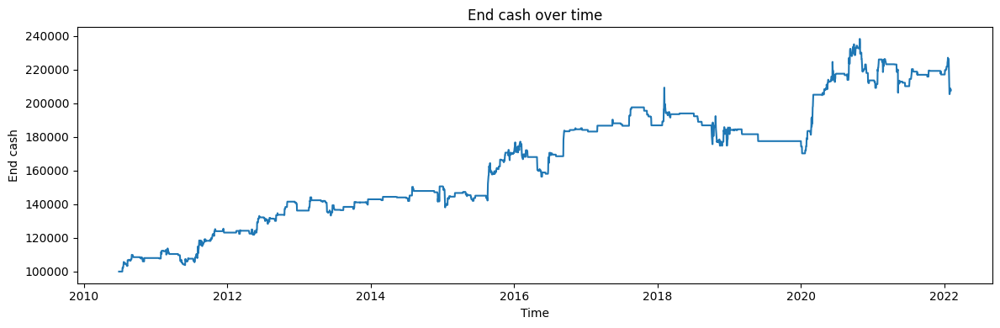

In [89]:
s = results.copy()

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

# Addding more hyperparameters

In [136]:
import numpy as np
import math
import pandas as pd

def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = min(4.0, sigma_target / ret_std)  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(n - 1):
        # Long region: price breaking above both local band and trend
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                cash -= shares_to_buy * ask_list[i]

        # Short region: price breaking below both local band and trend
        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold  # positive number
                position -= shares_to_sell
                cash += shares_to_sell * bid_list[i]

        # Flat/inside band: close any open position
        elif (bid_list[i] >= min(vwap_list[i], lower_bound[i])) and \
             (bid_list[i] <= max(upper_bound[i], vwap_list[i])):
            if position > 0:  # close long at bid
                cash += position * bid_list[i]
                position = 0
            elif position < 0:  # close short at ask
                cash -= abs(position) * ask_list[i]
                position = 0

    # Close at the last tick (use correct side of book)
    if position > 0:      # close long at bid
        cash += position * bid_list[-1]
        position = 0
    elif position < 0:    # close short at ask
        cash -= abs(position) * ask_list[-1]
        position = 0

    return cash

backtest_one_day(df, "2011-10-10", 1, 100000, 0.02)

101423.5

In [137]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
1,2010-06-08 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
2,2010-06-09 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
3,2010-06-10 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
4,2010-06-11 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
...,...,...,...,...,...,...
3219,2022-01-31 00:00:00+00:00,15919.75,15956.00,36.25,0.002277,True
3220,2022-02-01 00:00:00+00:00,15956.00,15959.75,3.75,0.000235,True
3221,2022-02-02 00:00:00+00:00,15959.75,15959.75,0.00,0.000000,False
3222,2022-02-03 00:00:00+00:00,15959.75,15878.50,-81.25,-0.005091,True


In [138]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    ### import the data
    df = pd.read_csv('/data/workspace_files/final_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]


    ### get day and hour
    df["Time"] = pd.to_datetime(df["Time"])
    df["hour"] = df["Time"].dt.strftime("%H:%M")
    df["day"] = df["Time"].dt.date       # gives yyyy-mm-dd


    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return evaluate_strategy(results, risk_free_rate=0.03)


In [139]:
import itertools
import math
import numpy as np
import pandas as pd

def run_grid_search(
    backtest_fn,
    p1_values,
    p2_values,
    p3_values,
    p4_values,
    p5_values,
    verbose=True,
):
    """
    backtest_fn: callable like backtest_with_hyperparameters(p1, p2) -> dict
    p1_values, p2_values: iterables of parameter candidates
    """
    rows = []
    for p1, p2, p3, p4, p5 in itertools.product(p1_values, p2_values, p3_values, p4_values, p5_values):
        try:
            res = backtest_fn(p1, p2, p3, p4, p5)  # expected to return a dict with keys shown below
            # Ensure required keys exist (coerce missing to NaN)
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": res.get("total_return", np.nan),
                "irr_annual": res.get("irr_annual", np.nan),
                "vol_annual": res.get("vol_annual", np.nan),
                "sharpe": res.get("sharpe", np.nan),
                "hit_ratio": res.get("hit_ratio", np.nan),
                "mdd": res.get("mdd", np.nan),
                "n_days": res.get("n_days", np.nan),
                "n_traded_days": res.get("n_traded_days", np.nan),
                "error": None,
            }
        except Exception as e:
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": np.nan,
                "irr_annual": np.nan,
                "vol_annual": np.nan,
                "sharpe": np.nan,
                "hit_ratio": np.nan,
                "mdd": np.nan,
                "n_days": np.nan,
                "n_traded_days": np.nan,
                "error": str(e),
            }
        rows.append(record)
        print(record)

    df = pd.DataFrame(rows)

    # Keep only successful runs with finite metrics
    ok = df[df["error"].isna()].copy()
    for c in ["total_return", "sharpe"]:
        ok = ok[np.isfinite(ok[c])]

    if ok.empty:
        if verbose:
            print("No successful runs with finite metrics.")
        # Still return the full df for debugging
        return {
            "all_results": df.sort_values(["param1", "param2", "param3", "param4", "param5"]).reset_index(drop=True),
            "best_total_return": None,
            "best_sharpe": None,
        }

    # Best by total return
    idx_ret = ok["total_return"].idxmax()
    best_ret = ok.loc[idx_ret].to_dict()

    # Best by Sharpe
    idx_sharpe = ok["sharpe"].idxmax()
    best_sharpe = ok.loc[idx_sharpe].to_dict()

    if verbose:
        print("=== Best by total_return ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, param3={best_ret['param3']}, param4={best_ret['param4']}, param5={best_ret['param5']}"
            f"total_return={best_ret['total_return']:.6f}, "
            f"sharpe={best_ret['sharpe']:.6f}, vol_annual={best_ret['vol_annual']:.6f}, "
            f"hit_ratio={best_ret['hit_ratio']:.4f}, mdd={best_ret['mdd']:.4f}, "
            f"n_days={int(best_ret['n_days']) if not math.isnan(best_ret['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_ret['n_traded_days']) if not math.isnan(best_ret['n_traded_days']) else 'NA'}"
        )
        print("\n=== Best by sharpe ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, param3={best_ret['param3']}, param4={best_ret['param4']}, param5={best_ret['param5']}"
            f"sharpe={best_sharpe['sharpe']:.6f}, "
            f"total_return={best_sharpe['total_return']:.6f}, vol_annual={best_sharpe['vol_annual']:.6f}, "
            f"hit_ratio={best_sharpe['hit_ratio']:.4f}, mdd={best_sharpe['mdd']:.4f}, "
            f"n_days={int(best_sharpe['n_days']) if not math.isnan(best_sharpe['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_sharpe['n_traded_days']) if not math.isnan(best_sharpe['n_traded_days']) else 'NA'}"
        )

    return {
        "all_results": df.sort_values(["param1", "param2", 'param3', 'param4', 'param5']).reset_index(drop=True),
        "best_total_return": best_ret,
        "best_sharpe": best_sharpe,
    }

In [143]:
p1_grid = [0.1, 0.15, 0.2, 0.25]
p2_grid = [0.007, 0.008, 0.009, 0.01, 0.011]
p3_grid = [14, 30, 45]
p4_grid = [18, 14, 10]
p5_grid = [0.10]

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

{'param1': 0.1, 'param2': 0.007, 'param3': 14, 'param4': 18, 'param5': 0.1, 'total_return': 4.274415, 'irr_annual': 0.13880107110349238, 'vol_annual': 0.27014865225712814, 'sharpe': 0.5047788567702931, 'hit_ratio': 0.439047619047619, 'mdd': -0.34061074135974506, 'n_days': 3224, 'n_traded_days': 1050, 'error': None}
{'param1': 0.1, 'param2': 0.007, 'param3': 14, 'param4': 14, 'param5': 0.1, 'total_return': 4.858525, 'irr_annual': 0.14818859431066378, 'vol_annual': 0.2757966750948892, 'sharpe': 0.5297030096284723, 'hit_ratio': 0.4369369369369369, 'mdd': -0.3268731705664352, 'n_days': 3224, 'n_traded_days': 1110, 'error': None}
{'param1': 0.1, 'param2': 0.007, 'param3': 14, 'param4': 10, 'param5': 0.1, 'total_return': 5.0243275, 'irr_annual': 0.15069597950000158, 'vol_annual': 0.2803416873823893, 'sharpe': 0.5334380817821253, 'hit_ratio': 0.43556701030927836, 'mdd': -0.32966352143359196, 'n_days': 3224, 'n_traded_days': 1164, 'error': None}
{'param1': 0.1, 'param2': 0.007, 'param3': 30, '

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
0,0.10,0.007,14,10,0.1,5.024328,0.150696,0.280342,0.533438,0.435567,-0.329664,3224,1164,None
1,0.10,0.007,14,14,0.1,4.858525,0.148189,0.275797,0.529703,0.436937,-0.326873,3224,1110,None
2,0.10,0.007,14,18,0.1,4.274415,0.138801,0.270149,0.504779,0.439048,-0.340611,3224,1050,None
3,0.10,0.007,30,10,0.1,4.638648,0.144761,0.280109,0.515241,0.436253,-0.329632,3224,1153,None
4,0.10,0.007,30,14,0.1,4.501775,0.142564,0.273654,0.513843,0.437671,-0.326864,3224,1099,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,0.25,0.011,30,14,0.1,0.104600,0.007806,0.188499,-0.022819,0.414122,-0.548948,3224,524,None
176,0.25,0.011,30,18,0.1,0.182368,0.013180,0.185330,0.002020,0.416834,-0.550048,3224,499,None
177,0.25,0.011,45,10,0.1,-0.019173,-0.001512,0.197850,-0.059390,0.412879,-0.552804,3224,528,None
178,0.25,0.011,45,14,0.1,0.052523,0.004009,0.188726,-0.042585,0.410405,-0.548907,3224,519,None


In [145]:
top10_return

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
54,0.15,0.008,14,10,0.1,9.805430,0.204463,0.249375,0.749236,0.432692,-0.313082,3224,936,None
57,0.15,0.008,30,10,0.1,8.800815,0.195311,0.248972,0.719380,0.432578,-0.313092,3224,927,None
9,0.10,0.008,14,10,0.1,8.678323,0.194136,0.254655,0.705076,0.437690,-0.305654,3224,987,None
99,0.20,0.008,14,10,0.1,8.441405,0.191825,0.241980,0.721024,0.430976,-0.286782,3224,891,None
12,0.10,0.008,30,10,0.1,8.180338,0.189216,0.254250,0.689480,0.437628,-0.305507,3224,978,None
60,0.15,0.008,45,10,0.1,7.704937,0.184283,0.250619,0.679179,0.430903,-0.313013,3224,919,None
55,0.15,0.008,14,14,0.1,7.624670,0.183426,0.245539,0.685550,0.427624,-0.373514,3224,905,None
45,0.15,0.007,14,10,0.1,7.617420,0.183348,0.274522,0.640566,0.438061,-0.309537,3224,1114,None
102,0.20,0.008,30,10,0.1,7.422010,0.181229,0.241464,0.685058,0.430839,-0.286879,3224,882,None
90,0.20,0.007,14,10,0.1,7.216162,0.178946,0.263403,0.641983,0.426580,-0.308379,3224,1076,None


In [146]:
top10_sharpe

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
54,0.15,0.008,14,10,0.1,9.805430,0.204463,0.249375,0.749236,0.432692,-0.313082,3224,936,None
99,0.20,0.008,14,10,0.1,8.441405,0.191825,0.241980,0.721024,0.430976,-0.286782,3224,891,None
57,0.15,0.008,30,10,0.1,8.800815,0.195311,0.248972,0.719380,0.432578,-0.313092,3224,927,None
9,0.10,0.008,14,10,0.1,8.678323,0.194136,0.254655,0.705076,0.437690,-0.305654,3224,987,None
12,0.10,0.008,30,10,0.1,8.180338,0.189216,0.254250,0.689480,0.437628,-0.305507,3224,978,None
55,0.15,0.008,14,14,0.1,7.624670,0.183426,0.245539,0.685550,0.427624,-0.373514,3224,905,None
102,0.20,0.008,30,10,0.1,7.422010,0.181229,0.241464,0.685058,0.430839,-0.286879,3224,882,None
60,0.15,0.008,45,10,0.1,7.704937,0.184283,0.250619,0.679179,0.430903,-0.313013,3224,919,None
100,0.20,0.008,14,14,0.1,7.104413,0.177685,0.239024,0.677078,0.429569,-0.328864,3224,859,None
58,0.15,0.008,30,14,0.1,6.930867,0.175694,0.242513,0.664065,0.427455,-0.373442,3224,896,None


In [169]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    ### import the data
    df = pd.read_csv('/data/workspace_files/final_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]


    ### get day and hour
    df["Time"] = pd.to_datetime(df["Time"])
    df["hour"] = df["Time"].dt.strftime("%H:%M")
    df["day"] = df["Time"].dt.date       # gives yyyy-mm-dd


    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results

results = backtest_with_hyperparameters(0.17, 0.008, 14, 10, 0.1)


In [170]:
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
1,2010-06-08 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
2,2010-06-09 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
3,2010-06-10 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
4,2010-06-11 00:00:00+00:00,100000.00,100000.00,0.00,0.000000,False
...,...,...,...,...,...,...
3219,2022-01-31 00:00:00+00:00,1053891.00,1072255.50,18364.50,0.017425,True
3220,2022-02-01 00:00:00+00:00,1072255.50,1081557.00,9301.50,0.008675,True
3221,2022-02-02 00:00:00+00:00,1081557.00,1081557.00,0.00,0.000000,False
3222,2022-02-03 00:00:00+00:00,1081557.00,1062774.75,-18782.25,-0.017366,True


In [172]:
evaluate_strategy(results, risk_free_rate=0.05)

{'total_return': 9.6277475,
 'irr_annual': 0.20290275014222403,
 'vol_annual': 0.24647969938389933,
 'sharpe': 0.6718588992765868,
 'hit_ratio': 0.43435448577680524,
 'mdd': -0.3103852240270394,
 'n_days': 3224,
 'n_traded_days': 914}

# Best strategy plots

In [173]:
results = backtest_with_hyperparameters(0.16, 0.008, 14, 10, 0.1)

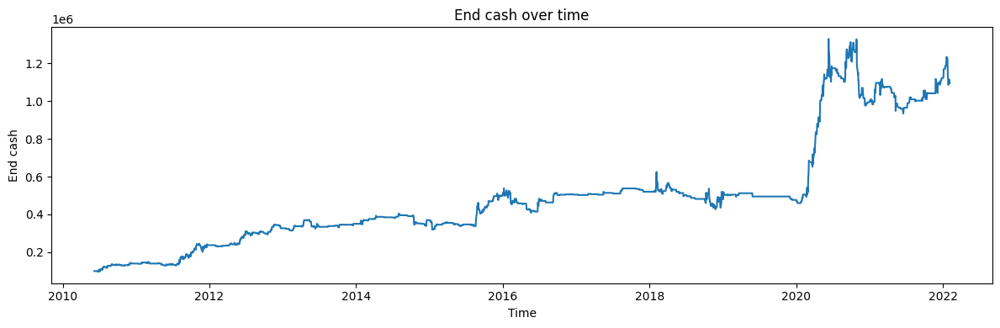

In [175]:
s = results.copy()

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

In [176]:
evaluate_strategy(results, risk_free_rate=0.05)

{'total_return': 9.9572425,
 'irr_annual': 0.20577693743656567,
 'vol_annual': 0.2485176081354407,
 'sharpe': 0.6779464166207922,
 'hit_ratio': 0.43506493506493504,
 'mdd': -0.3157707792090911,
 'n_days': 3224,
 'n_traded_days': 924}

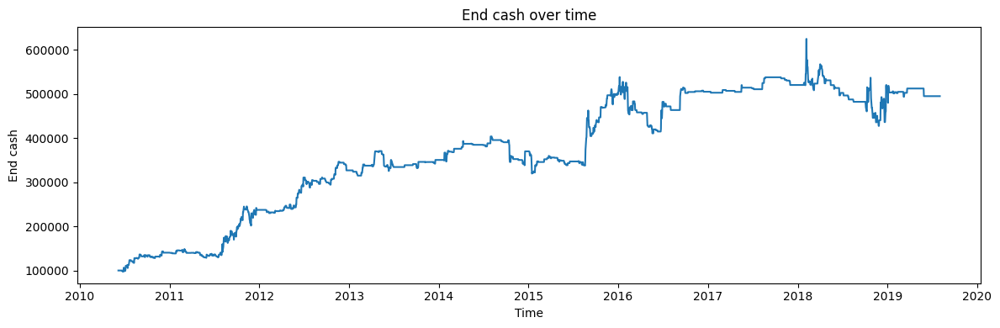

In [177]:
s = results.copy()

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date[:-700], s["end_cash"][:-700].astype(float))
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

In [181]:
evaluate_strategy(results[:-700], risk_free_rate=0.)

{'total_return': 3.9509675,
 'irr_annual': 0.17316450348992318,
 'vol_annual': 0.2317715375305038,
 'sharpe': 0.802508701011663,
 'hit_ratio': 0.42058823529411765,
 'mdd': -0.3157707792090911,
 'n_days': 2524,
 'n_traded_days': 680}

# Strat1

In [2]:
### Stop opposite band + fix bet size

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import datetime as dt
import matplotlib.dates as mdates

In [2]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
df[df['expiry_order']==1]

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
251,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
502,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
753,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1004,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341978,2018-12-20 15:03:00-05:00,ESZ8,1,2468.00,2468.25,2481.013819,15:03,2018-12-20,2468.125,2496.375,2466.500,2506.375,0.011316,0.010853,2533.577270,2469.281262,-0.011967,0.011626
342242,2018-12-20 15:18:00-05:00,ESZ8,1,2476.75,2477.00,2480.622678,15:18,2018-12-20,2476.875,2496.375,2466.500,2506.375,0.007811,0.009820,2530.987472,2471.860727,-0.011967,0.011626
342506,2018-12-20 15:33:00-05:00,ESZ8,1,2477.25,2477.75,2480.571165,15:33,2018-12-20,2477.500,2496.375,2466.500,2506.375,0.007561,0.010542,2532.797138,2470.058282,-0.011967,0.011626
342770,2018-12-20 15:48:00-05:00,ESZ8,1,2463.25,2463.50,2480.296179,15:48,2018-12-20,2463.375,2496.375,2466.500,2506.375,0.013219,0.011686,2535.665573,2467.201291,-0.011967,0.011626


# Runnning strat on one day

In [6]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
            .sort_values('Time')
            .copy())
    backtest_df = backtest_df.sort_values('hour')

    bid_list = backtest_df['bid_px_00'].values
    ask_list = backtest_df['ask_px_00'].values
    upper_bound = backtest_df['upper_bound'].values
    lower_bound = backtest_df['lower_bound'].values
    vwap_list = backtest_df['vwap_cum'].values
    hour = backtest_df['hour'].values

    if not (len(bid_list) == len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound)):
        return initial_cash
    elif any(pd.isna(x) for x in bid_list + ask_list + vwap_list + upper_bound + lower_bound):
        return initial_cash
    

        
    position = 0
    sigma_target = 0.02
    total_shares_to_hold = math.floor(initial_cash / backtest_df['open_price'].values[0])


    

    for i in range(1, len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        # elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
        #     # we must close our position
        #     if position > 0: # we are long so we need to sell
        #         initial_cash += position * bid_list[i]
        #         # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
        #         position = 0
        #     elif position < 0: # we are short so we need to buy
        #         initial_cash -= abs(position) * ask_list[i]
        #         # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
        #         position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * bid_list[-1]
        print(f"Sold {position} shares at {ask_list[-1]} on {day_str} at {hour[-1]}")
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * ask_list[-1]
        print(f"Bought {abs(position)} shares at {bid_list[-1]} on {day_str} at {hour[-1]}")
        position = 0

    return initial_cash

backtest_one_day(df, "2010-10-13", 1, 100000)

Bought 85 shares at 1174.5 on 2010-10-13 at 10:03
Sold 85 shares at 1174.25 on 2010-10-13 at 16:00


99957.5

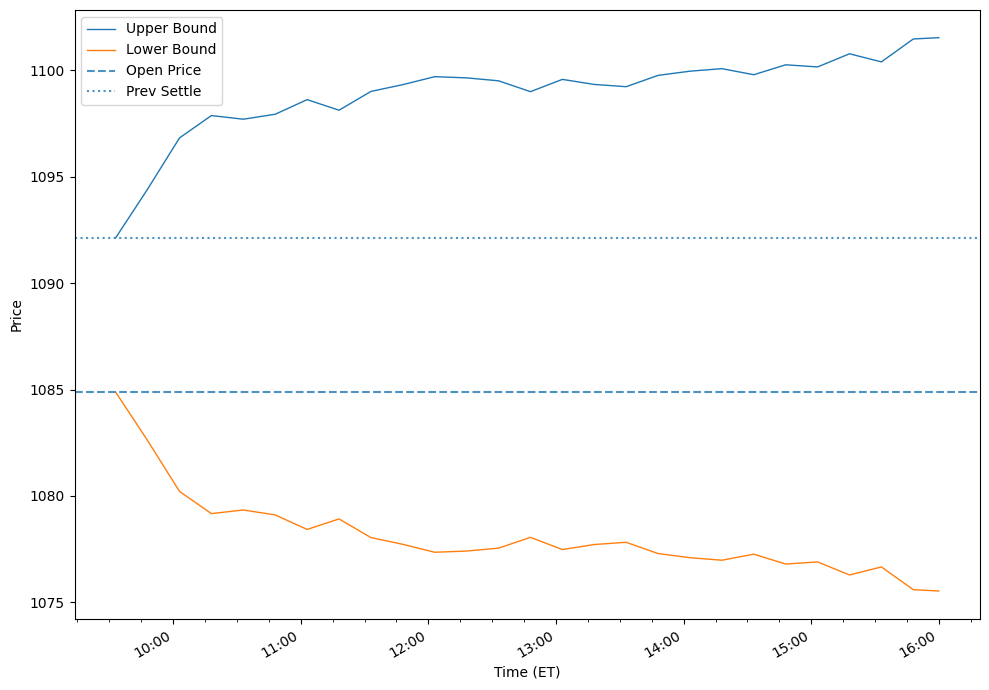

In [4]:
# Ensure Time is tz-aware ET
df["Time"] = pd.to_datetime(df["Time"], utc=True).dt.tz_convert("America/New_York")

# Define day as plain date (no tz needed)
day_str = "2010-07-16"
day = pd.to_datetime(day_str).date()

# Recompute day column in ET if not already done
df["day"] = df["Time"].dt.date

# Filter front-month contract for that day
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

# Plot
fig, ax = plt.subplots(figsize=(10, 7))
x = one['Time']

# ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
#     ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis
import matplotlib.dates as mdates
from zoneinfo import ZoneInfo


tz = ZoneInfo("America/New_York")

ax.xaxis.set_major_locator(mdates.HourLocator(tz=tz))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M', tz=tz))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45], tz=tz))

fig.autofmt_xdate()

ax.set_xlabel("Time (ET)")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

In [38]:
backtest_one_day(df, "2010-07-16", 1, 100000)

101679.0

Bought 53 shares at 1925.0 on 2015-10-02 at 14:33
Sold 53 shares at 1942.0 on 2015-10-02 at 16:00
100887.75


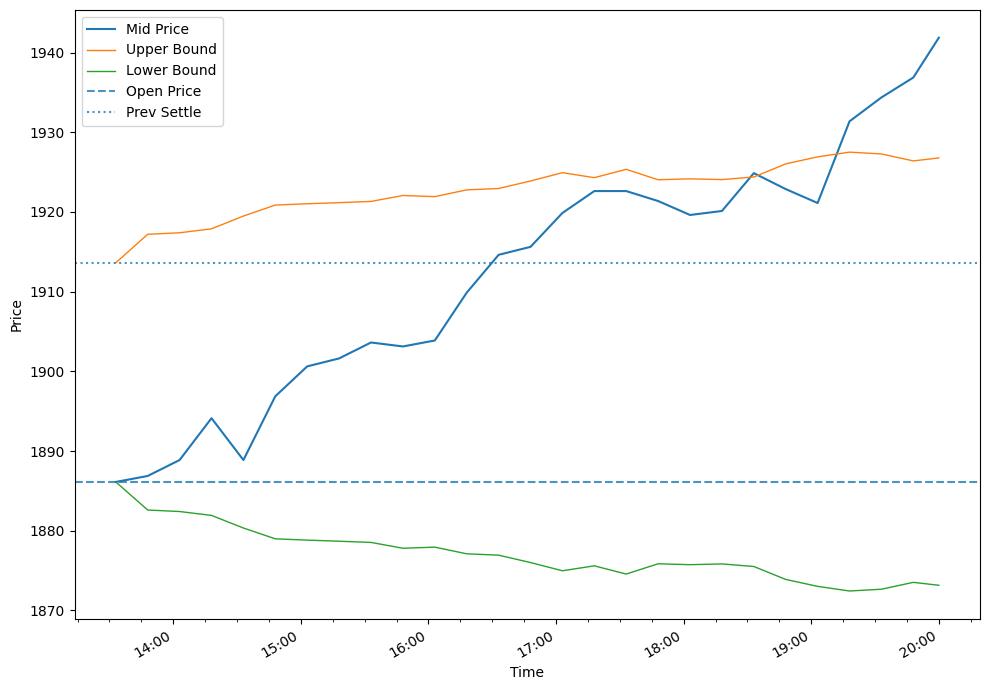

In [7]:
day_str = "2015-10-02"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
# if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
#     ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

Sold 92 shares at 1072.25 on 2011-10-04 at 10:03
Bought 92 shares at 1116.75 on 2011-10-04 at 16:00
95883.0


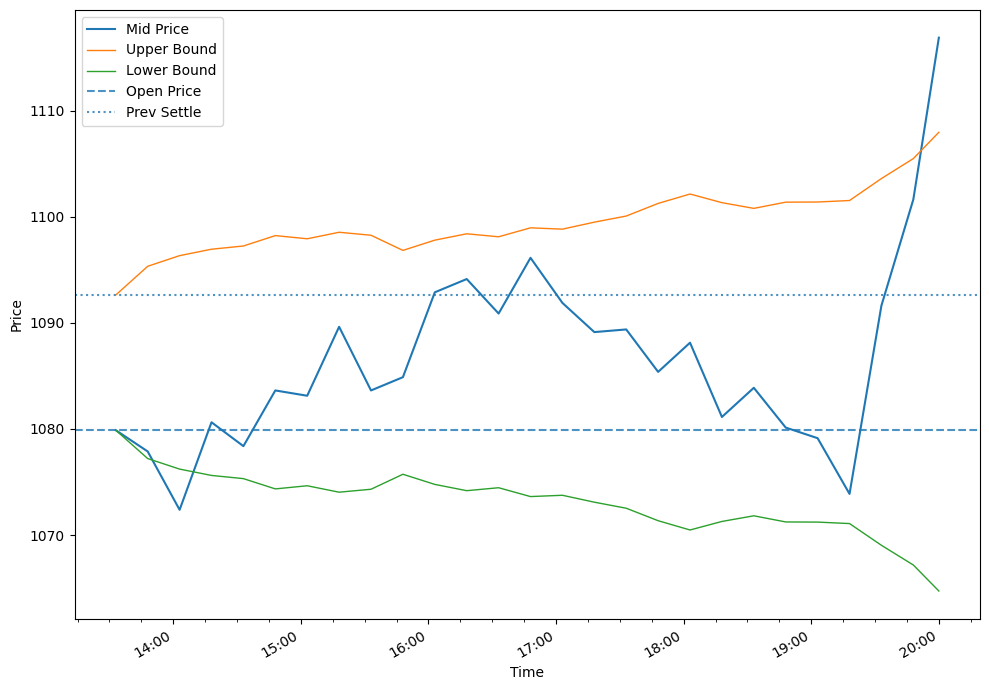

In [8]:
day_str = "2011-10-04"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
# if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
#     ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

# Bactests on all day since 2011

In [41]:
def backtest(backtest_df, rank_to_expiry, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        print(day_ts)
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

In [42]:
results = backtest(df, 1)
results

2010-06-07 00:00:00-04:00
2010-06-08 00:00:00-04:00
2010-06-09 00:00:00-04:00
2010-06-10 00:00:00-04:00
2010-06-11 00:00:00-04:00
2010-06-14 00:00:00-04:00
2010-06-15 00:00:00-04:00
2010-06-16 00:00:00-04:00
2010-06-17 00:00:00-04:00
2010-06-18 00:00:00-04:00
2010-06-21 00:00:00-04:00
2010-06-22 00:00:00-04:00
2010-06-23 00:00:00-04:00
2010-06-24 00:00:00-04:00
2010-06-25 00:00:00-04:00
2010-06-28 00:00:00-04:00
2010-06-29 00:00:00-04:00
2010-06-30 00:00:00-04:00
2010-07-01 00:00:00-04:00
2010-07-02 00:00:00-04:00
2010-07-05 00:00:00-04:00
2010-07-06 00:00:00-04:00
2010-07-07 00:00:00-04:00
2010-07-08 00:00:00-04:00
2010-07-09 00:00:00-04:00
2010-07-12 00:00:00-04:00
2010-07-13 00:00:00-04:00
2010-07-14 00:00:00-04:00
2010-07-15 00:00:00-04:00
2010-07-16 00:00:00-04:00
2010-07-19 00:00:00-04:00
2010-07-20 00:00:00-04:00
2010-07-21 00:00:00-04:00
2010-07-22 00:00:00-04:00
2010-07-23 00:00:00-04:00
2010-07-26 00:00:00-04:00
2010-07-27 00:00:00-04:00
2010-07-28 00:00:00-04:00
2010-07-29 0

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
1,2010-06-08 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
2,2010-06-09 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
3,2010-06-10 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
4,2010-06-11 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
...,...,...,...,...,...,...
2368,2019-09-04 00:00:00-04:00,82320.75,82320.75,0.0,0.0,False
2369,2019-09-05 00:00:00-04:00,82320.75,82320.75,0.0,0.0,False
2370,2019-09-06 00:00:00-04:00,82320.75,82320.75,0.0,0.0,False
2371,2019-09-09 00:00:00-04:00,82320.75,82320.75,0.0,0.0,False


In [45]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [46]:
evaluate_strategy(results)

{'total_return': -0.17679250000000002,
 'irr_annual': -0.0204479039858374,
 'vol_annual': 0.08315173918809515,
 'sharpe': -0.2068908968774287,
 'hit_ratio': 0.4830949284785436,
 'mdd': -0.27873760090554345,
 'n_days': 2373,
 'n_traded_days': 1538}

In [47]:
results.sort_values('return')

,date,start_cash,end_cash,pnl,return,traded
344,2011-10-04 00:00:00-04:00,92431.25,88627.50,-3803.75,-0.041152,True
2150,2018-10-29 00:00:00-04:00,80917.75,77925.25,-2992.50,-0.036982,True
2191,2018-12-27 00:00:00-05:00,82942.00,80383.50,-2558.50,-0.030847,True
394,2011-12-13 00:00:00-05:00,87896.25,85813.75,-2082.50,-0.023693,True
2186,2018-12-19 00:00:00-05:00,80974.00,79098.50,-1875.50,-0.023162,True
...,...,...,...,...,...,...
2190,2018-12-26 00:00:00-05:00,80739.25,82942.00,2202.75,0.027282,True
306,2011-08-11 00:00:00-04:00,89486.50,92172.50,2686.00,0.030016,True
1961,2018-02-05 00:00:00-05:00,74471.00,76732.25,2261.25,0.030364,True
1964,2018-02-08 00:00:00-05:00,76592.00,79021.00,2429.00,0.031713,True


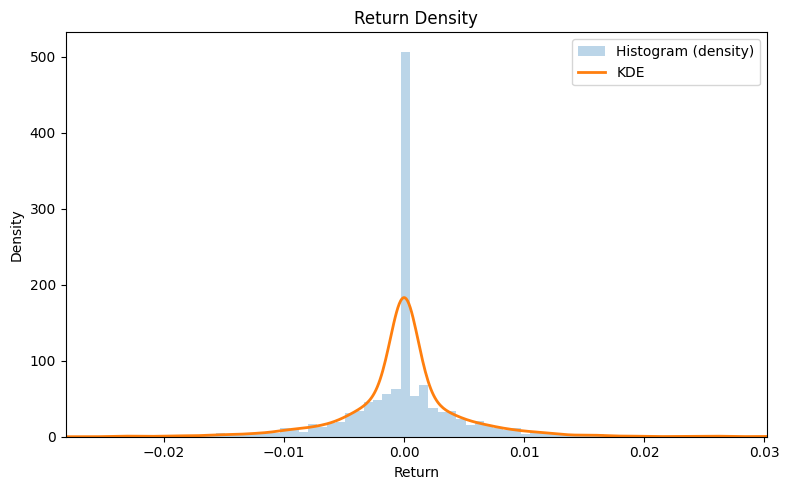

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Clean the series
s = pd.Series(results['return'], dtype='float64')
s = s.replace([np.inf, -np.inf], np.nan).dropna()

fig, ax = plt.subplots(figsize=(8, 5))

# Density histogram
ax.hist(s, bins=100, density=True, alpha=0.3, label='Histogram (density)')

# KDE overlay (if scipy available)
try:
    from scipy.stats import gaussian_kde
    xs = np.linspace(s.quantile(0.001), s.quantile(0.999), 512)
    kde = gaussian_kde(s)
    ax.plot(xs, kde(xs), linewidth=2, label='KDE')
except Exception:
    # If scipy isn't installed, just skip the KDE
    pass

# Nice viewing window (doesn't affect density calc)
qlo, qhi = s.quantile([0.001, 0.999])
ax.set_xlim(qlo, qhi)

ax.set_xlabel('Return')
ax.set_ylabel('Density')
ax.set_title('Return Density')
ax.legend()
plt.tight_layout()
plt.show()

# Strat_1_hyperparameters

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import matplotlib.dates as mdates
import datetime as dt

In [89]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
116,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
232,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
348,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
464,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226645,2019-09-10 15:03:00-04:00,ESZ9,3,2967.75,2968.00,2966.699674,15:03,2019-09-10,2967.875,2968.125,2981.375,2981.125,0.000084,0.004498,2994.534868,2954.773609,0.004464,0.007272
226805,2019-09-10 15:18:00-04:00,ESZ9,3,2968.00,2968.25,2966.721144,15:18,2019-09-10,2968.125,2968.125,2981.375,2981.125,0.000000,0.004591,2994.812156,2954.497530,0.004464,0.007272
226965,2019-09-10 15:33:00-04:00,ESZ9,3,2969.50,2969.75,2966.764753,15:33,2019-09-10,2969.625,2968.125,2981.375,2981.125,0.000505,0.004714,2995.179262,2954.132025,0.004464,0.007272
227125,2019-09-10 15:48:00-04:00,ESZ9,3,2972.25,2972.50,2967.064102,15:48,2019-09-10,2972.375,2968.125,2981.375,2981.125,0.001432,0.004859,2995.611526,2953.701646,0.004464,0.007272


In [90]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 1  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(1, n - 1):
        # Long region: price breaking above both local band and trend
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                cash -= shares_to_buy * ask_list[i]

        # Short region: price breaking below both local band and trend
        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold  # positive number
                position -= shares_to_sell
                cash += shares_to_sell * bid_list[i]

        # # Flat/inside band: close any open position
        # elif (bid_list[i] >= min(vwap_list[i], lower_bound[i])) and \
        #      (bid_list[i] <= max(upper_bound[i], vwap_list[i])):
        #     if position > 0:  # close long at bid
        #         cash += position * bid_list[i]
        #         position = 0
        #     elif position < 0:  # close short at ask
        #         cash -= abs(position) * ask_list[i]
        #         position = 0

    # Close at the last tick (use correct side of book)
    if position > 0:      # close long at bid
        cash += position * bid_list[-1]
        position = 0
    elif position < 0:    # close short at ask
        cash -= abs(position) * ask_list[-1]
        position = 0

    return cash

backtest_one_day(df, "2011-10-10", 1, 100000, 0.02)

101020.0

In [91]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [92]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [93]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return evaluate_strategy(results, risk_free_rate=0.00)


In [94]:
results = backtest_with_hyperparameters(0.142857, 0.008143, 30, 30, 0.02)
results

{'total_return': 0.15321249999999997,
 'irr_annual': 0.015253378330867262,
 'vol_annual': 0.0426852996333176,
 'sharpe': 0.37596222637194315,
 'hit_ratio': 0.5236686390532544,
 'mdd': -0.08336093541113794,
 'n_days': 2373,
 'n_traded_days': 338}

In [95]:
import itertools
import math
import numpy as np
import pandas as pd

def run_grid_search(
    backtest_fn,
    p1_values,
    p2_values,
    p3_values,
    p4_values,
    p5_values,
    verbose=True,
):
    """
    backtest_fn: callable like backtest_with_hyperparameters(p1, p2) -> dict
    p1_values, p2_values: iterables of parameter candidates
    """
    rows = []
    for p1, p2, p3, p4, p5 in itertools.product(p1_values, p2_values, p3_values, p4_values, p5_values):
        try:
            res = backtest_fn(p1, p2, p3, p4, p5)  # expected to return a dict with keys shown below
            # Ensure required keys exist (coerce missing to NaN)
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": res.get("total_return", np.nan),
                "irr_annual": res.get("irr_annual", np.nan),
                "vol_annual": res.get("vol_annual", np.nan),
                "sharpe": res.get("sharpe", np.nan),
                "hit_ratio": res.get("hit_ratio", np.nan),
                "mdd": res.get("mdd", np.nan),
                "n_days": res.get("n_days", np.nan),
                "n_traded_days": res.get("n_traded_days", np.nan),
                "error": None,
            }
        except Exception as e:
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": np.nan,
                "irr_annual": np.nan,
                "vol_annual": np.nan,
                "sharpe": np.nan,
                "hit_ratio": np.nan,
                "mdd": np.nan,
                "n_days": np.nan,
                "n_traded_days": np.nan,
                "error": str(e),
            }
        rows.append(record)
        print(record)

    df = pd.DataFrame(rows)

    # Keep only successful runs with finite metrics
    ok = df[df["error"].isna()].copy()
    for c in ["total_return", "sharpe"]:
        ok = ok[np.isfinite(ok[c])]

    if ok.empty:
        if verbose:
            print("No successful runs with finite metrics.")
        # Still return the full df for debugging
        return {
            "all_results": df.sort_values(["param1", "param2", "param3", "param4", "param5"]).reset_index(drop=True),
            "best_total_return": None,
            "best_sharpe": None,
        }

    # Best by total return
    idx_ret = ok["total_return"].idxmax()
    best_ret = ok.loc[idx_ret].to_dict()

    # Best by Sharpe
    idx_sharpe = ok["sharpe"].idxmax()
    best_sharpe = ok.loc[idx_sharpe].to_dict()

    if verbose:
        print("=== Best by total_return ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, param3={best_ret['param3']}, param4={best_ret['param4']}, param5={best_ret['param5']}"
            f"total_return={best_ret['total_return']:.6f}, "
            f"sharpe={best_ret['sharpe']:.6f}, vol_annual={best_ret['vol_annual']:.6f}, "
            f"hit_ratio={best_ret['hit_ratio']:.4f}, mdd={best_ret['mdd']:.4f}, "
            f"n_days={int(best_ret['n_days']) if not math.isnan(best_ret['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_ret['n_traded_days']) if not math.isnan(best_ret['n_traded_days']) else 'NA'}"
        )
        print("\n=== Best by sharpe ===")
        print(
            f"param1={best_sharpe['param1']}, param2={best_sharpe['param2']}, param3={best_sharpe['param3']}, param4={best_sharpe['param4']}, param5={best_sharpe['param5']}"
            f"sharpe={best_sharpe['sharpe']:.6f}, "
            f"total_return={best_sharpe['total_return']:.6f}, vol_annual={best_sharpe['vol_annual']:.6f}, "
            f"hit_ratio={best_sharpe['hit_ratio']:.4f}, mdd={best_sharpe['mdd']:.4f}, "
            f"n_days={int(best_sharpe['n_days']) if not math.isnan(best_sharpe['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_sharpe['n_traded_days']) if not math.isnan(best_sharpe['n_traded_days']) else 'NA'}"
        )

    return {
        "all_results": df.sort_values(["param1", "param2", 'param3', 'param4', 'param5']).reset_index(drop=True),
        "best_total_return": best_ret,
        "best_sharpe": best_sharpe,
    }

In [96]:
p1_grid = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1, 1.2, 1.3, 1.4, 1.5]
p2_grid = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01, 0.011, 0.012, 0.013, 0.014, 0.015]
p3_grid = [14]
p4_grid = [14] 
p5_grid = [0.02]

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.4455475, 'irr_annual': -0.06070988137999267, 'vol_annual': 0.09498567893969775, 'sharpe': -0.6117695366265551, 'hit_ratio': 0.47298674821610603, 'mdd': -0.5283643190213771, 'n_days': 2373, 'n_traded_days': 1962, 'error': None}
{'param1': 0.1, 'param2': 0.002, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.2526275, 'irr_annual': -0.030449771701697048, 'vol_annual': 0.08820606078901969, 'sharpe': -0.3064017480014134, 'hit_ratio': 0.4902319902319902, 'mdd': -0.3813941180543877, 'n_days': 2373, 'n_traded_days': 1638, 'error': None}
{'param1': 0.1, 'param2': 0.003, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.11665999999999999, 'irr_annual': -0.013086547801672399, 'vol_annual': 0.07946594056896442, 'sharpe': -0.12605585148297327, 'hit_ratio': 0.49882903981264637, 'mdd': -0.259208798830786, 'n_days': 2373, 'n_traded_days': 1281, 'error': None}
{'param1': 0.1, 'par

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
0,0.1,0.001,14,14,0.02,-0.445547,-0.060710,0.094986,-0.611770,0.472987,-0.528364,2373,1962,None
1,0.1,0.002,14,14,0.02,-0.252628,-0.030450,0.088206,-0.306402,0.490232,-0.381394,2373,1638,None
2,0.1,0.003,14,14,0.02,-0.116660,-0.013087,0.079466,-0.126056,0.498829,-0.259209,2373,1281,None
3,0.1,0.004,14,14,0.02,0.062035,0.006412,0.071141,0.125372,0.513196,-0.166640,2373,1023,None
4,0.1,0.005,14,14,0.02,0.236512,0.022801,0.063197,0.388278,0.519595,-0.101138,2373,791,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,1.5,0.011,14,14,0.02,0.048477,0.005040,0.014040,0.365090,0.666667,-0.037494,2373,18,None
221,1.5,0.012,14,14,0.02,0.037305,0.003897,0.011558,0.342323,0.687500,-0.024876,2373,16,None
222,1.5,0.013,14,14,0.02,0.064430,0.006653,0.007782,0.855943,0.833333,-0.001577,2373,12,None
223,1.5,0.014,14,14,0.02,0.044603,0.004645,0.006229,0.746999,0.800000,-0.003950,2373,10,None


In [97]:
top10_return

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
34,0.3,0.005,14,14,0.02,0.294633,0.027802,0.059561,0.490174,0.503106,-0.077060,2373,644,None
107,0.8,0.003,14,14,0.02,0.291403,0.027529,0.059670,0.484938,0.511799,-0.105110,2373,678,None
50,0.4,0.006,14,14,0.02,0.265173,0.025292,0.051114,0.514221,0.552339,-0.075799,2373,449,None
21,0.2,0.007,14,14,0.02,0.259863,0.024835,0.050480,0.511189,0.537585,-0.075911,2373,439,None
93,0.7,0.004,14,14,0.02,0.258997,0.024760,0.056414,0.461753,0.514599,-0.078611,2373,548,None
78,0.6,0.004,14,14,0.02,0.249230,0.023913,0.058222,0.434971,0.504078,-0.093212,2373,613,None
121,0.9,0.002,14,14,0.02,0.244123,0.023467,0.064194,0.393424,0.510896,-0.163783,2373,826,None
48,0.4,0.004,14,14,0.02,0.243135,0.023381,0.063227,0.397123,0.506579,-0.117183,2373,760,None
150,1.1,0.001,14,14,0.02,0.240468,0.023148,0.068329,0.369045,0.509989,-0.142846,2373,951,None
20,0.2,0.006,14,14,0.02,0.237288,0.022869,0.055884,0.432512,0.524064,-0.085463,2373,561,None


In [98]:
top10_sharpe

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
222,1.5,0.013,14,14,0.02,0.064430,0.006653,0.007782,0.855943,0.833333,-0.001577,2373,12,None
208,1.4,0.014,14,14,0.02,0.061830,0.006391,0.007747,0.826193,0.833333,-0.001581,2373,12,None
194,1.3,0.015,14,14,0.02,0.046542,0.004843,0.006249,0.776207,0.818182,-0.003943,2373,11,None
223,1.5,0.014,14,14,0.02,0.044603,0.004645,0.006229,0.746999,0.800000,-0.003950,2373,10,None
209,1.4,0.015,14,14,0.02,0.044603,0.004645,0.006229,0.746999,0.800000,-0.003950,2373,10,None
147,1.0,0.013,14,14,0.02,0.098863,0.010062,0.015001,0.674885,0.740741,-0.021643,2373,27,None
224,1.5,0.015,14,14,0.02,0.035125,0.003673,0.005853,0.629254,0.800000,-0.003970,2373,10,None
133,0.9,0.014,14,14,0.02,0.085648,0.008765,0.014192,0.621989,0.750000,-0.021700,2373,24,None
119,0.8,0.015,14,14,0.02,0.078418,0.008049,0.013623,0.595297,0.695652,-0.021714,2373,23,None
162,1.1,0.013,14,14,0.02,0.078717,0.008079,0.013748,0.592183,0.727273,-0.021842,2373,22,None


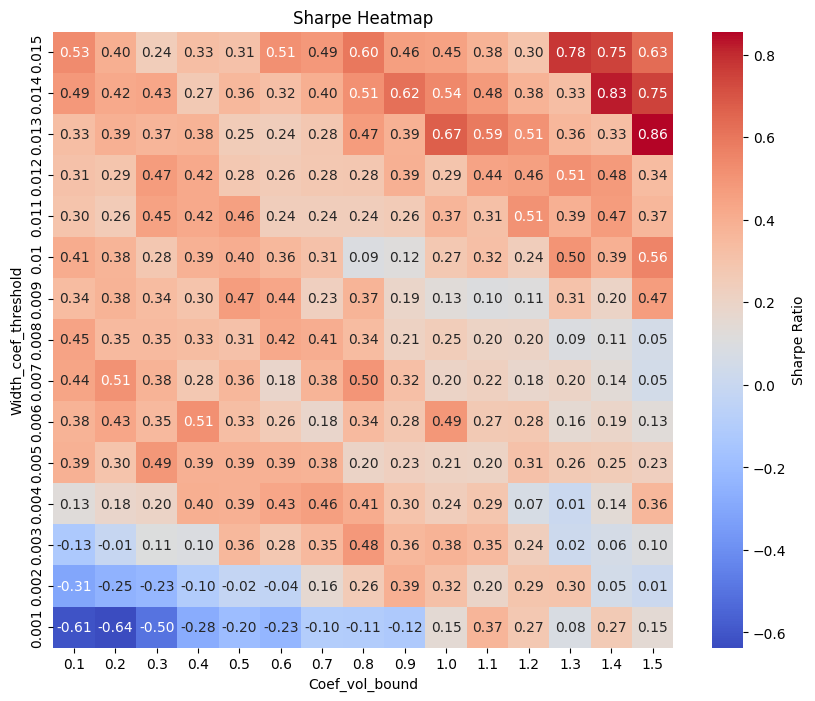

In [99]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="sharpe")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Sharpe Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Sharpe Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

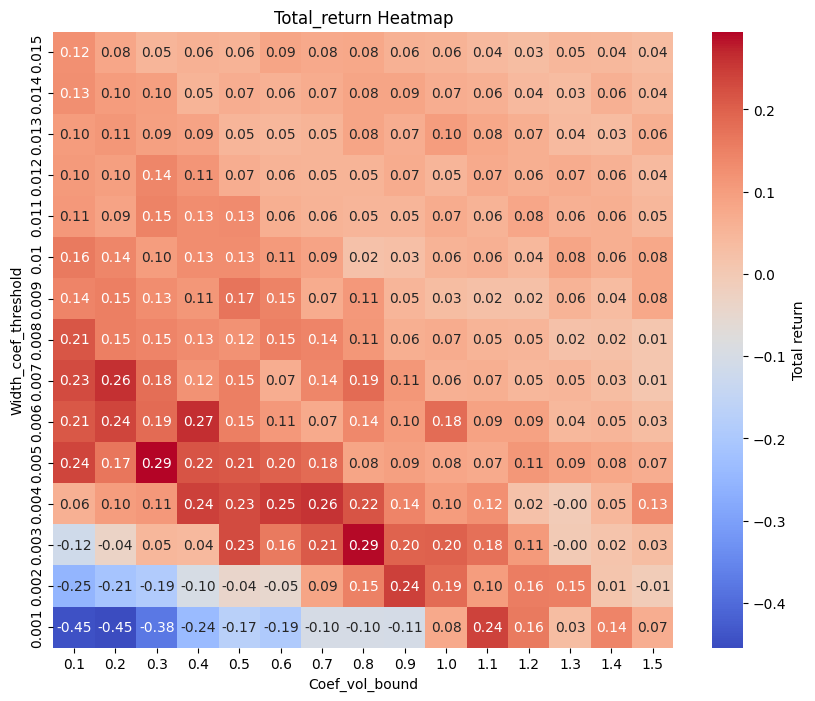

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="total_return")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Total return"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Total_return Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

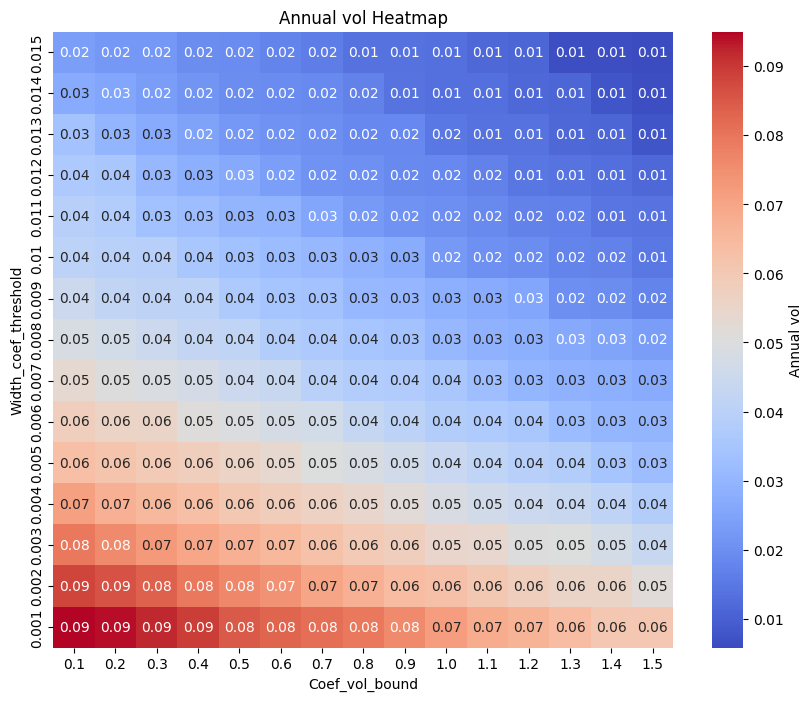

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="vol_annual")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Annual vol"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Annual vol Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

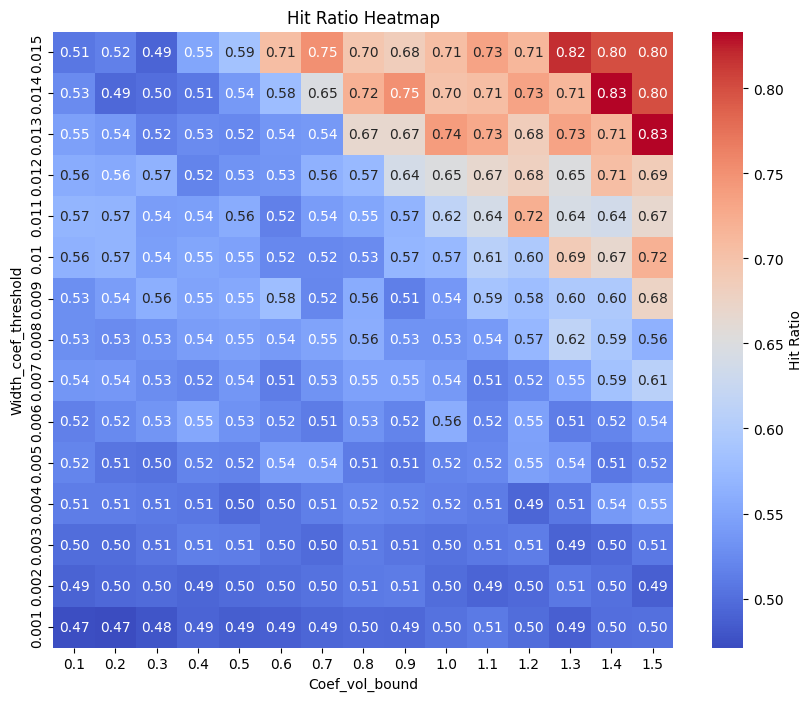

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="hit_ratio")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Hit Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Hit Ratio Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

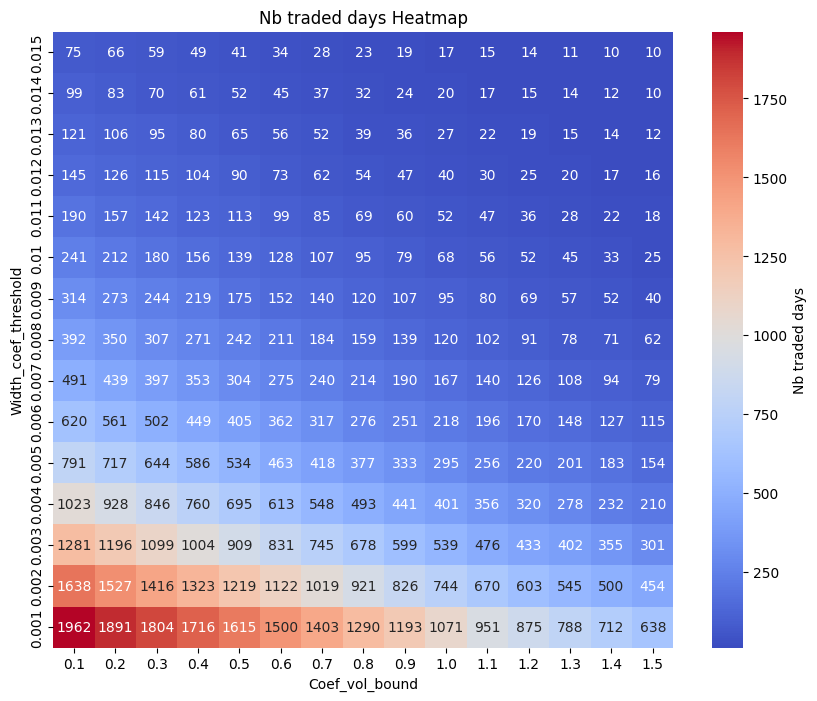

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="n_traded_days")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".0f", 
    cbar_kws={"label": "Nb traded days"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Nb traded days Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

In [104]:
p1_grid = [0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13]
p2_grid = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01, 0.011, 0.012, 0.013, 0.014, 0.015]
p3_grid = [14]
p4_grid = [14]
p5_grid = [0.02]

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

{'param1': 0.06, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.4456725, 'irr_annual': -0.06073237151092148, 'vol_annual': 0.09505101986405493, 'sharpe': -0.611551403100207, 'hit_ratio': 0.473604826546003, 'mdd': -0.5244266563465217, 'n_days': 2373, 'n_traded_days': 1989, 'error': None}
{'param1': 0.06, 'param2': 0.002, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.2653725, 'irr_annual': -0.03221910186340937, 'vol_annual': 0.08824930770341868, 'sharpe': -0.32691792669756525, 'hit_ratio': 0.48483045806067815, 'mdd': -0.39169368458684156, 'n_days': 2373, 'n_traded_days': 1681, 'error': None}
{'param1': 0.06, 'param2': 0.003, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.17068000000000005, 'irr_annual': -0.019678059333599784, 'vol_annual': 0.08278078559084644, 'sharpe': -0.19862089862993068, 'hit_ratio': 0.5007564296520424, 'mdd': -0.28562102211233903, 'n_days': 2373, 'n_traded_days': 1322, 'error': None}
{'param1': 0.06, 

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
0,0.06,0.001,14,14,0.02,-0.445673,-0.060732,0.095051,-0.611551,0.473605,-0.524427,2373,1989,None
1,0.06,0.002,14,14,0.02,-0.265373,-0.032219,0.088249,-0.326918,0.484830,-0.391694,2373,1681,None
2,0.06,0.003,14,14,0.02,-0.170680,-0.019678,0.082781,-0.198621,0.500756,-0.285621,2373,1322,None
3,0.06,0.004,14,14,0.02,0.071250,0.007336,0.071794,0.137653,0.506641,-0.178470,2373,1054,None
4,0.06,0.005,14,14,0.02,0.186270,0.018305,0.064337,0.314061,0.517533,-0.116013,2373,827,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,0.13,0.011,14,14,0.02,0.114880,0.011615,0.038285,0.320800,0.551913,-0.072898,2373,183,None
116,0.13,0.012,14,14,0.02,0.116540,0.011775,0.036214,0.341405,0.553191,-0.084253,2373,141,None
117,0.13,0.013,14,14,0.02,0.121810,0.012281,0.030918,0.410248,0.539823,-0.077513,2373,113,None
118,0.13,0.014,14,14,0.02,0.143885,0.014378,0.025872,0.564675,0.520833,-0.047233,2373,96,None


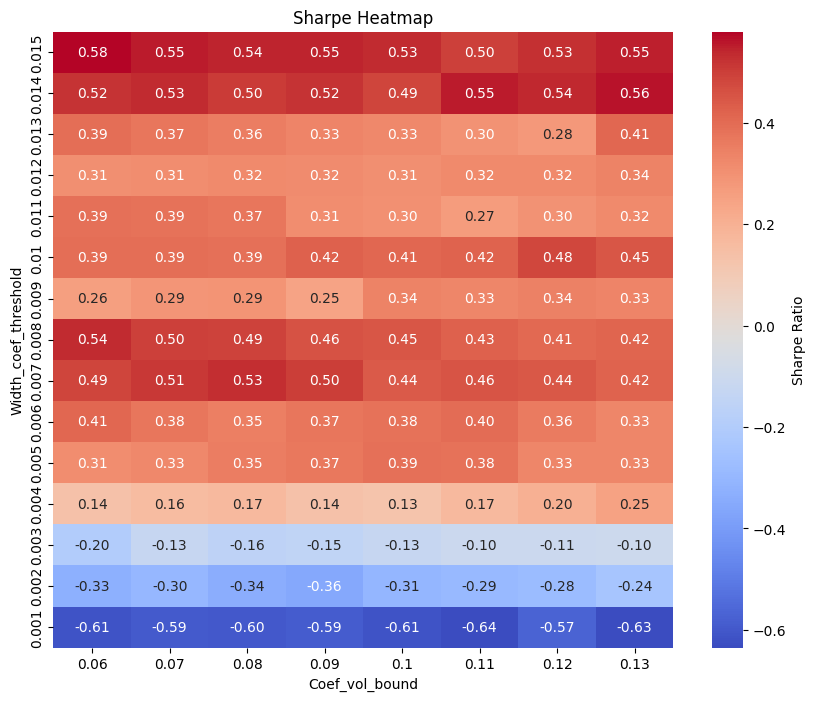

In [105]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="sharpe")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Sharpe Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Sharpe Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

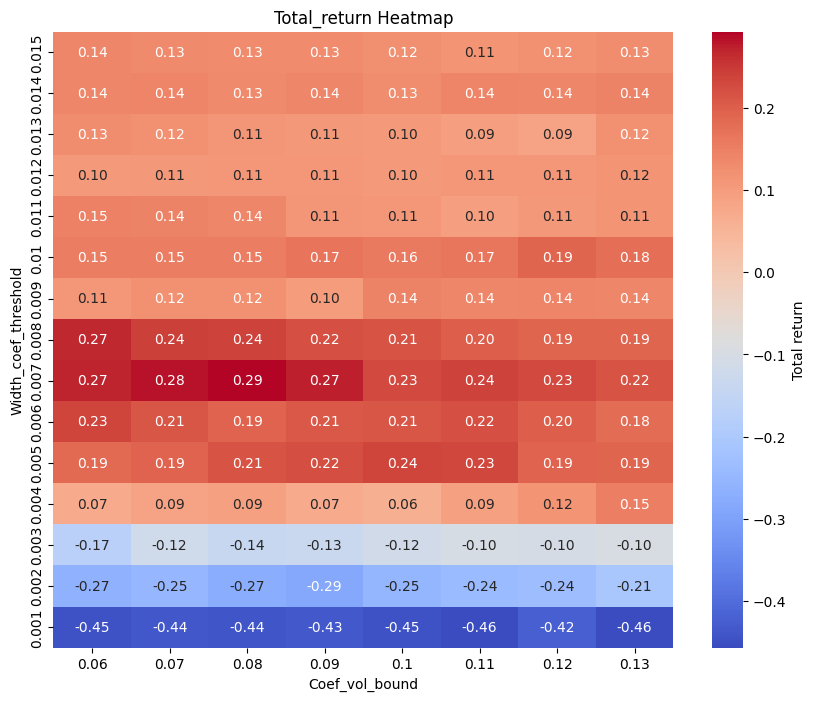

In [106]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="total_return")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Total return"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Total_return Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

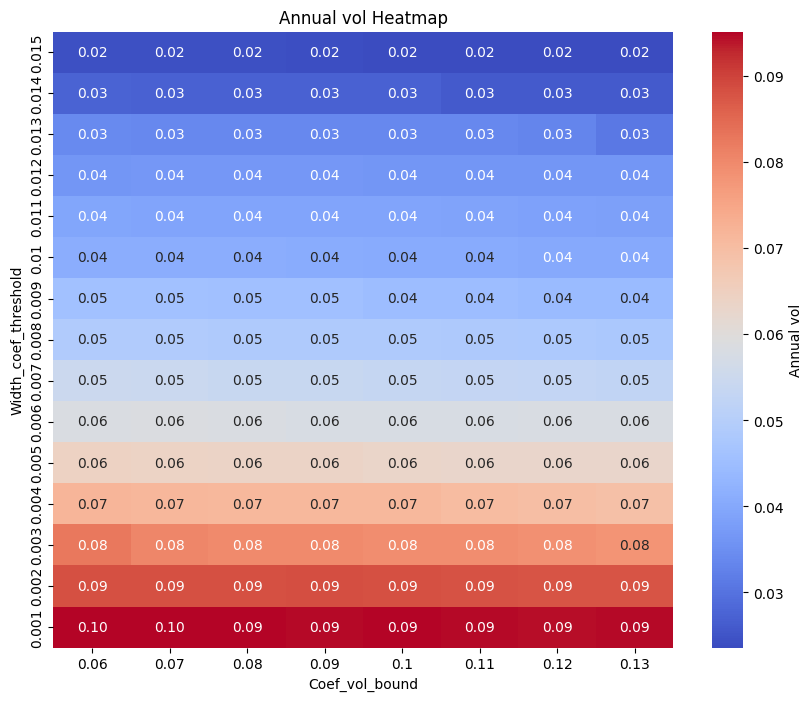

In [107]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="vol_annual")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Annual vol"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Annual vol Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

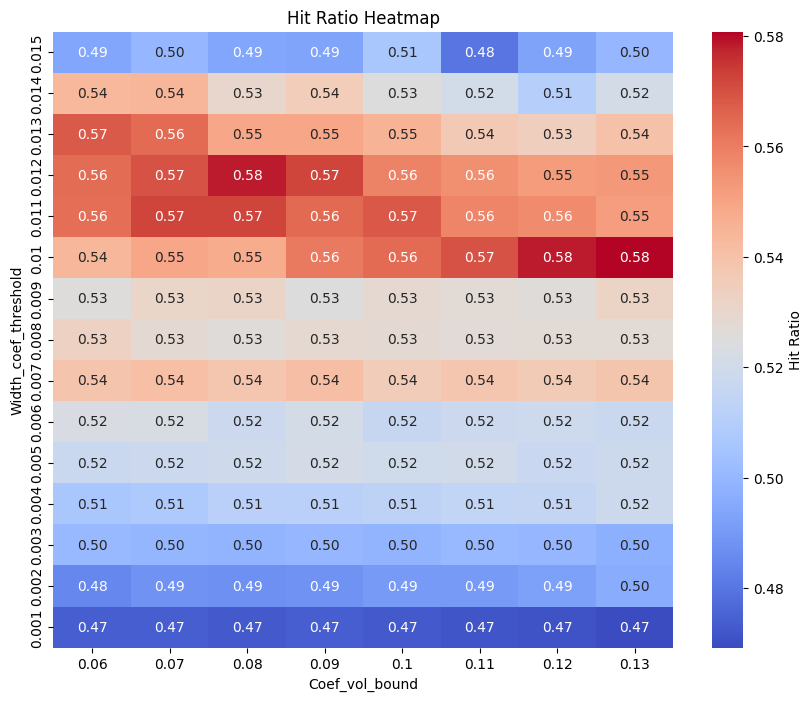

In [108]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="hit_ratio")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Hit Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Hit Ratio Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

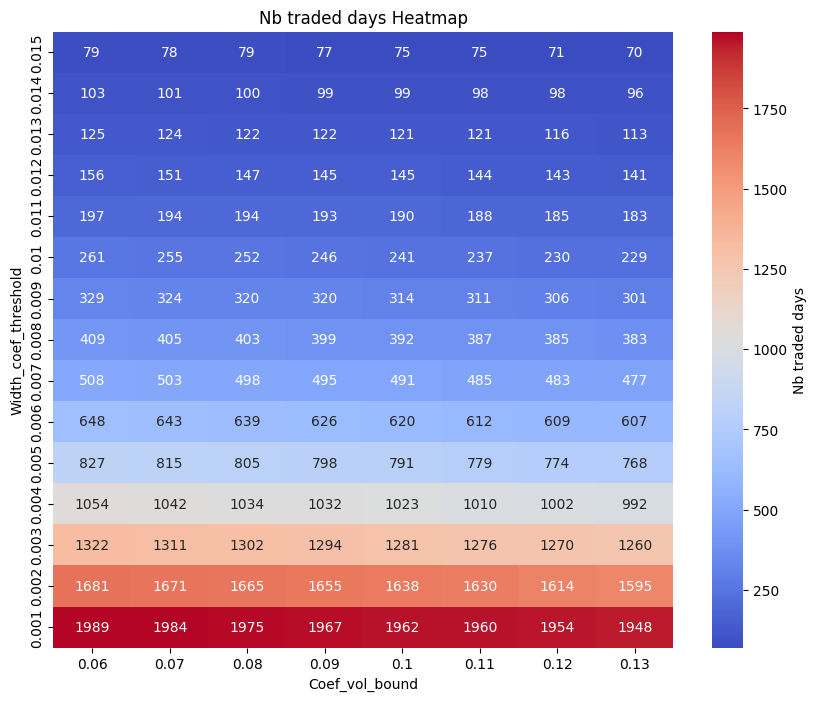

In [109]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="n_traded_days")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".0f", 
    cbar_kws={"label": "Nb traded days"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Nb traded days Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

### Running best strat

In [58]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [59]:
results = backtest_with_hyperparameters(0.08, 0.012, 10, 20, 0.2)
print(evaluate_strategy(results))

{'total_return': 0.12245250000000008, 'irr_annual': 0.012342738904008055, 'vol_annual': 0.03632238431976754, 'sharpe': 0.3559310692712613, 'hit_ratio': 0.5714285714285714, 'mdd': -0.08699669284828442, 'n_days': 2373, 'n_traded_days': 147}


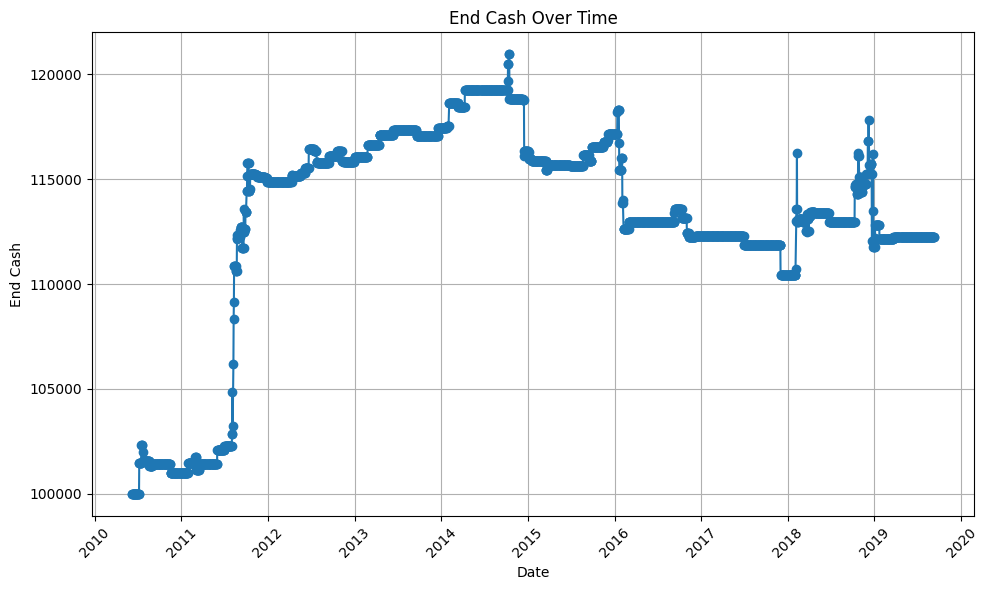

In [60]:
import matplotlib.pyplot as plt

# Ensure 'date' is a datetime type for better x-axis formatting
results['date'] = pd.to_datetime(results['date'])

plt.figure(figsize=(10,6))
plt.plot(results['date'], results['end_cash'], marker='o')

plt.xlabel("Date")
plt.ylabel("End Cash")
plt.title("End Cash Over Time")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Strat 2

In [61]:
### stop same band + vwap

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import datetime as dt
import matplotlib.dates as mdates

In [2]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()
print("Min/Max ET times in df:", tmin, tmax)  # expect between 09:30 and 16:00


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

Min/Max ET times in df: 09:33:00 16:00:00


,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
251,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
502,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
753,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1004,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348370,2019-12-19 15:03:00-05:00,ESZ9,4,3204.75,3205.00,3199.697035,15:03,2019-12-19,3204.875,3196.125,3205.875,3191.875,0.002738,0.002545,3204.258057,3183.752758,0.003051,0.003975
348602,2019-12-19 15:18:00-05:00,ESZ9,4,3203.00,3203.25,3199.812436,15:18,2019-12-19,3203.125,3196.125,3205.875,3191.875,0.002190,0.002443,3203.933470,3184.076913,0.003051,0.003975
348834,2019-12-19 15:33:00-05:00,ESZ9,4,3202.75,3203.00,3199.912810,15:33,2019-12-19,3202.875,3196.125,3205.875,3191.875,0.002112,0.002797,3205.064547,3182.947340,0.003051,0.003975
349066,2019-12-19 15:48:00-05:00,ESZ9,4,3202.50,3202.75,3200.020814,15:48,2019-12-19,3202.625,3196.125,3205.875,3191.875,0.002034,0.002616,3204.485472,3183.525645,0.003051,0.003975


In [3]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
            .sort_values('Time')
            .copy())
    backtest_df = backtest_df.sort_values('hour')

    bid_list = backtest_df['bid_px_00'].values
    ask_list = backtest_df['ask_px_00'].values
    upper_bound = backtest_df['upper_bound'].values
    lower_bound = backtest_df['lower_bound'].values
    vwap_list = backtest_df['vwap_cum'].values
    hour = backtest_df['hour'].values

    if not (len(bid_list) == len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound)):
        return initial_cash
    elif any(pd.isna(x) for x in bid_list + ask_list + vwap_list + upper_bound + lower_bound):
        return initial_cash
    

        
    position = 0
    sigma_target = 0.02
    total_shares_to_hold = math.floor(initial_cash / backtest_df['open_price'].values[0])


    count = 0
    for i in range(1, len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]) and count==0:
            count == 1
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]) and count == 0:
            count == 1
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * bid_list[i]
                print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * ask_list[i]
                print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * bid_list[-1]
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * ask_list[-1]
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

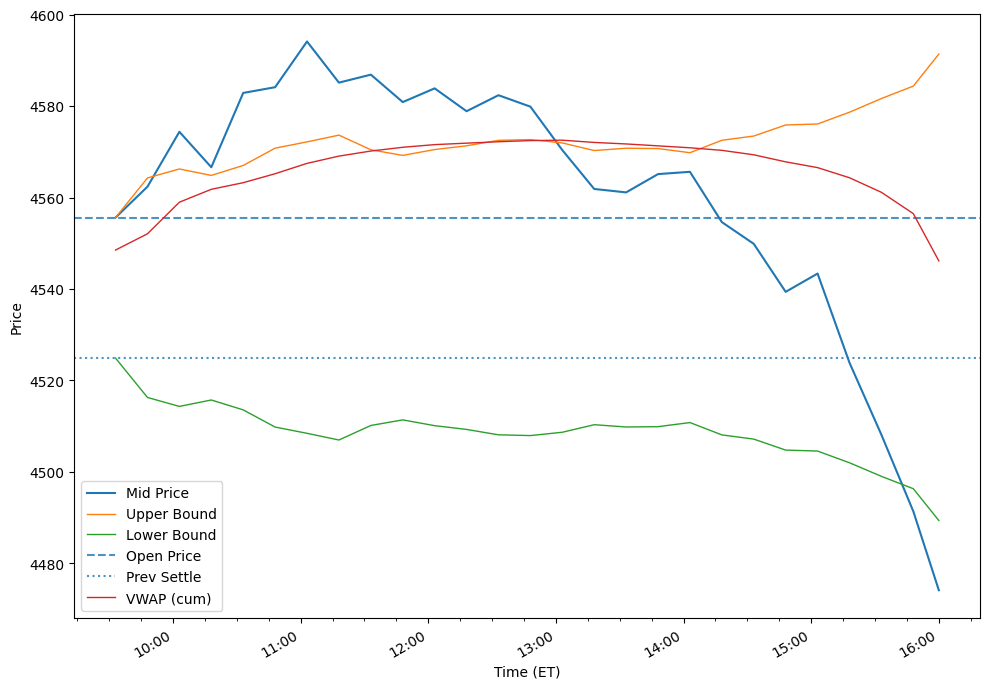

In [12]:
# Ensure Time is tz-aware ET
df["Time"] = pd.to_datetime(df["Time"], utc=True).dt.tz_convert("America/New_York")

# Define day as plain date (no tz needed)
day_str = "2022-01-20"
day = pd.to_datetime(day_str).date()

# Recompute day column in ET if not already done
df["day"] = df["Time"].dt.date

# Filter front-month contract for that day
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

# Plot
fig, ax = plt.subplots(figsize=(10, 7))
x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis
import matplotlib.dates as mdates
from zoneinfo import ZoneInfo


tz = ZoneInfo("America/New_York")

ax.xaxis.set_major_locator(mdates.HourLocator(tz=tz))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M', tz=tz))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45], tz=tz))

fig.autofmt_xdate()

ax.set_xlabel("Time (ET)")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

In [13]:
backtest_one_day(df, "2022-01-20", 1, 100000)

Bought 21 shares at 4574.5 on 2022-01-20 at 10:03
Sold 21 shares at 4570.25 on 2022-01-20 at 13:03
Sold 21 shares at 4491.25 on 2022-01-20 at 15:48


100267.75

100000


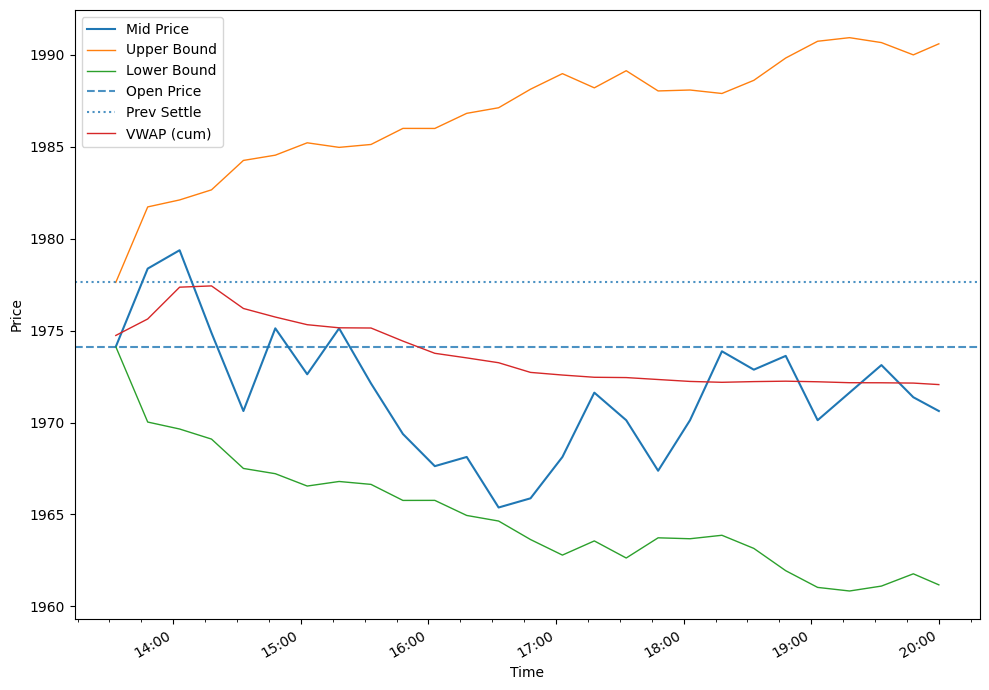

In [11]:
day_str = "2015-10-06"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

# Backtest on all day since 2011

In [68]:
def backtest(backtest_df, rank_to_expiry, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        print(day_ts)
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

In [69]:
results = backtest(df, 1)
results

2010-06-07 00:00:00-04:00
2010-06-08 00:00:00-04:00
2010-06-09 00:00:00-04:00
2010-06-10 00:00:00-04:00
2010-06-11 00:00:00-04:00
2010-06-14 00:00:00-04:00
2010-06-15 00:00:00-04:00
2010-06-16 00:00:00-04:00
2010-06-17 00:00:00-04:00
2010-06-18 00:00:00-04:00
2010-06-21 00:00:00-04:00
2010-06-22 00:00:00-04:00
2010-06-23 00:00:00-04:00
2010-06-24 00:00:00-04:00
Sold 92 shares at 1077.5 on 2010-06-24 00:00:00-04:00 at 10:03
Bought 92 shares at 1078.75 on 2010-06-24 00:00:00-04:00 at 10:33
Sold 92 shares at 1075.25 on 2010-06-24 00:00:00-04:00 at 10:48
Bought 92 shares at 1077.0 on 2010-06-24 00:00:00-04:00 at 12:03
Sold 92 shares at 1075.75 on 2010-06-24 00:00:00-04:00 at 12:18
Bought 92 shares at 1078.0 on 2010-06-24 00:00:00-04:00 at 13:18
Sold 92 shares at 1075.0 on 2010-06-24 00:00:00-04:00 at 14:48
2010-06-25 00:00:00-04:00
Sold 93 shares at 1067.5 on 2010-06-25 00:00:00-04:00 at 09:48
Bought 93 shares at 1072.0 on 2010-06-25 00:00:00-04:00 at 10:03
Bought 93 shares at 1076.5 on 20

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
1,2010-06-08 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
2,2010-06-09 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
3,2010-06-10 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
4,2010-06-11 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
...,...,...,...,...,...,...
2368,2019-09-04 00:00:00-04:00,90890.5,90890.5,0.0,0.0,False
2369,2019-09-05 00:00:00-04:00,90890.5,90890.5,0.0,0.0,False
2370,2019-09-06 00:00:00-04:00,90890.5,90890.5,0.0,0.0,False
2371,2019-09-09 00:00:00-04:00,90890.5,90890.5,0.0,0.0,False


In [70]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [71]:
evaluate_strategy(results)

{'total_return': -0.09109500000000004,
 'irr_annual': -0.010091885758513497,
 'vol_annual': 0.05872076923802279,
 'sharpe': -0.14353119205801868,
 'hit_ratio': 0.34045307443365697,
 'mdd': -0.2406750466003689,
 'n_days': 2373,
 'n_traded_days': 1545}

In [72]:
results.sort_values('return')

,date,start_cash,end_cash,pnl,return,traded
302,2011-08-05 00:00:00-04:00,92215.25,90415.25,-1800.00,-0.019520,True
1998,2018-03-28 00:00:00-04:00,87228.75,85702.50,-1526.25,-0.017497,True
2188,2018-12-21 00:00:00-05:00,89898.25,88440.25,-1458.00,-0.016218,True
1444,2016-02-03 00:00:00-05:00,91438.50,90016.75,-1421.75,-0.015549,True
2187,2018-12-20 00:00:00-05:00,91050.25,89898.25,-1152.00,-0.012652,True
...,...,...,...,...,...,...
301,2011-08-04 00:00:00-04:00,89965.25,92215.25,2250.00,0.025010,True
2137,2018-10-10 00:00:00-04:00,85097.00,87264.75,2167.75,0.025474,True
2176,2018-12-04 00:00:00-05:00,89744.25,92096.25,2352.00,0.026208,True
1964,2018-02-08 00:00:00-05:00,81538.25,83893.25,2355.00,0.028882,True


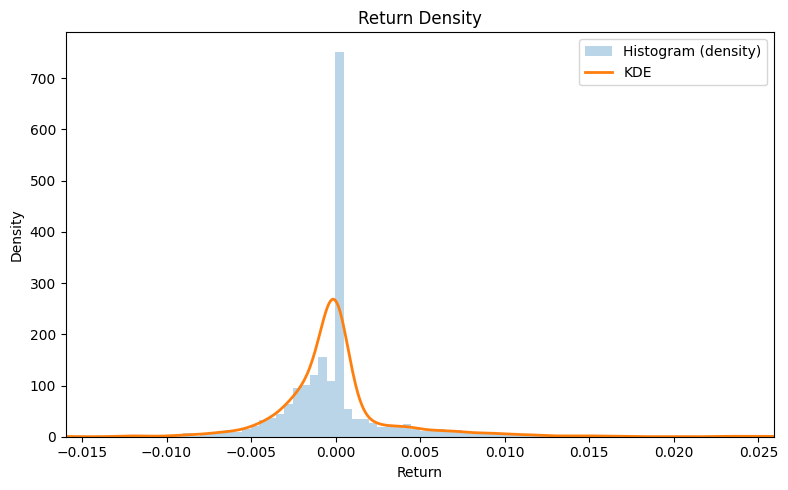

In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Clean the series
s = pd.Series(results['return'], dtype='float64')
s = s.replace([np.inf, -np.inf], np.nan).dropna()

fig, ax = plt.subplots(figsize=(8, 5))

# Density histogram
ax.hist(s, bins=100, density=True, alpha=0.3, label='Histogram (density)')

# KDE overlay (if scipy available)
try:
    from scipy.stats import gaussian_kde
    xs = np.linspace(s.quantile(0.001), s.quantile(0.999), 512)
    kde = gaussian_kde(s)
    ax.plot(xs, kde(xs), linewidth=2, label='KDE')
except Exception:
    # If scipy isn't installed, just skip the KDE
    pass

# Nice viewing window (doesn't affect density calc)
qlo, qhi = s.quantile([0.001, 0.999])
ax.set_xlim(qlo, qhi)

ax.set_xlabel('Return')
ax.set_ylabel('Density')
ax.set_title('Return Density')
ax.legend()
plt.tight_layout()
plt.show()

# Strat2_hyperparameters

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math

import datetime as dt

import matplotlib.dates as mdates

In [8]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
116,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
232,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
348,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
464,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226645,2019-09-10 15:03:00-04:00,ESZ9,3,2967.75,2968.00,2966.699674,15:03,2019-09-10,2967.875,2968.125,2981.375,2981.125,0.000084,0.004498,2994.534868,2954.773609,0.004464,0.007272
226805,2019-09-10 15:18:00-04:00,ESZ9,3,2968.00,2968.25,2966.721144,15:18,2019-09-10,2968.125,2968.125,2981.375,2981.125,0.000000,0.004591,2994.812156,2954.497530,0.004464,0.007272
226965,2019-09-10 15:33:00-04:00,ESZ9,3,2969.50,2969.75,2966.764753,15:33,2019-09-10,2969.625,2968.125,2981.375,2981.125,0.000505,0.004714,2995.179262,2954.132025,0.004464,0.007272
227125,2019-09-10 15:48:00-04:00,ESZ9,3,2972.25,2972.50,2967.064102,15:48,2019-09-10,2972.375,2968.125,2981.375,2981.125,0.001432,0.004859,2995.611526,2953.701646,0.004464,0.007272


In [9]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 1  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)


    for i in range(1, len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * bid_list[i]
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * ask_list[i]
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * bid_list[-1]
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * ask_list[-1]
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [10]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [11]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [12]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return evaluate_strategy(results, risk_free_rate=0.00)


In [13]:
results = backtest_with_hyperparameters(0.142857, 0.008143, 30, 30, 0.02)
results

{'total_return': 0.0433825000000001,
 'irr_annual': 0.004520043767707316,
 'vol_annual': 0.03407754995632395,
 'sharpe': 0.1492851377948951,
 'hit_ratio': 0.38596491228070173,
 'mdd': -0.09441213769150796,
 'n_days': 2373,
 'n_traded_days': 342}

In [14]:
import itertools
import math
import numpy as np
import pandas as pd

def run_grid_search(
    backtest_fn,
    p1_values,
    p2_values,
    p3_values,
    p4_values,
    p5_values,
    verbose=True,
):
    """
    backtest_fn: callable like backtest_with_hyperparameters(p1, p2) -> dict
    p1_values, p2_values: iterables of parameter candidates
    """
    rows = []
    for p1, p2, p3, p4, p5 in itertools.product(p1_values, p2_values, p3_values, p4_values, p5_values):
        try:
            res = backtest_fn(p1, p2, p3, p4, p5)  # expected to return a dict with keys shown below
            # Ensure required keys exist (coerce missing to NaN)
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": res.get("total_return", np.nan),
                "irr_annual": res.get("irr_annual", np.nan),
                "vol_annual": res.get("vol_annual", np.nan),
                "sharpe": res.get("sharpe", np.nan),
                "hit_ratio": res.get("hit_ratio", np.nan),
                "mdd": res.get("mdd", np.nan),
                "n_days": res.get("n_days", np.nan),
                "n_traded_days": res.get("n_traded_days", np.nan),
                "error": None,
            }
        except Exception as e:
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": np.nan,
                "irr_annual": np.nan,
                "vol_annual": np.nan,
                "sharpe": np.nan,
                "hit_ratio": np.nan,
                "mdd": np.nan,
                "n_days": np.nan,
                "n_traded_days": np.nan,
                "error": str(e),
            }
        rows.append(record)
        print(record)

    df = pd.DataFrame(rows)

    # Keep only successful runs with finite metrics
    ok = df[df["error"].isna()].copy()
    for c in ["total_return", "sharpe"]:
        ok = ok[np.isfinite(ok[c])]

    if ok.empty:
        if verbose:
            print("No successful runs with finite metrics.")
        # Still return the full df for debugging
        return {
            "all_results": df.sort_values(["param1", "param2", "param3", "param4", "param5"]).reset_index(drop=True),
            "best_total_return": None,
            "best_sharpe": None,
        }

    # Best by total return
    idx_ret = ok["total_return"].idxmax()
    best_ret = ok.loc[idx_ret].to_dict()

    # Best by Sharpe
    idx_sharpe = ok["sharpe"].idxmax()
    best_sharpe = ok.loc[idx_sharpe].to_dict()

    if verbose:
        print("=== Best by total_return ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, param3={best_ret['param3']}, param4={best_ret['param4']}, param5={best_ret['param5']}"
            f"total_return={best_ret['total_return']:.6f}, "
            f"sharpe={best_ret['sharpe']:.6f}, vol_annual={best_ret['vol_annual']:.6f}, "
            f"hit_ratio={best_ret['hit_ratio']:.4f}, mdd={best_ret['mdd']:.4f}, "
            f"n_days={int(best_ret['n_days']) if not math.isnan(best_ret['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_ret['n_traded_days']) if not math.isnan(best_ret['n_traded_days']) else 'NA'}"
        )
        print("\n=== Best by sharpe ===")
        print(
            f"param1={best_sharpe['param1']}, param2={best_sharpe['param2']}, param3={best_sharpe['param3']}, param4={best_sharpe['param4']}, param5={best_sharpe['param5']}"
            f"sharpe={best_sharpe['sharpe']:.6f}, "
            f"total_return={best_sharpe['total_return']:.6f}, vol_annual={best_sharpe['vol_annual']:.6f}, "
            f"hit_ratio={best_sharpe['hit_ratio']:.4f}, mdd={best_sharpe['mdd']:.4f}, "
            f"n_days={int(best_sharpe['n_days']) if not math.isnan(best_sharpe['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_sharpe['n_traded_days']) if not math.isnan(best_sharpe['n_traded_days']) else 'NA'}"
        )

    return {
        "all_results": df.sort_values(["param1", "param2", 'param3', 'param4', 'param5']).reset_index(drop=True),
        "best_total_return": best_ret,
        "best_sharpe": best_sharpe,
    }

In [15]:
p1_grid = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1, 1.2, 1.3, 1.4, 1.5]
p2_grid = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01, 0.011, 0.012]
p3_grid = [14]
p4_grid = [14]
p5_grid = [0.02]

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.14327, 'irr_annual': -0.016287054423024583, 'vol_annual': 0.07375149318710346, 'sharpe': -0.18596286140283388, 'hit_ratio': 0.38781725888324875, 'mdd': -0.2846841908679476, 'n_days': 2373, 'n_traded_days': 1970, 'error': None}
{'param1': 0.1, 'param2': 0.002, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': 0.12223249999999997, 'irr_annual': 0.012321666061150038, 'vol_annual': 0.06694725721086293, 'sharpe': 0.21621701757427642, 'hit_ratio': 0.3897373243738546, 'mdd': -0.1763694352481779, 'n_days': 2373, 'n_traded_days': 1637, 'error': None}
{'param1': 0.1, 'param2': 0.003, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': 0.2160249999999999, 'irr_annual': 0.020987541914327945, 'vol_annual': 0.059826780679998644, 'sharpe': 0.3769111284930824, 'hit_ratio': 0.3907335907335907, 'mdd': -0.13916598809819603, 'n_days': 2373, 'n_traded_days': 1295, 'error': None}
{'param1': 0.1,

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
0,0.1,0.001,14,14,0.02,-0.143270,-0.016287,0.073751,-0.185963,0.387817,-0.284684,2373,1970,None
1,0.1,0.002,14,14,0.02,0.122232,0.012322,0.066947,0.216217,0.389737,-0.176369,2373,1637,None
2,0.1,0.003,14,14,0.02,0.216025,0.020988,0.059827,0.376911,0.390734,-0.139166,2373,1295,None
3,0.1,0.004,14,14,0.02,0.230065,0.022233,0.054133,0.433123,0.392195,-0.098087,2373,1025,None
4,0.1,0.005,14,14,0.02,0.425695,0.038381,0.049067,0.791989,0.406801,-0.067502,2373,794,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,1.5,0.008,14,14,0.02,-0.006567,-0.000699,0.013761,-0.043982,0.387097,-0.038188,2373,62,None
176,1.5,0.009,14,14,0.02,0.024045,0.002526,0.011211,0.230648,0.463415,-0.023241,2373,41,None
177,1.5,0.010,14,14,0.02,0.030525,0.003198,0.008846,0.365358,0.461538,-0.010643,2373,26,None
178,1.5,0.011,14,14,0.02,0.003730,0.000395,0.006190,0.066960,0.473684,-0.011818,2373,19,None


In [16]:
top10_return

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
4,0.1,0.005,14,14,0.02,0.425695,0.038381,0.049067,0.791989,0.406801,-0.067502,2373,794,None
16,0.2,0.005,14,14,0.02,0.310750,0.029153,0.047071,0.633889,0.393897,-0.077014,2373,721,None
49,0.5,0.002,14,14,0.02,0.283027,0.026819,0.055941,0.500920,0.370098,-0.134833,2373,1224,None
39,0.4,0.004,14,14,0.02,0.278275,0.026415,0.046620,0.582421,0.384915,-0.081571,2373,769,None
15,0.2,0.004,14,14,0.02,0.275005,0.026136,0.051797,0.523851,0.393162,-0.102319,2373,936,None
50,0.5,0.003,14,14,0.02,0.270880,0.025783,0.049642,0.537472,0.379121,-0.095442,2373,910,None
38,0.4,0.003,14,14,0.02,0.256088,0.024508,0.051705,0.493978,0.381281,-0.108366,2373,1015,None
27,0.3,0.004,14,14,0.02,0.252007,0.024154,0.048922,0.512175,0.389930,-0.096525,2373,854,None
14,0.2,0.003,14,14,0.02,0.241208,0.023212,0.057053,0.430565,0.387552,-0.131672,2373,1205,None
3,0.1,0.004,14,14,0.02,0.230065,0.022233,0.054133,0.433123,0.392195,-0.098087,2373,1025,None


In [17]:
top10_sharpe

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
4,0.1,0.005,14,14,0.02,0.425695,0.038381,0.049067,0.791989,0.406801,-0.067502,2373,794,None
16,0.2,0.005,14,14,0.02,0.310750,0.029153,0.047071,0.633889,0.393897,-0.077014,2373,721,None
39,0.4,0.004,14,14,0.02,0.278275,0.026415,0.046620,0.582421,0.384915,-0.081571,2373,769,None
50,0.5,0.003,14,14,0.02,0.270880,0.025783,0.049642,0.537472,0.379121,-0.095442,2373,910,None
15,0.2,0.004,14,14,0.02,0.275005,0.026136,0.051797,0.523851,0.393162,-0.102319,2373,936,None
57,0.5,0.010,14,14,0.02,0.120443,0.012150,0.023749,0.520340,0.460432,-0.025273,2373,139,None
27,0.3,0.004,14,14,0.02,0.252007,0.024154,0.048922,0.512175,0.389930,-0.096525,2373,854,None
49,0.5,0.002,14,14,0.02,0.283027,0.026819,0.055941,0.500920,0.370098,-0.134833,2373,1224,None
7,0.1,0.008,14,14,0.02,0.183520,0.018054,0.037609,0.494470,0.403553,-0.069391,2373,394,None
38,0.4,0.003,14,14,0.02,0.256088,0.024508,0.051705,0.493978,0.381281,-0.108366,2373,1015,None


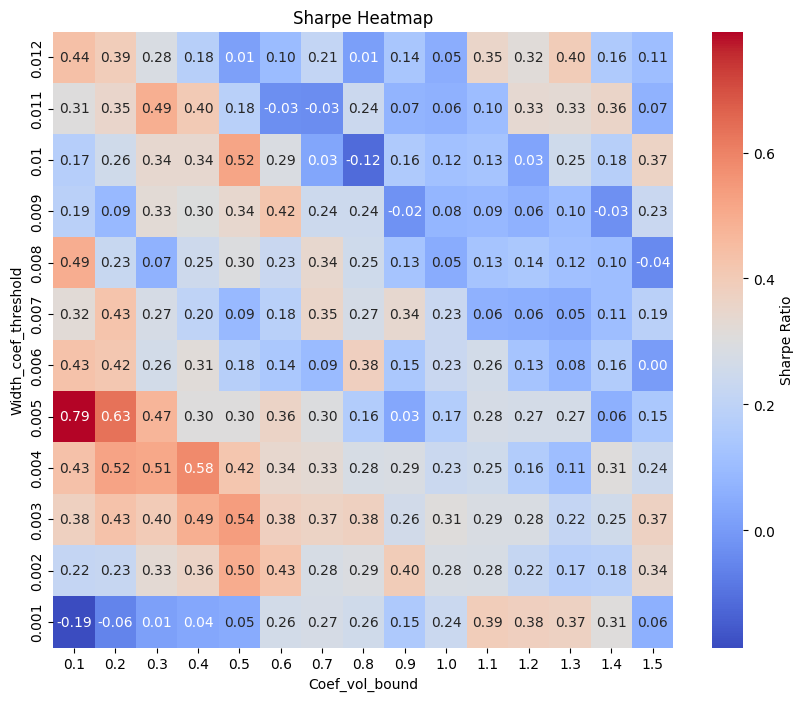

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="sharpe")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Sharpe Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Sharpe Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

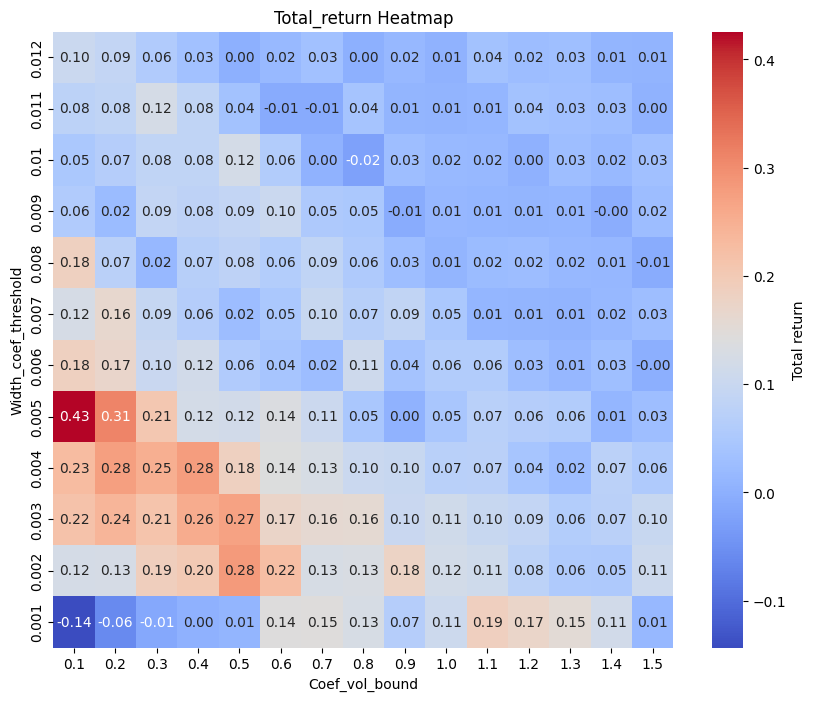

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="total_return")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Total return"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Total_return Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

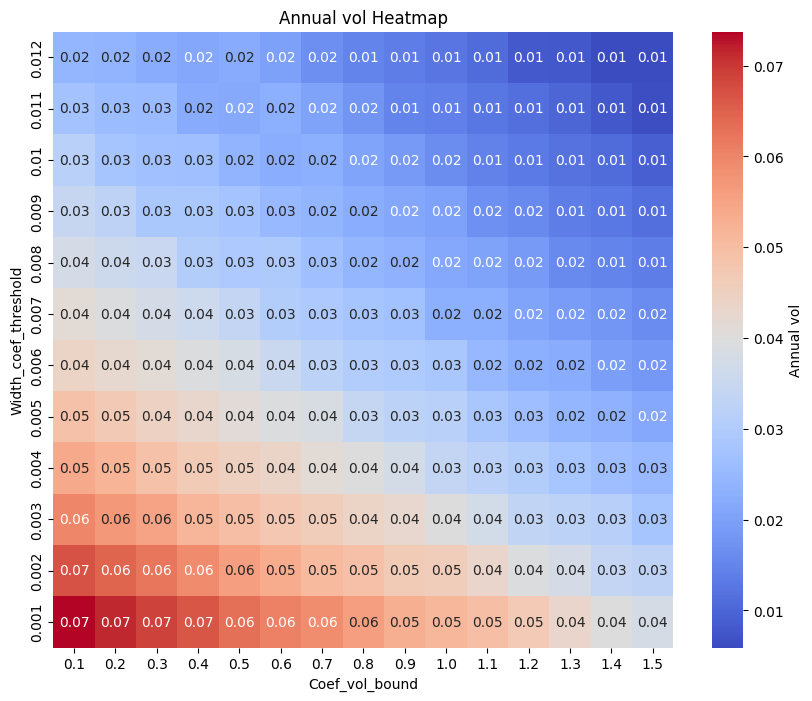

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="vol_annual")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Annual vol"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Annual vol Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

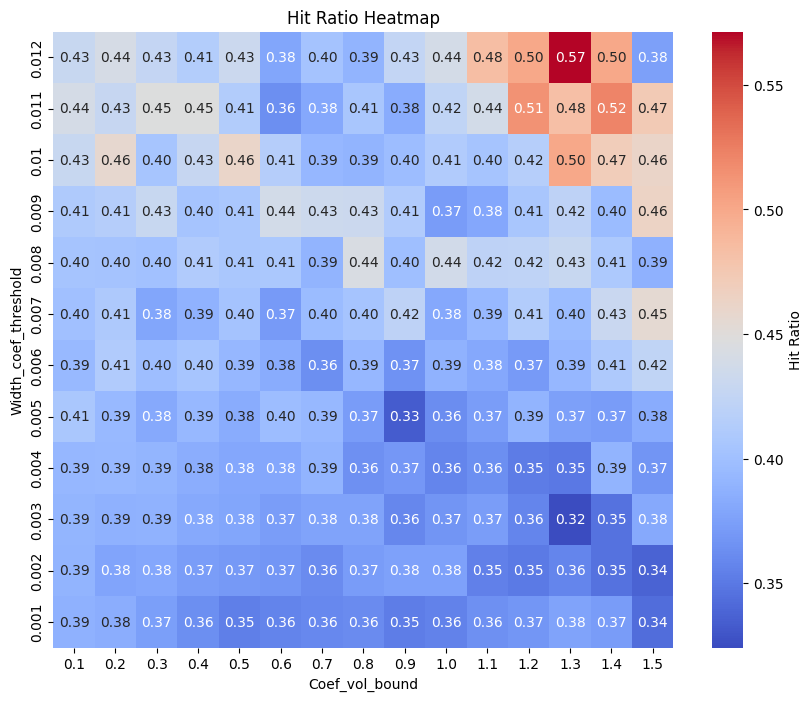

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="hit_ratio")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Hit Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Hit Ratio Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

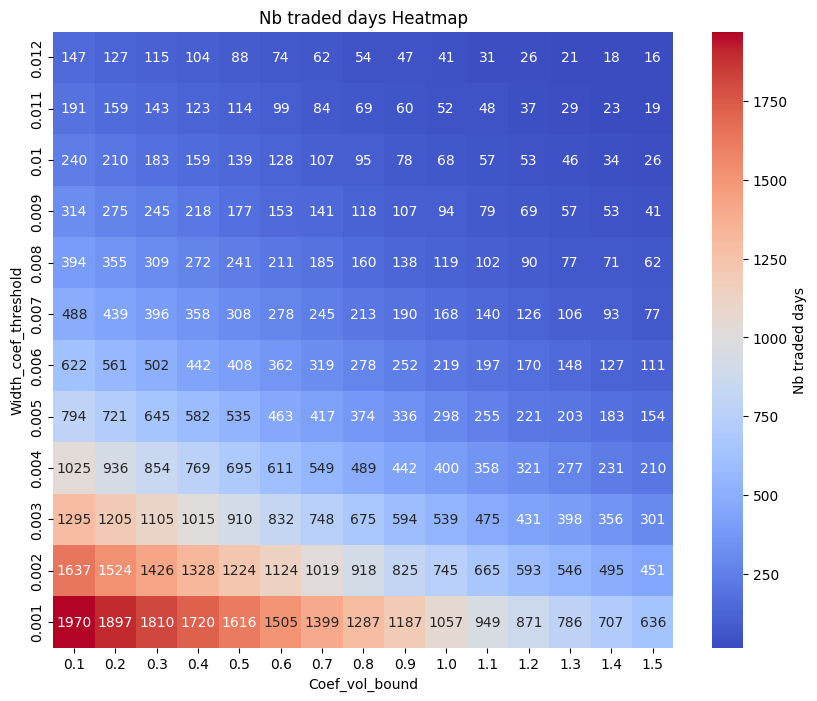

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="n_traded_days")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".0f", 
    cbar_kws={"label": "Nb traded days"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Nb traded days Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

# Strat_3

In [74]:
### Stop opposite band + dynamic bet size

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import datetime as dt
import matplotlib.dates as mdates

In [76]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
df[df['expiry_order']==1]

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
116,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
232,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
348,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
464,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221909,2018-12-20 15:03:00-05:00,ESZ8,1,2468.00,2468.25,2481.013819,15:03,2018-12-20,2468.125,2496.375,2466.500,2506.375,0.011316,0.010853,2533.577270,2469.281262,-0.011967,0.011626
222173,2018-12-20 15:18:00-05:00,ESZ8,1,2476.75,2477.00,2480.622678,15:18,2018-12-20,2476.875,2496.375,2466.500,2506.375,0.007811,0.009820,2530.987472,2471.860727,-0.011967,0.011626
222437,2018-12-20 15:33:00-05:00,ESZ8,1,2477.25,2477.75,2480.571165,15:33,2018-12-20,2477.500,2496.375,2466.500,2506.375,0.007561,0.010542,2532.797138,2470.058282,-0.011967,0.011626
222701,2018-12-20 15:48:00-05:00,ESZ8,1,2463.25,2463.50,2480.296179,15:48,2018-12-20,2463.375,2496.375,2466.500,2506.375,0.013219,0.011686,2535.665573,2467.201291,-0.011967,0.011626


# Runnning strat on one day

In [77]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
            .sort_values('Time')
            .copy())
    backtest_df = backtest_df.sort_values('hour')

    bid_list = backtest_df['bid_px_00'].values
    ask_list = backtest_df['ask_px_00'].values
    upper_bound = backtest_df['upper_bound'].values
    lower_bound = backtest_df['lower_bound'].values
    vwap_list = backtest_df['vwap_cum'].values
    hour = backtest_df['hour'].values

    if not (len(bid_list) == len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound)):
        return initial_cash
    elif any(pd.isna(x) for x in bid_list + ask_list + vwap_list + upper_bound + lower_bound):
        return initial_cash
    

        
    position = 0
    sigma_target = 0.02

    total_shares_to_hold = math.floor(initial_cash * min(4, sigma_target/backtest_df['ret_std_14d'].values[0]) / backtest_df['open_price'].values[0])




    for i in range(1, len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        # elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
        #     # we must close our position
        #     if position > 0: # we are long so we need to sell
        #         initial_cash += position * bid_list[i]
        #         # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
        #         position = 0
        #     elif position < 0: # we are short so we need to buy
        #         initial_cash -= abs(position) * ask_list[i]
        #         # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
        #         position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * bid_list[-1]
        # print(f"Sold {position} shares at {ask_list[-1]} on {day_str} at {hour[-1]}")
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * ask_list[-1]
        # print(f"Bought {abs(position)} shares at {bid_list[-1]} on {day_str} at {hour[-1]}")
        position = 0

    return initial_cash

backtest_one_day(df, "2010-10-13", 1, 100000)

99856.0

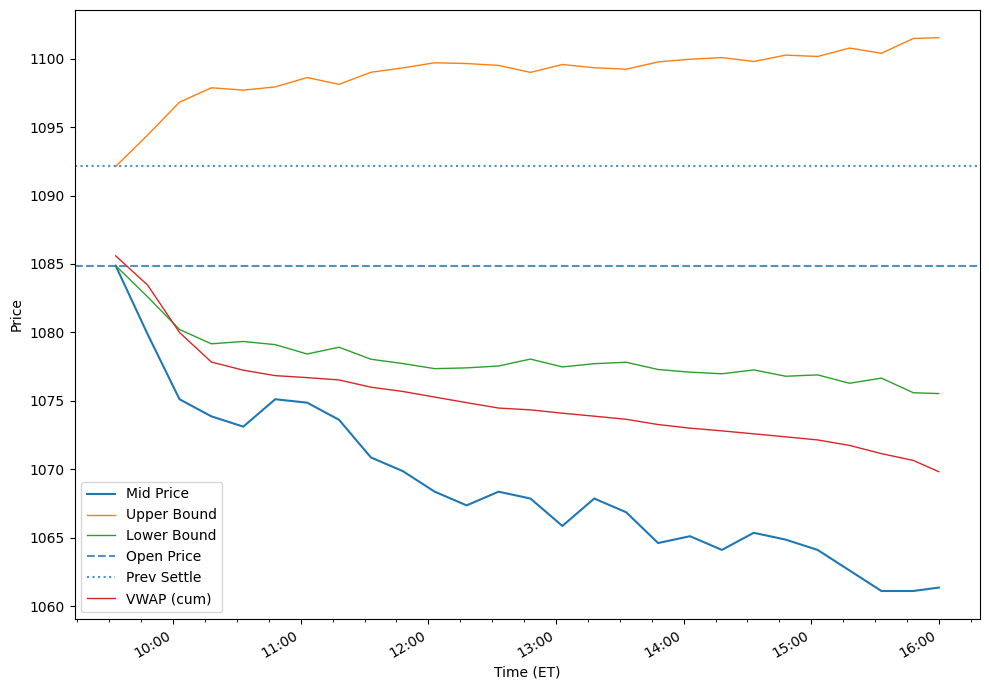

In [78]:
# Ensure Time is tz-aware ET
df["Time"] = pd.to_datetime(df["Time"], utc=True).dt.tz_convert("America/New_York")

# Define day as plain date (no tz needed)
day_str = "2010-07-16"
day = pd.to_datetime(day_str).date()

# Recompute day column in ET if not already done
df["day"] = df["Time"].dt.date

# Filter front-month contract for that day
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

# Plot
fig, ax = plt.subplots(figsize=(10, 7))
x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis
import matplotlib.dates as mdates
from zoneinfo import ZoneInfo


tz = ZoneInfo("America/New_York")

ax.xaxis.set_major_locator(mdates.HourLocator(tz=tz))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M', tz=tz))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45], tz=tz))

fig.autofmt_xdate()

ax.set_xlabel("Time (ET)")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

In [79]:
backtest_one_day(df, "2010-07-16", 1, 100000)

102810.5

101641.5


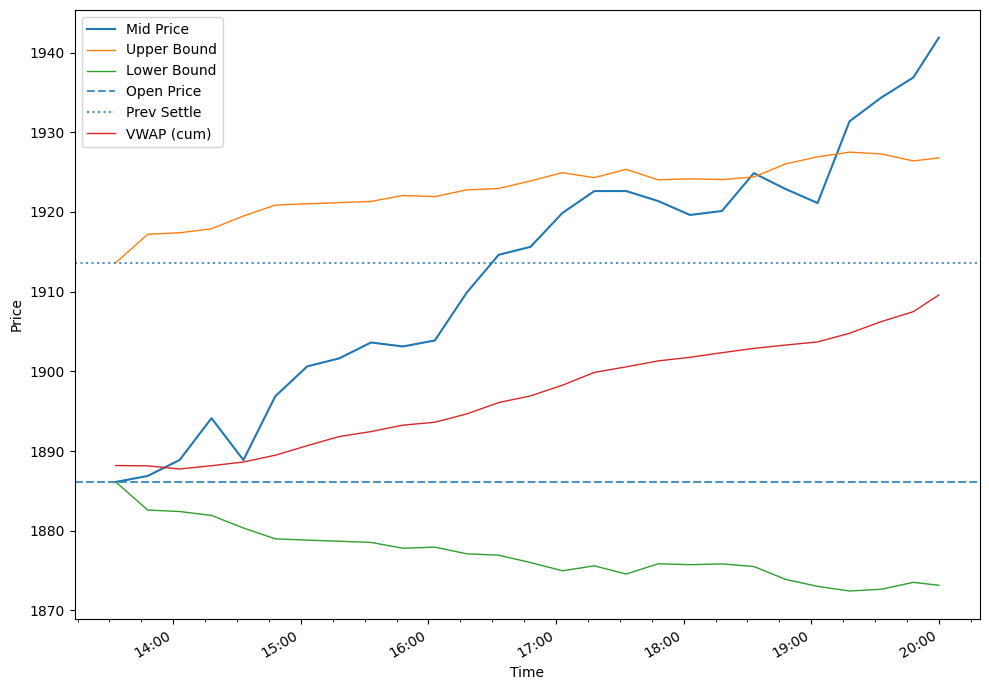

In [80]:
day_str = "2015-10-02"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

93365.75


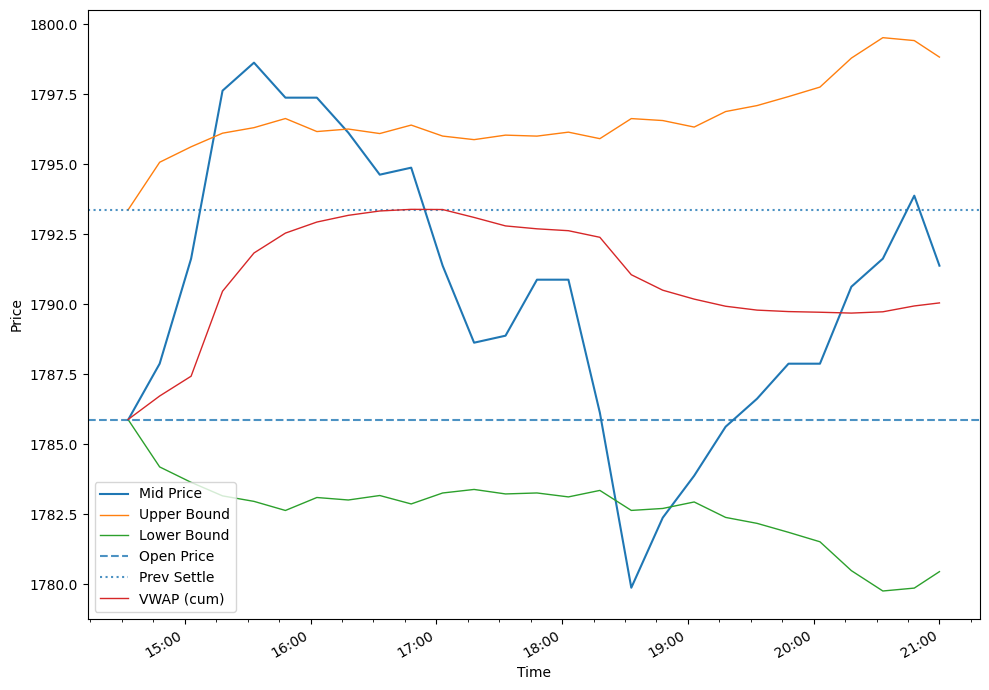

In [81]:
day_str = "2013-12-04"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

# Bactests on all day since 2011

In [82]:
def backtest(backtest_df, rank_to_expiry, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        print(day_ts)
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

In [83]:
results = backtest(df, 1)
results

2010-06-07 00:00:00-04:00
2010-06-08 00:00:00-04:00
2010-06-09 00:00:00-04:00
2010-06-10 00:00:00-04:00
2010-06-11 00:00:00-04:00
2010-06-14 00:00:00-04:00
2010-06-15 00:00:00-04:00
2010-06-16 00:00:00-04:00
2010-06-17 00:00:00-04:00
2010-06-18 00:00:00-04:00
2010-06-21 00:00:00-04:00
2010-06-22 00:00:00-04:00
2010-06-23 00:00:00-04:00
2010-06-24 00:00:00-04:00
2010-06-25 00:00:00-04:00
2010-06-28 00:00:00-04:00
2010-06-29 00:00:00-04:00
2010-06-30 00:00:00-04:00
2010-07-01 00:00:00-04:00
2010-07-02 00:00:00-04:00
2010-07-05 00:00:00-04:00
2010-07-06 00:00:00-04:00
2010-07-07 00:00:00-04:00
2010-07-08 00:00:00-04:00
2010-07-09 00:00:00-04:00
2010-07-12 00:00:00-04:00
2010-07-13 00:00:00-04:00
2010-07-14 00:00:00-04:00
2010-07-15 00:00:00-04:00
2010-07-16 00:00:00-04:00
2010-07-19 00:00:00-04:00
2010-07-20 00:00:00-04:00
2010-07-21 00:00:00-04:00
2010-07-22 00:00:00-04:00
2010-07-23 00:00:00-04:00
2010-07-26 00:00:00-04:00
2010-07-27 00:00:00-04:00
2010-07-28 00:00:00-04:00
2010-07-29 0

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
1,2010-06-08 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
2,2010-06-09 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
3,2010-06-10 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
4,2010-06-11 00:00:00-04:00,100000.0,100000.0,0.0,0.0,False
...,...,...,...,...,...,...
2368,2019-09-04 00:00:00-04:00,17851.5,17851.5,0.0,0.0,False
2369,2019-09-05 00:00:00-04:00,17851.5,17851.5,0.0,0.0,False
2370,2019-09-06 00:00:00-04:00,17851.5,17851.5,0.0,0.0,False
2371,2019-09-09 00:00:00-04:00,17851.5,17851.5,0.0,0.0,False


In [84]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [85]:
evaluate_strategy(results)

{'total_return': -0.821485,
 'irr_annual': -0.16721704423584483,
 'vol_annual': 0.22187734750532928,
 'sharpe': -0.7129988830867834,
 'hit_ratio': 0.4830949284785436,
 'mdd': -0.8469200550135682,
 'n_days': 2373,
 'n_traded_days': 1538}

In [86]:
results.sort_values('return')

,date,start_cash,end_cash,pnl,return,traded
1171,2015-01-13 00:00:00-05:00,30199.75,28098.75,-2101.00,-0.069570,True
895,2013-12-04 00:00:00-05:00,37915.00,35416.00,-2499.00,-0.065911,True
125,2010-11-29 00:00:00-05:00,54138.25,50789.75,-3348.50,-0.061851,True
1099,2014-09-30 00:00:00-04:00,29949.75,28104.75,-1845.00,-0.061603,True
446,2012-02-27 00:00:00-05:00,35589.50,33410.75,-2178.75,-0.061219,True
...,...,...,...,...,...,...
476,2012-04-10 00:00:00-04:00,32924.25,34542.75,1618.50,0.049158,True
1961,2018-02-05 00:00:00-05:00,16773.00,17610.50,837.50,0.049931,True
935,2014-02-03 00:00:00-05:00,38737.25,40711.25,1974.00,0.050959,True
1600,2016-09-09 00:00:00-04:00,24277.25,25630.25,1353.00,0.055731,True


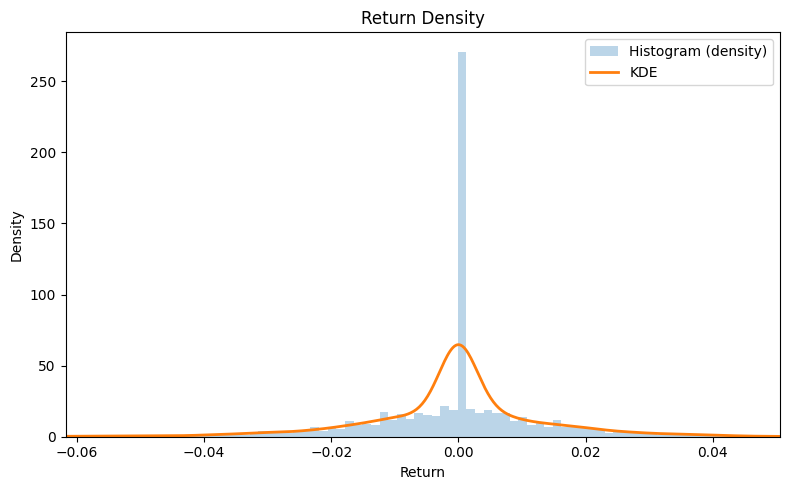

In [87]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Clean the series
s = pd.Series(results['return'], dtype='float64')
s = s.replace([np.inf, -np.inf], np.nan).dropna()

fig, ax = plt.subplots(figsize=(8, 5))

# Density histogram
ax.hist(s, bins=100, density=True, alpha=0.3, label='Histogram (density)')

# KDE overlay (if scipy available)
try:
    from scipy.stats import gaussian_kde
    xs = np.linspace(s.quantile(0.001), s.quantile(0.999), 512)
    kde = gaussian_kde(s)
    ax.plot(xs, kde(xs), linewidth=2, label='KDE')
except Exception:
    # If scipy isn't installed, just skip the KDE
    pass

# Nice viewing window (doesn't affect density calc)
qlo, qhi = s.quantile([0.001, 0.999])
ax.set_xlim(qlo, qhi)

ax.set_xlabel('Return')
ax.set_ylabel('Density')
ax.set_title('Return Density')
ax.legend()
plt.tight_layout()
plt.show()

# Strat_3_hyperparameters

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import matplotlib.dates as mdates

In [24]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
116,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
232,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
348,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
464,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226645,2019-09-10 15:03:00-04:00,ESZ9,3,2967.75,2968.00,2966.699674,15:03,2019-09-10,2967.875,2968.125,2981.375,2981.125,0.000084,0.004498,2994.534868,2954.773609,0.004464,0.007272
226805,2019-09-10 15:18:00-04:00,ESZ9,3,2968.00,2968.25,2966.721144,15:18,2019-09-10,2968.125,2968.125,2981.375,2981.125,0.000000,0.004591,2994.812156,2954.497530,0.004464,0.007272
226965,2019-09-10 15:33:00-04:00,ESZ9,3,2969.50,2969.75,2966.764753,15:33,2019-09-10,2969.625,2968.125,2981.375,2981.125,0.000505,0.004714,2995.179262,2954.132025,0.004464,0.007272
227125,2019-09-10 15:48:00-04:00,ESZ9,3,2972.25,2972.50,2967.064102,15:48,2019-09-10,2972.375,2968.125,2981.375,2981.125,0.001432,0.004859,2995.611526,2953.701646,0.004464,0.007272


In [25]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = min(4, sigma_target / ret_std)  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)


    for i in range(1, n - 1):
        # Long region: price breaking above both local band and trend
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                cash -= shares_to_buy * ask_list[i]

        # Short region: price breaking below both local band and trend
        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold  # positive number
                position -= shares_to_sell
                cash += shares_to_sell * bid_list[i]

        # # Flat/inside band: close any open position
        # elif (bid_list[i] >= min(vwap_list[i], lower_bound[i])) and \
        #      (bid_list[i] <= max(upper_bound[i], vwap_list[i])):
        #     if position > 0:  # close long at bid
        #         cash += position * bid_list[i]
        #         position = 0
        #     elif position < 0:  # close short at ask
        #         cash -= abs(position) * ask_list[i]
        #         position = 0

    # Close at the last tick (use correct side of book)
    if position > 0:      # close long at bid
        cash += position * bid_list[-1]
        position = 0
    elif position < 0:    # close short at ask
        cash -= abs(position) * ask_list[-1]
        position = 0

    return cash

backtest_one_day(df, "2011-10-10", 1, 100000, 0.02)

101020.0

In [26]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [27]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [28]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return evaluate_strategy(results, risk_free_rate=0.00)


In [29]:
results = backtest_with_hyperparameters(0.142857, 0.008143, 30, 30, 0.005)
results

{'total_return': 0.032850000000000046,
 'irr_annual': 0.0034383192533506968,
 'vol_annual': 0.025889699336574087,
 'sharpe': 0.14555395878046934,
 'hit_ratio': 0.5236686390532544,
 'mdd': -0.0787686178843593,
 'n_days': 2373,
 'n_traded_days': 338}

In [30]:
import itertools
import math
import numpy as np
import pandas as pd

def run_grid_search(
    backtest_fn,
    p1_values,
    p2_values,
    p3_values,
    p4_values,
    p5_values,
    verbose=True,
):
    """
    backtest_fn: callable like backtest_with_hyperparameters(p1, p2) -> dict
    p1_values, p2_values: iterables of parameter candidates
    """
    rows = []
    for p1, p2, p3, p4, p5 in itertools.product(p1_values, p2_values, p3_values, p4_values, p5_values):
        try:
            res = backtest_fn(p1, p2, p3, p4, p5)  # expected to return a dict with keys shown below
            # Ensure required keys exist (coerce missing to NaN)
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": res.get("total_return", np.nan),
                "irr_annual": res.get("irr_annual", np.nan),
                "vol_annual": res.get("vol_annual", np.nan),
                "sharpe": res.get("sharpe", np.nan),
                "hit_ratio": res.get("hit_ratio", np.nan),
                "mdd": res.get("mdd", np.nan),
                "n_days": res.get("n_days", np.nan),
                "n_traded_days": res.get("n_traded_days", np.nan),
                "error": None,
            }
        except Exception as e:
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": np.nan,
                "irr_annual": np.nan,
                "vol_annual": np.nan,
                "sharpe": np.nan,
                "hit_ratio": np.nan,
                "mdd": np.nan,
                "n_days": np.nan,
                "n_traded_days": np.nan,
                "error": str(e),
            }
        rows.append(record)
        print(record)

    df = pd.DataFrame(rows)

    # Keep only successful runs with finite metrics
    ok = df[df["error"].isna()].copy()
    for c in ["total_return", "sharpe"]:
        ok = ok[np.isfinite(ok[c])]

    if ok.empty:
        if verbose:
            print("No successful runs with finite metrics.")
        # Still return the full df for debugging
        return {
            "all_results": df.sort_values(["param1", "param2", "param3", "param4", "param5"]).reset_index(drop=True),
            "best_total_return": None,
            "best_sharpe": None,
        }

    # Best by total return
    idx_ret = ok["total_return"].idxmax()
    best_ret = ok.loc[idx_ret].to_dict()

    # Best by Sharpe
    idx_sharpe = ok["sharpe"].idxmax()
    best_sharpe = ok.loc[idx_sharpe].to_dict()

    if verbose:
        print("=== Best by total_return ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, param3={best_ret['param3']}, param4={best_ret['param4']}, param5={best_ret['param5']}"
            f"total_return={best_ret['total_return']:.6f}, "
            f"sharpe={best_ret['sharpe']:.6f}, vol_annual={best_ret['vol_annual']:.6f}, "
            f"hit_ratio={best_ret['hit_ratio']:.4f}, mdd={best_ret['mdd']:.4f}, "
            f"n_days={int(best_ret['n_days']) if not math.isnan(best_ret['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_ret['n_traded_days']) if not math.isnan(best_ret['n_traded_days']) else 'NA'}"
        )
        print("\n=== Best by sharpe ===")
        print(
            f"param1={best_sharpe['param1']}, param2={best_sharpe['param2']}, param3={best_sharpe['param3']}, param4={best_sharpe['param4']}, param5={best_sharpe['param5']}"
            f"sharpe={best_sharpe['sharpe']:.6f}, "
            f"total_return={best_sharpe['total_return']:.6f}, vol_annual={best_sharpe['vol_annual']:.6f}, "
            f"hit_ratio={best_sharpe['hit_ratio']:.4f}, mdd={best_sharpe['mdd']:.4f}, "
            f"n_days={int(best_sharpe['n_days']) if not math.isnan(best_sharpe['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_sharpe['n_traded_days']) if not math.isnan(best_sharpe['n_traded_days']) else 'NA'}"
        )

    return {
        "all_results": df.sort_values(["param1", "param2", 'param3', 'param4', 'param5']).reset_index(drop=True),
        "best_total_return": best_ret,
        "best_sharpe": best_sharpe,
    }

In [33]:
p1_grid = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
p2_grid = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01]
p3_grid = [14]
p4_grid = [14]
p5_grid = [0.02, 0.03, 0.04] 

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.96009, 'irr_annual': -0.28969919417048295, 'vol_annual': 0.24684657619627082, 'sharpe': -1.2606318445445293, 'hit_ratio': 0.47298674821610603, 'mdd': -0.9635664466004179, 'n_days': 2373, 'n_traded_days': 1962, 'error': None}
{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.03, 'total_return': -0.9598625, 'irr_annual': -0.28927030904408146, 'vol_annual': 0.3069446300327663, 'sharpe': -0.9573293158372927, 'hit_ratio': 0.47298674821610603, 'mdd': -0.9682062241604716, 'n_days': 2373, 'n_traded_days': 1962, 'error': None}
{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.04, 'total_return': -0.9505975, 'irr_annual': -0.2734206145477226, 'vol_annual': 0.33902367827262775, 'sharpe': -0.7712324015646046, 'hit_ratio': 0.47298674821610603, 'mdd': -0.9670719506597144, 'n_days': 2373, 'n_traded_days': 1962, 'error': None}
{'param1': 0.1, 'param2': 0.002, 'p

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
0,0.1,0.001,14,14,0.02,-0.960090,-0.289699,0.246847,-1.260632,0.472987,-0.963566,2373,1962,None
1,0.1,0.001,14,14,0.03,-0.959862,-0.289270,0.306945,-0.957329,0.472987,-0.968206,2373,1962,None
2,0.1,0.001,14,14,0.04,-0.950597,-0.273421,0.339024,-0.771232,0.472987,-0.967072,2373,1962,None
3,0.1,0.002,14,14,0.02,-0.881487,-0.202669,0.225189,-0.891914,0.490232,-0.904749,2373,1638,None
4,0.1,0.002,14,14,0.03,-0.867568,-0.193210,0.284468,-0.611234,0.490232,-0.914427,2373,1638,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,0.009,14,14,0.03,-0.045830,-0.004970,0.079183,-0.022505,0.536842,-0.201716,2373,95,None
296,1.0,0.009,14,14,0.04,-0.043615,-0.004725,0.096880,0.000825,0.536842,-0.234750,2373,95,None
297,1.0,0.010,14,14,0.02,0.006552,0.000694,0.043541,0.037869,0.573529,-0.128429,2373,68,None
298,1.0,0.010,14,14,0.03,0.047357,0.004926,0.061204,0.111091,0.573529,-0.156917,2373,68,None


In [34]:
top10_return

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
74,0.3,0.005,14,14,0.04,0.812933,0.065219,0.203029,0.412553,0.503106,-0.293359,2373,644,None
218,0.8,0.003,14,14,0.04,0.748342,0.061123,0.207198,0.389741,0.511799,-0.388193,2373,678,None
191,0.7,0.004,14,14,0.04,0.665288,0.055652,0.192999,0.377118,0.514599,-0.266362,2373,548,None
107,0.4,0.006,14,14,0.04,0.627925,0.053112,0.173989,0.384624,0.552339,-0.290369,2373,449,None
50,0.2,0.007,14,14,0.04,0.579820,0.049763,0.170120,0.370741,0.537585,-0.289896,2373,439,None
17,0.1,0.006,14,14,0.04,0.573802,0.049337,0.196335,0.343391,0.516129,-0.311727,2373,620,None
161,0.6,0.004,14,14,0.04,0.573070,0.049285,0.200742,0.339866,0.504078,-0.341302,2373,613,None
221,0.8,0.004,14,14,0.04,0.546857,0.047415,0.185167,0.342929,0.521298,-0.295551,2373,493,None
14,0.1,0.005,14,14,0.04,0.536230,0.046648,0.217309,0.318061,0.519595,-0.354276,2373,791,None
47,0.2,0.006,14,14,0.04,0.506750,0.044497,0.190413,0.323927,0.524064,-0.324601,2373,561,None


In [35]:
top10_sharpe

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
74,0.3,0.005,14,14,0.04,0.812933,0.065219,0.203029,0.412553,0.503106,-0.293359,2373,644,None
287,1.0,0.006,14,14,0.04,0.493192,0.043495,0.129456,0.394076,0.559633,-0.272064,2373,218,None
218,0.8,0.003,14,14,0.04,0.748342,0.061123,0.207198,0.389741,0.511799,-0.388193,2373,678,None
107,0.4,0.006,14,14,0.04,0.627925,0.053112,0.173989,0.384624,0.552339,-0.290369,2373,449,None
191,0.7,0.004,14,14,0.04,0.665288,0.055652,0.192999,0.377118,0.514599,-0.266362,2373,548,None
50,0.2,0.007,14,14,0.04,0.579820,0.049763,0.170120,0.370741,0.537585,-0.289896,2373,439,None
230,0.8,0.007,14,14,0.04,0.418143,0.037796,0.127995,0.354222,0.546729,-0.277261,2373,214,None
286,1.0,0.006,14,14,0.03,0.352213,0.032562,0.110083,0.346555,0.559633,-0.254151,2373,218,None
17,0.1,0.006,14,14,0.04,0.573802,0.049337,0.196335,0.343391,0.516129,-0.311727,2373,620,None
221,0.8,0.004,14,14,0.04,0.546857,0.047415,0.185167,0.342929,0.521298,-0.295551,2373,493,None


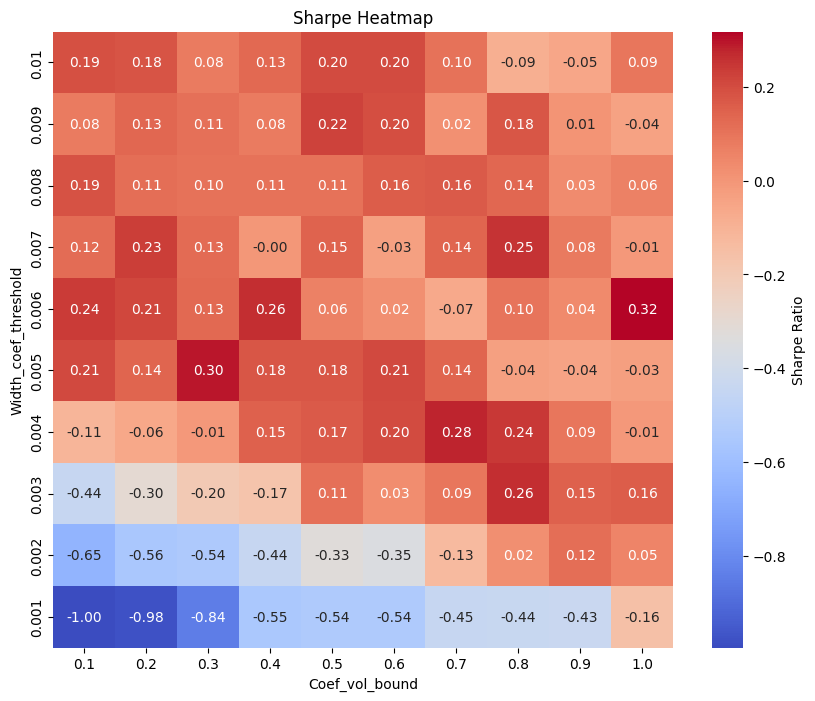

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="sharpe")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Sharpe Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Sharpe Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

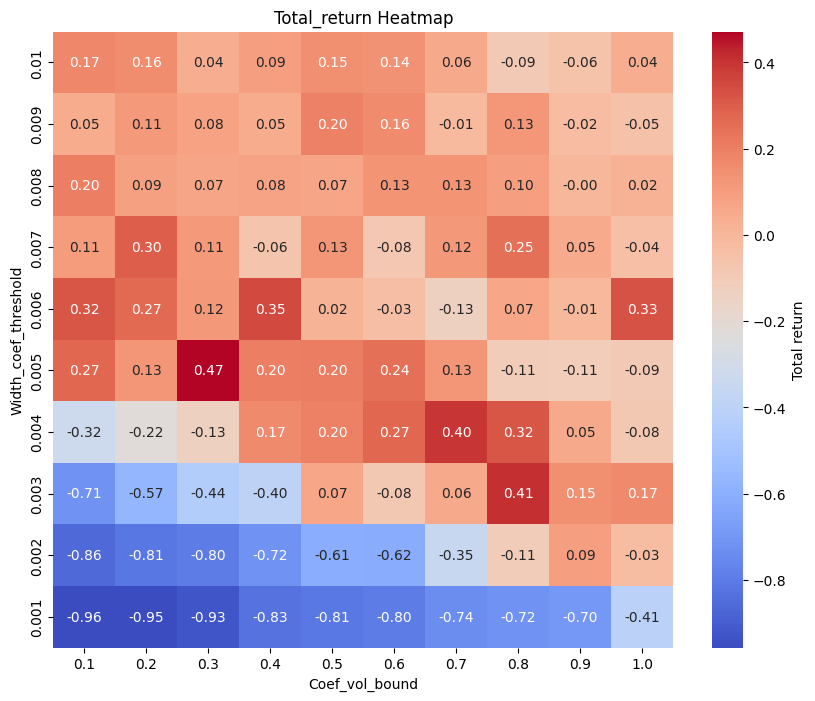

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="total_return")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Total return"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Total_return Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

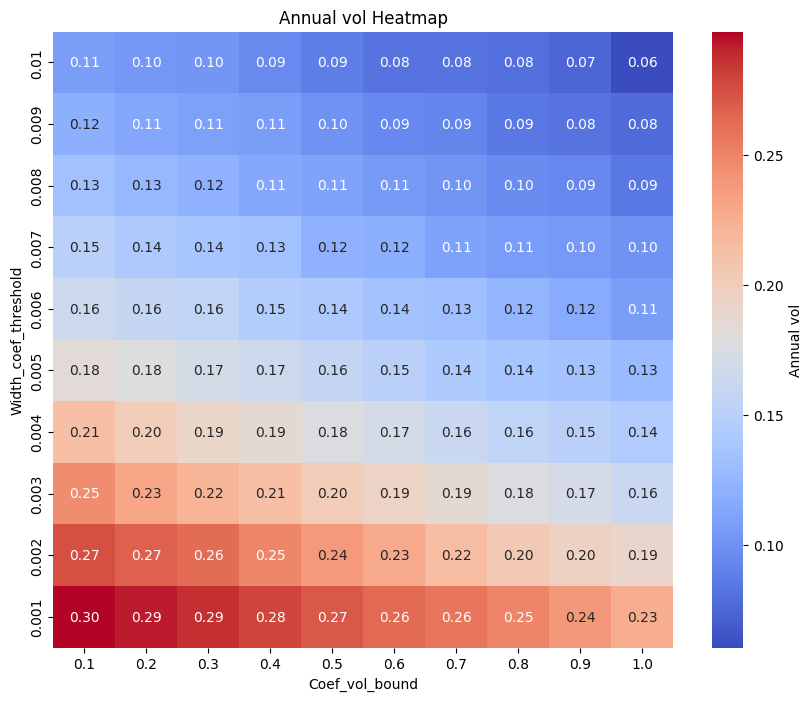

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="vol_annual")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Annual vol"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Annual vol Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

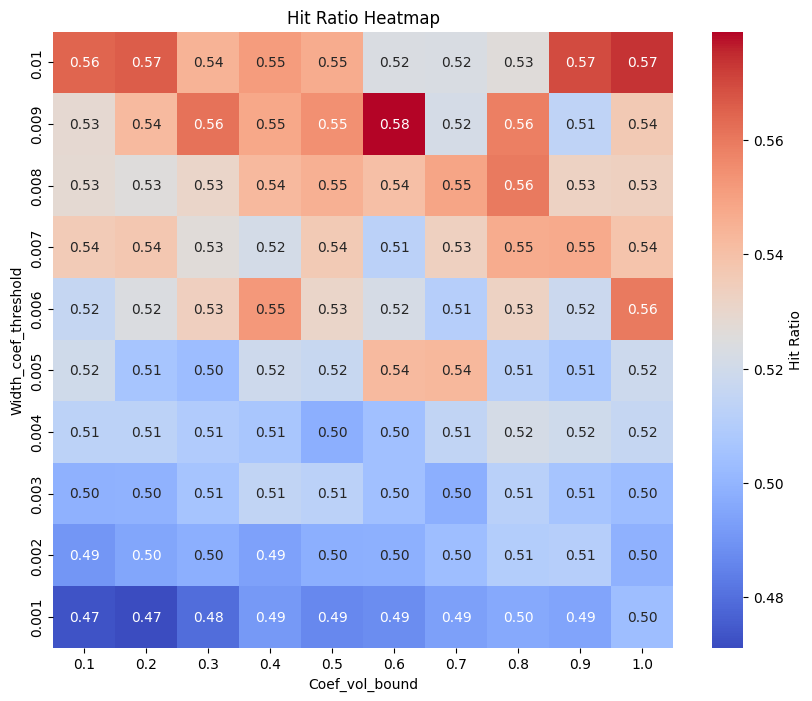

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="hit_ratio")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Hit Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Hit Ratio Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

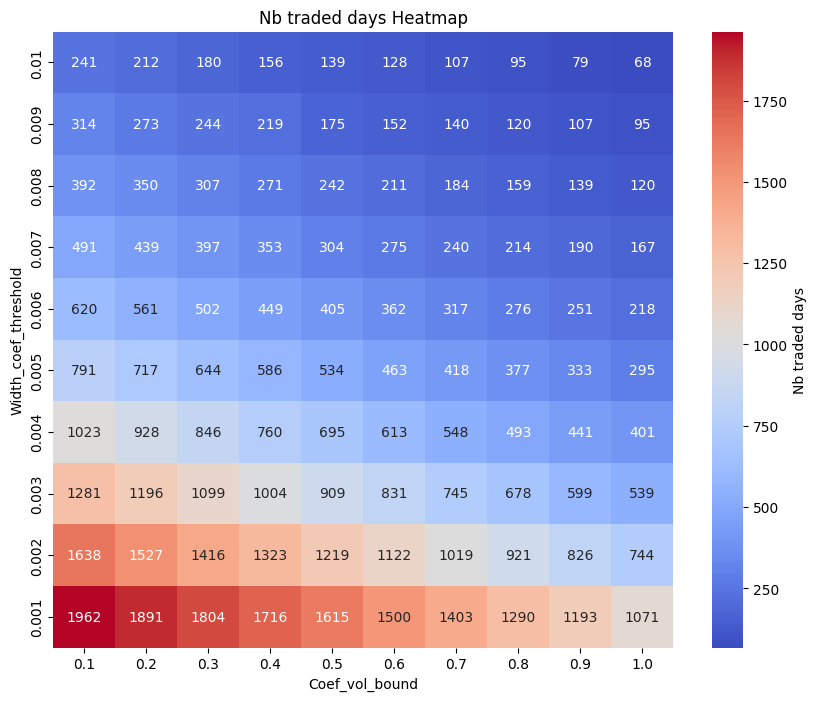

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="n_traded_days")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".0f", 
    cbar_kws={"label": "Nb traded days"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Nb traded days Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

# Final strategy running

# Strat_4

In [47]:
### stop same band + vwap + dynamic size bet

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math
import datetime as dt
import matplotlib.dates as mdates

In [49]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()
print("Min/Max ET times in df:", tmin, tmax)  # expect between 09:30 and 16:00


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

Min/Max ET times in df: 09:33:00 16:00:00


,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
116,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
232,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
348,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
464,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226645,2019-09-10 15:03:00-04:00,ESZ9,3,2967.75,2968.00,2966.699674,15:03,2019-09-10,2967.875,2968.125,2981.375,2981.125,0.000084,0.004498,2994.534868,2954.773609,0.004464,0.007272
226805,2019-09-10 15:18:00-04:00,ESZ9,3,2968.00,2968.25,2966.721144,15:18,2019-09-10,2968.125,2968.125,2981.375,2981.125,0.000000,0.004591,2994.812156,2954.497530,0.004464,0.007272
226965,2019-09-10 15:33:00-04:00,ESZ9,3,2969.50,2969.75,2966.764753,15:33,2019-09-10,2969.625,2968.125,2981.375,2981.125,0.000505,0.004714,2995.179262,2954.132025,0.004464,0.007272
227125,2019-09-10 15:48:00-04:00,ESZ9,3,2972.25,2972.50,2967.064102,15:48,2019-09-10,2972.375,2968.125,2981.375,2981.125,0.001432,0.004859,2995.611526,2953.701646,0.004464,0.007272


In [50]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash):

    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
            .sort_values('Time')
            .copy())
    backtest_df = backtest_df.sort_values('hour')

    bid_list = backtest_df['bid_px_00'].values
    ask_list = backtest_df['ask_px_00'].values
    upper_bound = backtest_df['upper_bound'].values
    lower_bound = backtest_df['lower_bound'].values
    vwap_list = backtest_df['vwap_cum'].values
    hour = backtest_df['hour'].values

    if not (len(bid_list) == len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound)):
        return initial_cash
    elif any(pd.isna(x) for x in bid_list + ask_list + vwap_list + upper_bound + lower_bound):
        return initial_cash
    

        
    position = 0
    sigma_target = 0.02

    total_shares_to_hold = math.floor(initial_cash * min(4, sigma_target/backtest_df['ret_std_14d'].values[0]) / backtest_df['open_price'].values[0])


    count = 0
    for i in range(1, len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]) and count==0:
            count == 1
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]) and count == 0:
            count == 1
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * bid_list[i]
                print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * ask_list[i]
                print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * bid_list[-1]
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * ask_list[-1]
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

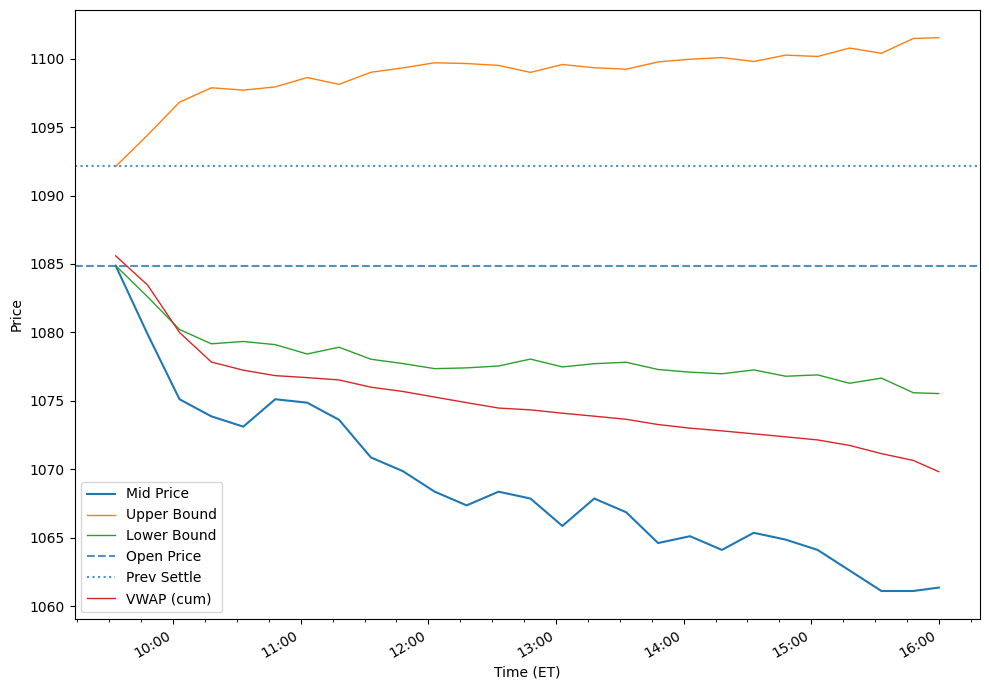

In [51]:
# Ensure Time is tz-aware ET
df["Time"] = pd.to_datetime(df["Time"], utc=True).dt.tz_convert("America/New_York")

# Define day as plain date (no tz needed)
day_str = "2010-07-16"
day = pd.to_datetime(day_str).date()

# Recompute day column in ET if not already done
df["day"] = df["Time"].dt.date

# Filter front-month contract for that day
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

# Plot
fig, ax = plt.subplots(figsize=(10, 7))
x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis
import matplotlib.dates as mdates
from zoneinfo import ZoneInfo


tz = ZoneInfo("America/New_York")

ax.xaxis.set_major_locator(mdates.HourLocator(tz=tz))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M', tz=tz))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45], tz=tz))

fig.autofmt_xdate()

ax.set_xlabel("Time (ET)")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

In [52]:
backtest_one_day(df, "2010-07-16", 1, 100000)

Sold 154 shares at 1079.75 on 2010-07-16 at 09:48


102810.5

Bought 98 shares at 1925.0 on 2015-10-02 at 14:33
Sold 98 shares at 1922.75 on 2015-10-02 at 14:48
Bought 98 shares at 1931.5 on 2015-10-02 at 15:18
100784.0


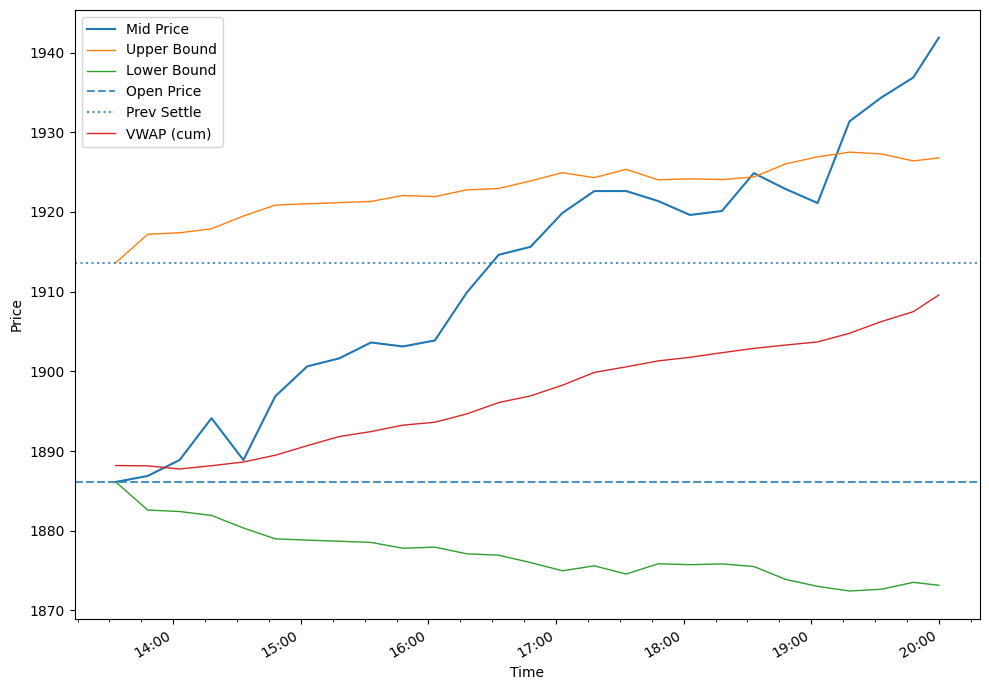

In [53]:
day_str = "2015-10-02"
day = pd.to_datetime(day_str).date()

print(backtest_one_day(df, day_str, 1, 100000))
one = df[(df['expiry_order'] == 1) & (df['day'] == day)].copy()
one = one.sort_values('Time')

fig, ax = plt.subplots(figsize=(10, 7))

x = one['Time']

ax.plot(x, one['price'], label='Mid Price')
if 'upper_bound' in one and one['upper_bound'].notna().any():
    ax.plot(x, one['upper_bound'], label='Upper Bound', linewidth=1)
if 'lower_bound' in one and one['lower_bound'].notna().any():
    ax.plot(x, one['lower_bound'], label='Lower Bound', linewidth=1)

# Horizontal lines for open and previous settlement
if 'open_price' in one and one['open_price'].notna().any():
    ax.axhline(one['open_price'].iloc[0], linestyle='--', alpha=0.8, label='Open Price')
if 'settl_price_previous' in one and one['settl_price_previous'].notna().any():
    ax.axhline(one['settl_price_previous'].iloc[0], linestyle=':', alpha=0.8, label='Prev Settle')

# Optional: VWAP
if 'vwap_cum' in one.columns and one['vwap_cum'].notna().any():
    ax.plot(x, one['vwap_cum'], label='VWAP (cum)', linewidth=1)

# Tidy x-axis: show one tick per hour, minor ticks at 15-min
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_minor_locator(mdates.MinuteLocator(byminute=[0,15,30,45]))
fig.autofmt_xdate()
ax.set_xlabel("Time")
ax.set_ylabel("Price")
ax.legend()
plt.tight_layout()
plt.show()

# Backtest on all day since 2011

In [60]:
def backtest(backtest_df, rank_to_expiry, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        print(day_ts)
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

In [61]:
results = backtest(df, 1)
results

2010-06-07 00:00:00-04:00
2010-06-08 00:00:00-04:00
2010-06-09 00:00:00-04:00
2010-06-10 00:00:00-04:00
2010-06-11 00:00:00-04:00
2010-06-14 00:00:00-04:00
2010-06-15 00:00:00-04:00
2010-06-16 00:00:00-04:00
2010-06-17 00:00:00-04:00
2010-06-18 00:00:00-04:00
2010-06-21 00:00:00-04:00
2010-06-22 00:00:00-04:00
2010-06-23 00:00:00-04:00
2010-06-24 00:00:00-04:00
Sold 161 shares at 1077.5 on 2010-06-24 00:00:00-04:00 at 10:03
Bought 161 shares at 1078.75 on 2010-06-24 00:00:00-04:00 at 10:33
Sold 161 shares at 1075.25 on 2010-06-24 00:00:00-04:00 at 10:48
Bought 161 shares at 1077.0 on 2010-06-24 00:00:00-04:00 at 12:03
Sold 161 shares at 1075.75 on 2010-06-24 00:00:00-04:00 at 12:18
Bought 161 shares at 1078.0 on 2010-06-24 00:00:00-04:00 at 13:18
Sold 161 shares at 1075.0 on 2010-06-24 00:00:00-04:00 at 14:48
2010-06-25 00:00:00-04:00
Sold 175 shares at 1067.5 on 2010-06-25 00:00:00-04:00 at 09:48
Bought 175 shares at 1072.0 on 2010-06-25 00:00:00-04:00 at 10:03
Bought 175 shares at 10

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
1,2010-06-08 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
2,2010-06-09 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
3,2010-06-10 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
4,2010-06-11 00:00:00-04:00,100000.00,100000.00,0.0,0.0,False
...,...,...,...,...,...,...
2368,2019-09-04 00:00:00-04:00,36696.75,36696.75,0.0,0.0,False
2369,2019-09-05 00:00:00-04:00,36696.75,36696.75,0.0,0.0,False
2370,2019-09-06 00:00:00-04:00,36696.75,36696.75,0.0,0.0,False
2371,2019-09-09 00:00:00-04:00,36696.75,36696.75,0.0,0.0,False


In [62]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [63]:
evaluate_strategy(results)

{'total_return': -0.6330325,
 'irr_annual': -0.10098743188258297,
 'vol_annual': 0.1580416577430807,
 'sharpe': -0.5950819902780369,
 'hit_ratio': 0.34045307443365697,
 'mdd': -0.7233815967556211,
 'n_days': 2373,
 'n_traded_days': 1545}

In [64]:
results.sort_values('return')

,date,start_cash,end_cash,pnl,return,traded
1686,2017-01-11 00:00:00-05:00,38267.25,36810.00,-1457.25,-0.038081,True
1444,2016-02-03 00:00:00-05:00,52606.75,50610.25,-1996.50,-0.037951,True
1427,2016-01-11 00:00:00-05:00,54841.00,52839.00,-2002.00,-0.036506,True
1590,2016-08-26 00:00:00-04:00,40833.25,39352.00,-1481.25,-0.036276,True
266,2011-06-16 00:00:00-04:00,62546.25,60289.25,-2257.00,-0.036085,True
...,...,...,...,...,...,...
476,2012-04-10 00:00:00-04:00,56286.50,59067.00,2780.50,0.049399,True
935,2014-02-03 00:00:00-05:00,58872.50,61868.75,2996.25,0.050894,True
1961,2018-02-05 00:00:00-05:00,31227.75,32902.75,1675.00,0.053638,True
1600,2016-09-09 00:00:00-04:00,38241.00,40393.50,2152.50,0.056288,True


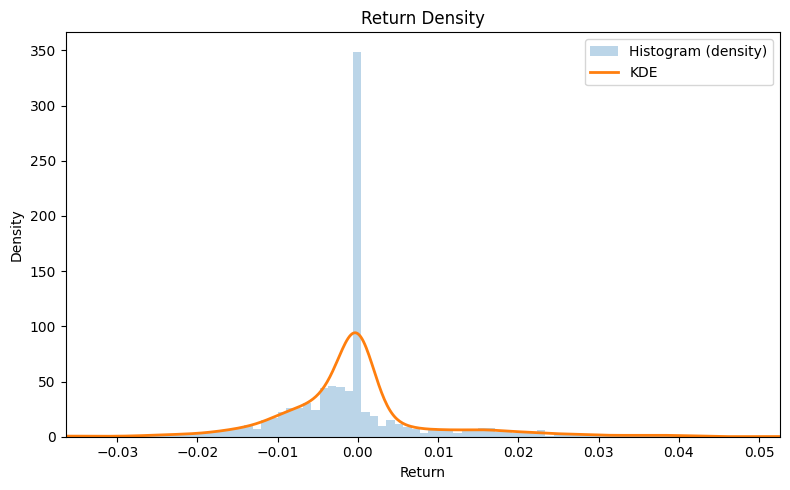

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Clean the series
s = pd.Series(results['return'], dtype='float64')
s = s.replace([np.inf, -np.inf], np.nan).dropna()

fig, ax = plt.subplots(figsize=(8, 5))

# Density histogram
ax.hist(s, bins=100, density=True, alpha=0.3, label='Histogram (density)')

# KDE overlay (if scipy available)
try:
    from scipy.stats import gaussian_kde
    xs = np.linspace(s.quantile(0.001), s.quantile(0.999), 512)
    kde = gaussian_kde(s)
    ax.plot(xs, kde(xs), linewidth=2, label='KDE')
except Exception:
    # If scipy isn't installed, just skip the KDE
    pass

# Nice viewing window (doesn't affect density calc)
qlo, qhi = s.quantile([0.001, 0.999])
ax.set_xlim(qlo, qhi)

ax.set_xlabel('Return')
ax.set_ylabel('Density')
ax.set_title('Return Density')
ax.legend()
plt.tight_layout()
plt.show()

# Strat4_hyperparameters

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math

import datetime as dt

import matplotlib.dates as mdates

In [72]:
### import the data
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()


### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
      .groupby(['symbol','day'])['price']
      .last()
      .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
n = 14
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
      .transform(lambda x: x.rolling(n, min_periods=n).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + df['sigma_observed'])


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - df['sigma_observed'])


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
           .groupby(['symbol','day'], as_index=False)['return'].last())

daily['ret_std_14d'] = (
    daily.groupby('symbol')['return']
         .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
# df[df['expiry_order']==1]
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
116,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
232,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
348,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
464,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226645,2019-09-10 15:03:00-04:00,ESZ9,3,2967.75,2968.00,2966.699674,15:03,2019-09-10,2967.875,2968.125,2981.375,2981.125,0.000084,0.004498,2994.534868,2954.773609,0.004464,0.007272
226805,2019-09-10 15:18:00-04:00,ESZ9,3,2968.00,2968.25,2966.721144,15:18,2019-09-10,2968.125,2968.125,2981.375,2981.125,0.000000,0.004591,2994.812156,2954.497530,0.004464,0.007272
226965,2019-09-10 15:33:00-04:00,ESZ9,3,2969.50,2969.75,2966.764753,15:33,2019-09-10,2969.625,2968.125,2981.375,2981.125,0.000505,0.004714,2995.179262,2954.132025,0.004464,0.007272
227125,2019-09-10 15:48:00-04:00,ESZ9,3,2972.25,2972.50,2967.064102,15:48,2019-09-10,2972.375,2968.125,2981.375,2981.125,0.001432,0.004859,2995.611526,2953.701646,0.004464,0.007272


In [73]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = min(4, sigma_target / ret_std)  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(1, len(bid_list) - 1):
        if ask_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * ask_list[i]
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * bid_list[i]
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif bid_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * bid_list[i]
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * ask_list[i]
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * bid_list[-1]
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * ask_list[-1]
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [74]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [75]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [76]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return evaluate_strategy(results, risk_free_rate=0.00)


In [77]:
results = backtest_with_hyperparameters(0.142857, 0.008143, 30, 30, 0.02)
results

{'total_return': -0.06484500000000004,
 'irr_annual': -0.007094324970395083,
 'vol_annual': 0.07620214339547657,
 'sharpe': -0.05559882713974647,
 'hit_ratio': 0.38596491228070173,
 'mdd': -0.2830833507957459,
 'n_days': 2373,
 'n_traded_days': 342}

In [78]:
import itertools
import math
import numpy as np
import pandas as pd

def run_grid_search(
    backtest_fn,
    p1_values,
    p2_values,
    p3_values,
    p4_values,
    p5_values,
    verbose=True,
):
    """
    backtest_fn: callable like backtest_with_hyperparameters(p1, p2) -> dict
    p1_values, p2_values: iterables of parameter candidates
    """
    rows = []
    for p1, p2, p3, p4, p5 in itertools.product(p1_values, p2_values, p3_values, p4_values, p5_values):
        try:
            res = backtest_fn(p1, p2, p3, p4, p5)  # expected to return a dict with keys shown below
            # Ensure required keys exist (coerce missing to NaN)
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": res.get("total_return", np.nan),
                "irr_annual": res.get("irr_annual", np.nan),
                "vol_annual": res.get("vol_annual", np.nan),
                "sharpe": res.get("sharpe", np.nan),
                "hit_ratio": res.get("hit_ratio", np.nan),
                "mdd": res.get("mdd", np.nan),
                "n_days": res.get("n_days", np.nan),
                "n_traded_days": res.get("n_traded_days", np.nan),
                "error": None,
            }
        except Exception as e:
            record = {
                "param1": p1,
                "param2": p2,                
                "param3": p3,
                "param4": p4,
                "param5": p5,
                "total_return": np.nan,
                "irr_annual": np.nan,
                "vol_annual": np.nan,
                "sharpe": np.nan,
                "hit_ratio": np.nan,
                "mdd": np.nan,
                "n_days": np.nan,
                "n_traded_days": np.nan,
                "error": str(e),
            }
        rows.append(record)
        print(record)

    df = pd.DataFrame(rows)

    # Keep only successful runs with finite metrics
    ok = df[df["error"].isna()].copy()
    for c in ["total_return", "sharpe"]:
        ok = ok[np.isfinite(ok[c])]

    if ok.empty:
        if verbose:
            print("No successful runs with finite metrics.")
        # Still return the full df for debugging
        return {
            "all_results": df.sort_values(["param1", "param2", "param3", "param4", "param5"]).reset_index(drop=True),
            "best_total_return": None,
            "best_sharpe": None,
        }

    # Best by total return
    idx_ret = ok["total_return"].idxmax()
    best_ret = ok.loc[idx_ret].to_dict()

    # Best by Sharpe
    idx_sharpe = ok["sharpe"].idxmax()
    best_sharpe = ok.loc[idx_sharpe].to_dict()

    if verbose:
        print("=== Best by total_return ===")
        print(
            f"param1={best_ret['param1']}, param2={best_ret['param2']}, param3={best_ret['param3']}, param4={best_ret['param4']}, param5={best_ret['param5']}"
            f"total_return={best_ret['total_return']:.6f}, "
            f"sharpe={best_ret['sharpe']:.6f}, vol_annual={best_ret['vol_annual']:.6f}, "
            f"hit_ratio={best_ret['hit_ratio']:.4f}, mdd={best_ret['mdd']:.4f}, "
            f"n_days={int(best_ret['n_days']) if not math.isnan(best_ret['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_ret['n_traded_days']) if not math.isnan(best_ret['n_traded_days']) else 'NA'}"
        )
        print("\n=== Best by sharpe ===")
        print(
            f"param1={best_sharpe['param1']}, param2={best_sharpe['param2']}, param3={best_sharpe['param3']}, param4={best_sharpe['param4']}, param5={best_sharpe['param5']}"
            f"sharpe={best_sharpe['sharpe']:.6f}, "
            f"total_return={best_sharpe['total_return']:.6f}, vol_annual={best_sharpe['vol_annual']:.6f}, "
            f"hit_ratio={best_sharpe['hit_ratio']:.4f}, mdd={best_sharpe['mdd']:.4f}, "
            f"n_days={int(best_sharpe['n_days']) if not math.isnan(best_sharpe['n_days']) else 'NA'}, "
            f"n_traded_days={int(best_sharpe['n_traded_days']) if not math.isnan(best_sharpe['n_traded_days']) else 'NA'}"
        )

    return {
        "all_results": df.sort_values(["param1", "param2", 'param3', 'param4', 'param5']).reset_index(drop=True),
        "best_total_return": best_ret,
        "best_sharpe": best_sharpe,
    }

In [80]:
p1_grid = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
p2_grid = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01]
p3_grid = [14]
p4_grid = [14]
p5_grid = [0.02, 0.03, 0.04]

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.02, 'total_return': -0.8314975, 'irr_annual': -0.17230620247338946, 'vol_annual': 0.19311658214461863, 'sharpe': -0.8828964390815993, 'hit_ratio': 0.38781725888324875, 'mdd': -0.855511344579383, 'n_days': 2373, 'n_traded_days': 1970, 'error': None}
{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.03, 'total_return': -0.789365, 'irr_annual': -0.15245545127331417, 'vol_annual': 0.24325965310915929, 'sharpe': -0.5592457821025327, 'hit_ratio': 0.38781725888324875, 'mdd': -0.8520444300208221, 'n_days': 2373, 'n_traded_days': 1970, 'error': None}
{'param1': 0.1, 'param2': 0.001, 'param3': 14, 'param4': 14, 'param5': 0.04, 'total_return': -0.722325, 'irr_annual': -0.127216432759941, 'vol_annual': 0.2687903617789549, 'sharpe': -0.37330387751060673, 'hit_ratio': 0.38781725888324875, 'mdd': -0.8338923727577657, 'n_days': 2373, 'n_traded_days': 1970, 'error': None}
{'param1': 0.1, 'param2': 0.002, 'pa

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
0,0.1,0.001,14,14,0.02,-0.831498,-0.172306,0.193117,-0.882896,0.387817,-0.855511,2373,1970,None
1,0.1,0.001,14,14,0.03,-0.789365,-0.152455,0.243260,-0.559246,0.387817,-0.852044,2373,1970,None
2,0.1,0.001,14,14,0.04,-0.722325,-0.127216,0.268790,-0.373304,0.387817,-0.833892,2373,1970,None
3,0.1,0.002,14,14,0.02,-0.491215,-0.069245,0.169463,-0.339225,0.389737,-0.624565,2373,1637,None
4,0.1,0.002,14,14,0.03,-0.322597,-0.040518,0.216660,-0.083705,0.389737,-0.591416,2373,1637,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,0.009,14,14,0.03,-0.034425,-0.003713,0.054714,-0.040864,0.372340,-0.127537,2373,94,None
296,1.0,0.009,14,14,0.04,-0.019630,-0.002103,0.067085,0.001786,0.372340,-0.150799,2373,94,None
297,1.0,0.010,14,14,0.02,-0.033597,-0.003623,0.031719,-0.098622,0.411765,-0.096013,2373,68,None
298,1.0,0.010,14,14,0.03,-0.018092,-0.001937,0.045485,-0.020081,0.411765,-0.121728,2373,68,None


In [81]:
top10_return

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
14,0.1,0.005,14,14,0.04,1.565872,0.105245,0.169936,0.672479,0.406801,-0.255744,2373,794,None
44,0.2,0.005,14,14,0.04,1.091530,0.081513,0.162944,0.560988,0.393897,-0.281873,2373,721,None
13,0.1,0.005,14,14,0.03,0.991872,0.075920,0.147461,0.569055,0.406801,-0.251126,2373,794,None
101,0.4,0.004,14,14,0.04,0.872502,0.068882,0.164212,0.486429,0.384915,-0.296150,2373,769,None
128,0.5,0.003,14,14,0.04,0.750845,0.061284,0.176004,0.424531,0.379121,-0.344383,2373,910,None
43,0.2,0.005,14,14,0.03,0.712015,0.058759,0.141774,0.472675,0.393897,-0.268270,2373,721,None
41,0.2,0.004,14,14,0.04,0.630017,0.053255,0.182020,0.374654,0.393162,-0.364504,2373,936,None
71,0.3,0.004,14,14,0.04,0.609345,0.051829,0.172471,0.377858,0.389930,-0.343392,2373,854,None
100,0.4,0.004,14,14,0.03,0.572153,0.049220,0.143615,0.405440,0.384915,-0.287087,2373,769,None
74,0.3,0.005,14,14,0.04,0.564793,0.048698,0.154641,0.383572,0.381395,-0.262735,2373,645,None


In [82]:
top10_sharpe

,param1,param2,param3,param4,param5,total_return,irr_annual,vol_annual,sharpe,hit_ratio,mdd,n_days,n_traded_days,error
14,0.1,0.005,14,14,0.04,1.565872,0.105245,0.169936,0.672479,0.406801,-0.255744,2373,794,None
13,0.1,0.005,14,14,0.03,0.991872,0.075920,0.147461,0.569055,0.406801,-0.251126,2373,794,None
44,0.2,0.005,14,14,0.04,1.091530,0.081513,0.162944,0.560988,0.393897,-0.281873,2373,721,None
149,0.5,0.010,14,14,0.04,0.389468,0.035547,0.075752,0.498365,0.460432,-0.077535,2373,139,None
101,0.4,0.004,14,14,0.04,0.872502,0.068882,0.164212,0.486429,0.384915,-0.296150,2373,769,None
43,0.2,0.005,14,14,0.03,0.712015,0.058759,0.141774,0.472675,0.393897,-0.268270,2373,721,None
148,0.5,0.010,14,14,0.03,0.282345,0.026761,0.062612,0.452756,0.460432,-0.070788,2373,139,None
128,0.5,0.003,14,14,0.04,0.750845,0.061284,0.176004,0.424531,0.379121,-0.344383,2373,910,None
100,0.4,0.004,14,14,0.03,0.572153,0.049220,0.143615,0.405440,0.384915,-0.287087,2373,769,None
12,0.1,0.005,14,14,0.02,0.426170,0.038418,0.109464,0.398682,0.406801,-0.217425,2373,794,None


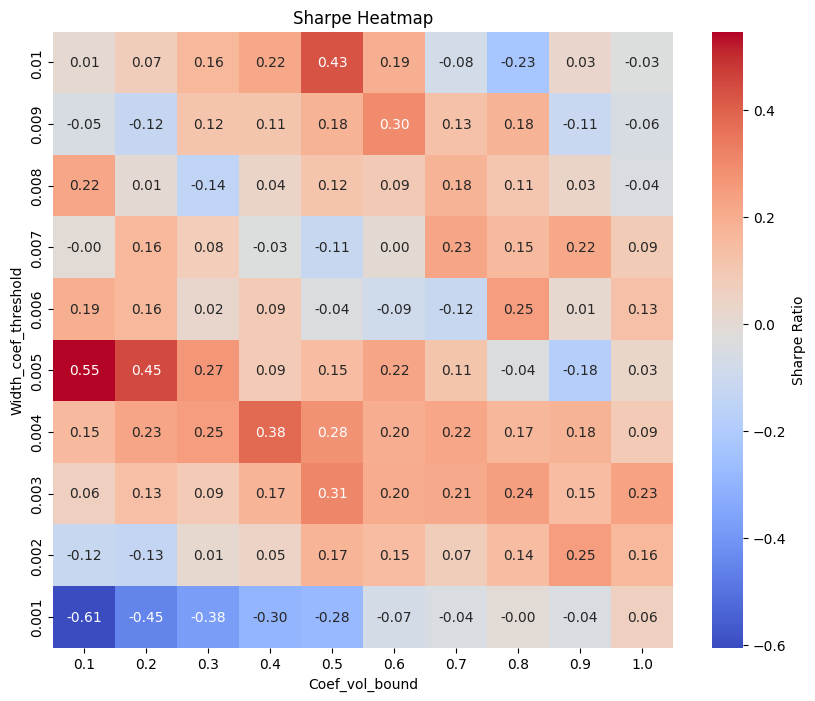

In [83]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="sharpe")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Sharpe Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Sharpe Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

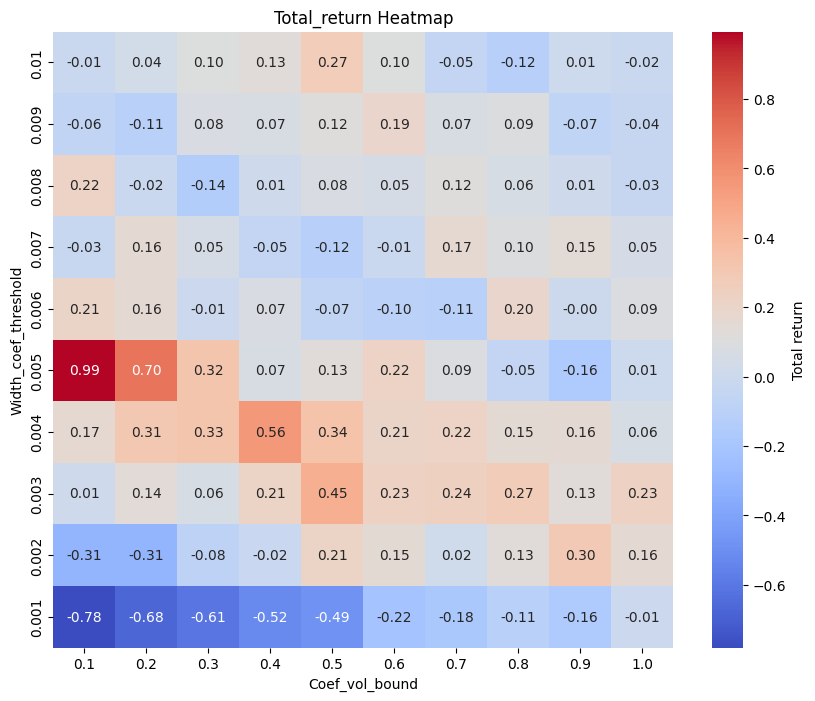

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="total_return")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Total return"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Total_return Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

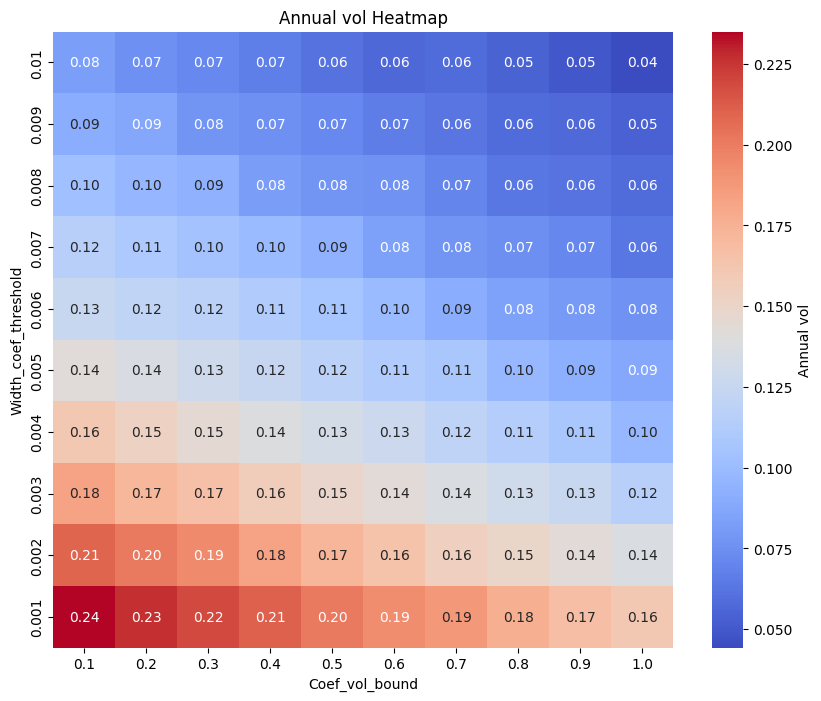

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="vol_annual")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Annual vol"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Annual vol Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

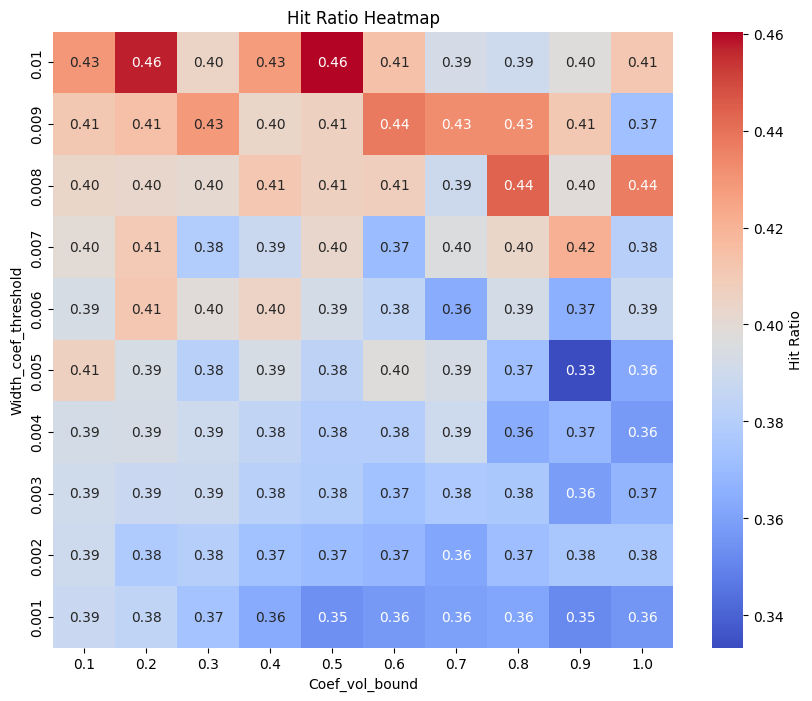

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="hit_ratio")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".2f", 
    cbar_kws={"label": "Hit Ratio"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Hit Ratio Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

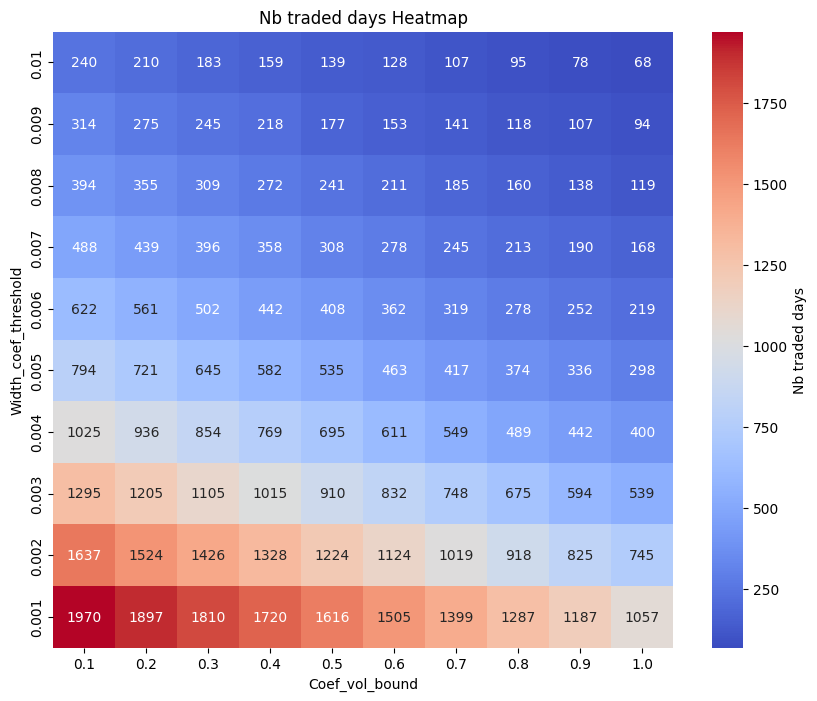

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt

pivot = all_runs_df.pivot_table(index="param2", columns="param1", values="n_traded_days")

# Ensure axes are sorted ascending so (0,0) is bottom-left
pivot = pivot.sort_index(ascending=False).sort_index(axis=1, ascending=True)

plt.figure(figsize=(10,8))
ax = sns.heatmap(
    pivot, 
    cmap="coolwarm", 
    annot=True, fmt=".0f", 
    cbar_kws={"label": "Nb traded days"},
    xticklabels=pivot.columns,
    yticklabels=pivot.index
)


ax.set_title("Nb traded days Heatmap")
ax.set_xlabel("Coef_vol_bound")
ax.set_ylabel("Width_coef_threshold")
plt.show()

In [94]:
p1_grid = [0.08, 0.09, 0.1, 0.11, 0.12]
p2_grid = [0.0045, 0.005, 0.0055]
p3_grid = [14]
p4_grid = [10, 14, 18]
p5_grid = [0.02, 0.05, 0.1]

results = run_grid_search(backtest_with_hyperparameters, p1_grid, p2_grid, p3_grid, p4_grid, p5_grid,  verbose=True)

# Access the DataFrame of all runs:
all_runs_df = results["all_results"]
# Top 10 by total_return:
top10_return = all_runs_df.sort_values("total_return", ascending=False).head(10)
# Top 10 by Sharpe:
top10_sharpe = all_runs_df.sort_values("sharpe", ascending=False).head(10)

all_runs_df

KeyboardInterrupt: KeyboardInterrupt

In [93]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.3)
results

{'total_return': 2.573075,
 'irr_annual': 0.14480136331203042,
 'vol_annual': 0.19739269955655195,
 'sharpe': 0.7813574810581027,
 'hit_ratio': 0.40581542351453853,
 'mdd': -0.25296866729802026,
 'n_days': 2373,
 'n_traded_days': 791}

# Run best strategy

In [95]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [102]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.00,100000.00,0.00,0.000000,False
1,2010-06-08 00:00:00-04:00,100000.00,100000.00,0.00,0.000000,False
2,2010-06-09 00:00:00-04:00,100000.00,100000.00,0.00,0.000000,False
3,2010-06-10 00:00:00-04:00,100000.00,100000.00,0.00,0.000000,False
4,2010-06-11 00:00:00-04:00,100000.00,100000.00,0.00,0.000000,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,481189.00,487231.00,6042.00,0.012556,True
3739,2024-12-26 00:00:00-05:00,487231.00,487231.00,0.00,0.000000,False
3740,2024-12-27 00:00:00-05:00,487231.00,473187.25,-14043.75,-0.028824,True
3741,2024-12-30 00:00:00-05:00,473187.25,473187.25,0.00,0.000000,False


In [104]:
evaluate_strategy(results)

{'total_return': 3.6597549999999996,
 'irr_annual': 0.10916969568033097,
 'vol_annual': 0.22950522893499384,
 'sharpe': 0.5647822151444023,
 'hit_ratio': 0.41509433962264153,
 'mdd': -0.41344642009687477,
 'n_days': 3743,
 'n_traded_days': 1431}

In [103]:
s = results.copy()

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

# Run final strat on the whole dataset

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math

import datetime as dt

import matplotlib.dates as mdates

In [19]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 0.5 * min(4, sigma_target / ret_std)  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(1, len(price_list) - 1):
        if price_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * price_list[i] * 1.00001
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * price_list[i] * 0.99999
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * price_list[i] * 0.99999
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * price_list[i] * 1.00001
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * price_list[-1] * 0.99999
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * price_list[-1] * 1.00001
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [20]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [21]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [28]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
1,2010-06-08 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
2,2010-06-09 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
3,2010-06-10 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
4,2010-06-11 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,398230.027340,400752.646525,2522.619185,0.006335,True
3739,2024-12-26 00:00:00-05:00,400752.646525,400752.646525,0.000000,0.000000,False
3740,2024-12-27 00:00:00-05:00,400752.646525,395028.996175,-5723.650350,-0.014282,True
3741,2024-12-30 00:00:00-05:00,395028.996175,395028.996175,0.000000,0.000000,False


In [29]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [30]:
evaluate_strategy(results)

{'total_return': 2.920607012849785,
 'irr_annual': 0.09634669574129551,
 'vol_annual': 0.11392201474316231,
 'sharpe': 0.8640653284604201,
 'hit_ratio': 0.43469101123595505,
 'mdd': -0.18341747910693418,
 'n_days': 3743,
 'n_traded_days': 1424}

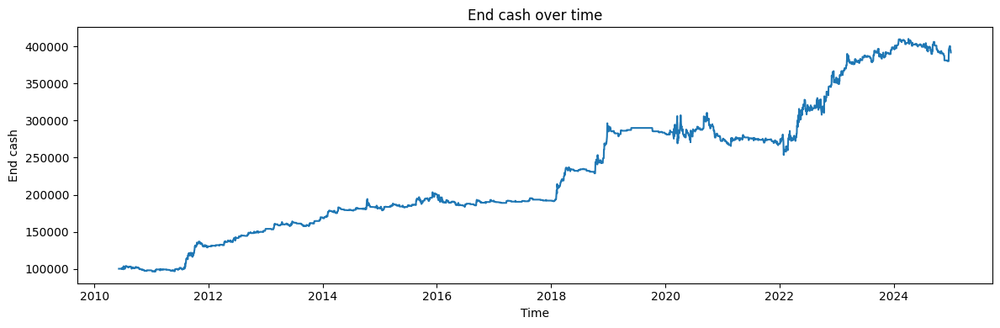

In [37]:
s = results.copy()

# sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
# sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
# sp_df

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

# if "observation_date" in sp_df.columns:
#     sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
#     sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
# plt.plot(sp_df['SP500'].astype(float))
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

In [26]:
# df['spread/price_percent'] = 100 * (df['ask_px_00'] -  df['bid_px_00']) / df['price'] / 2
# df['spread/price_bps'] = 10000 * (df['ask_px_00'] -  df['bid_px_00']) / df['price'] / 2

# df[df['expiry_order']==1].sort_values('Time')

### Without sizing

In [10]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [11]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 1  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(1, len(price_list) - 1):
        if price_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * price_list[i] * 1.00001
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * price_list[i] * 0.99999
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * price_list[i] * 0.99999
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * price_list[i] * 1.00001
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * price_list[-1] * 0.99999
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * price_list[-1] * 1.00001
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [12]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [13]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
1,2010-06-08 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
2,2010-06-09 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
3,2010-06-10 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
4,2010-06-11 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,205070.078476,205705.547431,635.468955,0.003099,True
3739,2024-12-26 00:00:00-05:00,205705.547431,205705.547431,0.000000,0.000000,False
3740,2024-12-27 00:00:00-05:00,205705.547431,204274.634844,-1430.912588,-0.006956,True
3741,2024-12-30 00:00:00-05:00,204274.634844,204274.634844,0.000000,0.000000,False


In [14]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [15]:
evaluate_strategy(results)

{'total_return': 1.0351007403874357,
 'irr_annual': 0.04900064375833679,
 'vol_annual': 0.057489997461675435,
 'sharpe': 0.8608211966335058,
 'hit_ratio': 0.43469101123595505,
 'mdd': -0.09386661993782544,
 'n_days': 3743,
 'n_traded_days': 1424}

In [16]:
s = results.copy()

sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
sp_df

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

if "observation_date" in sp_df.columns:
    sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
    sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
# plt.plot(sp_df['SP500'].astype(float))
plt.plot
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

# Bid ask spread study

In [17]:
df = pd.read_csv('/data/workspace_files/final_us_data.csv')
df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

# (Optional) drop bad rows
df = df.dropna(subset=['Time'])

# Convert UTC -> New York (handles DST)
df['Time'] = df['Time'].dt.tz_convert('America/New_York')

# Build hour/day AFTER conversion
df['hour'] = df['Time'].dt.strftime('%H:%M')
df['day']  = df['Time'].dt.date

# Keep only US RTH 09:30–16:00 ET
market_open, market_close = dt.time(9, 30), dt.time(16, 0)
df = df[df['Time'].dt.time.between(market_open, market_close)]

# Sanity check (optional)
tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

### order by symbol, hour and day
df = df.sort_values(['symbol', 'hour', 'day'])

### price
df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


### opening price
df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


# settling price and previous day settling price
daily_settle = (
    df.sort_values(['symbol','day','Time'])
    .groupby(['symbol','day'])['price']
    .last()
    .rename('settl_price')
)

prev_settle = (
    daily_settle.groupby(level='symbol')
                .shift(1)
                .rename('settl_price_previous')
)

df = df.join(daily_settle, on=['symbol','day'])
df = df.join(prev_settle,   on=['symbol','day'])


### move since opening
df["move"] = np.where(
    df["open_price"] > 0,
    np.abs(df["price"] / df["open_price"] - 1),
    np.nan
)


### compute mean of move over the last period
df['sigma_observed'] = (
    df.groupby(['symbol', 'hour'])['move']
    .transform(lambda x: x.rolling(14, min_periods=14).mean())
)


### compute upper bound
df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + 1 * df['sigma_observed']) + 0.0001 * df['open_price']


### compute lower bound
df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - 1 * df['sigma_observed']) - 0.0001 * df['open_price']


### get return
df['return'] = df['settl_price']/df['open_price'] - 1


### get variance onf returns among the last 14 days
daily = (df.sort_values(['symbol','day'])
        .groupby(['symbol','day'], as_index=False)['return'].last())

daily[f'ret_std_14d'] = (
    daily.groupby('symbol')['return']
        .transform(lambda s: s.rolling(14, min_periods=14).std())
)

df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


df = df.sort_values(['symbol', 'day', 'hour'])
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d
0,2019-01-11 09:33:00-05:00,ESH0,1,NaN,NaN,NaN,09:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
251,2019-01-11 09:48:00-05:00,ESH0,1,NaN,NaN,2588.437500,09:48,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
502,2019-01-11 10:03:00-05:00,ESH0,1,NaN,NaN,2590.375000,10:03,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
753,2019-01-11 10:18:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:18,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1004,2019-01-11 10:33:00-05:00,ESH0,1,NaN,NaN,2591.562500,10:33,2019-01-11,NaN,2596.625,2596.625,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348370,2019-12-19 15:03:00-05:00,ESZ9,4,3204.75,3205.00,3199.697035,15:03,2019-12-19,3204.875,3196.125,3205.875,3191.875,0.002738,0.002545,3204.577670,3183.433145,0.003051,0.003975
348602,2019-12-19 15:18:00-05:00,ESZ9,4,3203.00,3203.25,3199.812436,15:18,2019-12-19,3203.125,3196.125,3205.875,3191.875,0.002190,0.002443,3204.253083,3183.757301,0.003051,0.003975
348834,2019-12-19 15:33:00-05:00,ESZ9,4,3202.75,3203.00,3199.912810,15:33,2019-12-19,3202.875,3196.125,3205.875,3191.875,0.002112,0.002797,3205.384160,3182.627728,0.003051,0.003975
349066,2019-12-19 15:48:00-05:00,ESZ9,4,3202.50,3202.75,3200.020814,15:48,2019-12-19,3202.625,3196.125,3205.875,3191.875,0.002034,0.002616,3204.805085,3183.206033,0.003051,0.003975


In [3]:
df['half_spread'] = 0.5 * (df['ask_px_00'] - df['bid_px_00'])
df['relative_half_spread_bps'] = 10000 * df['half_spread'] / df['price']
df = df[df['expiry_order'] == 1]
df = df.sort_values(['day', 'hour'])
df

,Time,symbol,expiry_order,bid_px_00,ask_px_00,vwap_cum,hour,day,price,open_price,settl_price,settl_price_previous,move,sigma_observed,upper_bound,lower_bound,return,ret_std_14d,half_spread,relative_half_spread_bps
88155,2010-06-07 09:33:00-04:00,ESM0,1,1068.00,1068.25,1066.815187,09:33,2010-06-07,1068.125,1068.125,1049.625,NaN,0.000000,NaN,NaN,NaN,-0.017320,NaN,0.125,1.170275
88378,2010-06-07 09:48:00-04:00,ESM0,1,1062.50,1062.75,1064.171399,09:48,2010-06-07,1062.625,1068.125,1049.625,NaN,0.005149,NaN,NaN,NaN,-0.017320,NaN,0.125,1.176332
88601,2010-06-07 10:03:00-04:00,ESM0,1,1067.00,1067.25,1065.033598,10:03,2010-06-07,1067.125,1068.125,1049.625,NaN,0.000936,NaN,NaN,NaN,-0.017320,NaN,0.125,1.171372
88824,2010-06-07 10:18:00-04:00,ESM0,1,1069.00,1069.25,1065.922294,10:18,2010-06-07,1069.125,1068.125,1049.625,NaN,0.000936,NaN,NaN,NaN,-0.017320,NaN,0.125,1.169180
89047,2010-06-07 10:33:00-04:00,ESM0,1,1065.75,1066.00,1066.297734,10:33,2010-06-07,1065.875,1068.125,1049.625,NaN,0.002106,NaN,NaN,NaN,-0.017320,NaN,0.125,1.172745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60528,2024-12-31 15:03:00-05:00,ESH5,1,5935.00,5935.25,5946.589585,15:03,2024-12-31,5935.125,5970.375,5935.125,5958.125,0.005904,0.005801,6005.609007,5922.962061,-0.005904,0.010434,0.125,0.210611
60914,2024-12-31 15:18:00-05:00,ESH5,1,5929.50,5929.75,5946.009635,15:18,2024-12-31,5929.625,5970.375,5935.125,5958.125,0.006825,0.006075,6007.244169,5921.330254,-0.005904,0.010434,0.125,0.210806
61300,2024-12-31 15:33:00-05:00,ESH5,1,5942.00,5942.25,5945.736517,15:33,2024-12-31,5942.125,5970.375,5935.125,5958.125,0.004732,0.005871,6006.024450,5922.547470,-0.005904,0.010434,0.125,0.210362
61686,2024-12-31 15:48:00-05:00,ESH5,1,5938.75,5939.00,5945.408449,15:48,2024-12-31,5938.875,5970.375,5935.125,5958.125,0.005276,0.006645,6010.642913,5917.938483,-0.005904,0.010434,0.125,0.210478


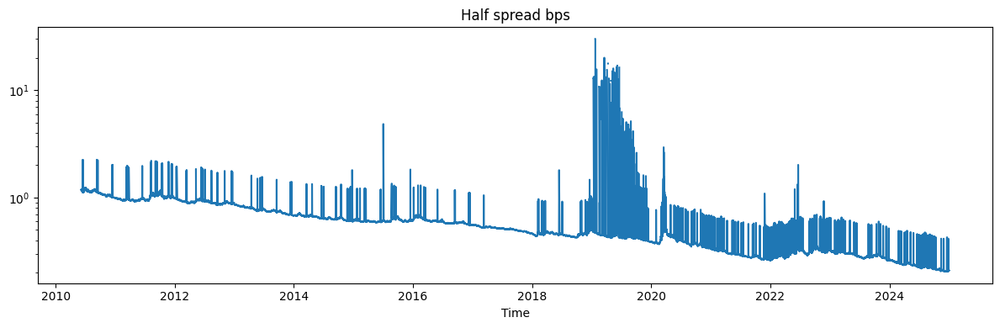

In [5]:
s = df.copy()

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.index, s["relative_half_spread_bps"].astype(float))
plt.yscale("log")
plt.title("Half spread bps")
plt.xlabel("Time")
plt.tight_layout()
plt.show()

#### 1 bps in 2010
#### 0.2 bps in 2025.

# Only positive momentum

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math

import datetime as dt

import matplotlib.dates as mdates

### Without sizing

In [3]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [4]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [5]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 1  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(1, len(price_list) - 1):
        if price_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * price_list[i] * 1.00001
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        # elif price_list[i] < min(vwap_list[i], lower_bound[i]):
        #     # we must be short and sell more than what we already have
        #     if -total_shares_to_hold < position:
        #         shares_to_sell = position + total_shares_to_hold
        #         position -= shares_to_sell
        #         initial_cash += shares_to_sell * price_list[i] * 0.99999
        #         # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        else:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * price_list[i] * 0.99999
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * price_list[-1] * 0.99999
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [42]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [1]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1)
results

NameError: NameError: name 'backtest_with_hyperparameters' is not defined

In [44]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [45]:
evaluate_strategy(results)

{'total_return': 0.41513968024996806,
 'irr_annual': 0.023652768149186487,
 'vol_annual': 0.03596929852613188,
 'sharpe': 0.6678730130591839,
 'hit_ratio': 0.4598337950138504,
 'mdd': -0.0982239405054787,
 'n_days': 3743,
 'n_traded_days': 722}

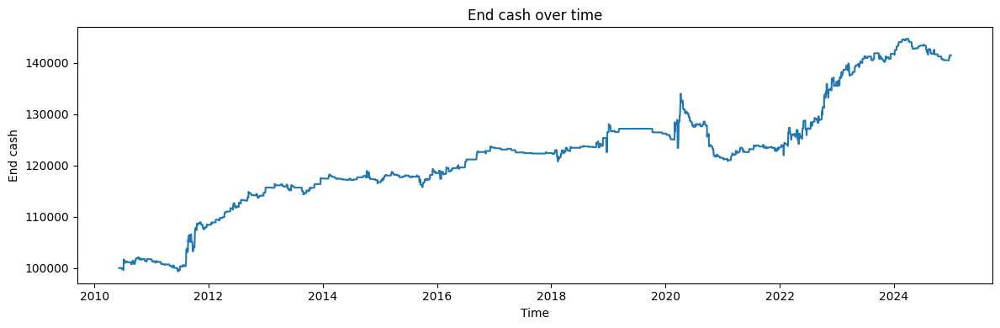

In [60]:
s = results.copy()

sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
sp_df['SP500'] = 0
sp_df

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

if "observation_date" in sp_df.columns:
    sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
    sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

# Only negative momentum

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math

import datetime as dt

import matplotlib.dates as mdates

### Without sizing

In [ ]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [ ]:
def backtest(backtest_df, rank_to_expiry, sigma_target, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [42]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 1  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)

    for i in range(1, len(price_list) - 1):
        if price_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * price_list[i] * 0.99999
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        else:
            if position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * price_list[i] * 1.00001
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    if position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * price_list[-1] * 1.00001
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [43]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization, sigma_leverage_period, sigma_leverage_bound, sigma_target):

    df = pd.read_csv('/data/workspace_files/final_us_data.csv')
    df = df[['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum']]

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)

    # (Optional) drop bad rows
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST)
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')

    # Build hour/day AFTER conversion
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date

    # Keep only US RTH 09:30–16:00 ET
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Sanity check (optional)
    tmin, tmax = df['Time'].dt.time.min(), df['Time'].dt.time.max()

    ### order by symbol, hour and day
    df = df.sort_values(['symbol', 'hour', 'day'])

    ### price
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])


    ### opening price
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')


    # settling price and previous day settling price
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
        .groupby(['symbol','day'])['price']
        .last()
        .rename('settl_price')
    )

    prev_settle = (
        daily_settle.groupby(level='symbol')
                    .shift(1)
                    .rename('settl_price_previous')
    )

    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])


    ### move since opening
    df["move"] = np.where(
        df["open_price"] > 0,
        np.abs(df["price"] / df["open_price"] - 1),
        np.nan
    )


    ### compute mean of move over the last period
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
        .transform(lambda x: x.rolling(sigma_leverage_bound, min_periods=sigma_leverage_bound).mean())
    )


    ### compute upper bound
    df['upper_bound'] = (df[['open_price', 'settl_price_previous']].max(axis=1)) * (1 + coef_sigma * df['sigma_observed']) + percentage_penalization * df['open_price']


    ### compute lower bound
    df['lower_bound'] = (df[['open_price', 'settl_price_previous']].min(axis=1)) * (1 - coef_sigma * df['sigma_observed']) - percentage_penalization * df['open_price']


    ### get return
    df['return'] = df['settl_price']/df['open_price'] - 1


    ### get variance onf returns among the last 14 days
    daily = (df.sort_values(['symbol','day'])
            .groupby(['symbol','day'], as_index=False)['return'].last())

    daily[f'ret_std_14d'] = (
        daily.groupby('symbol')['return']
            .transform(lambda s: s.rolling(sigma_leverage_period, min_periods=sigma_leverage_period).std())
    )

    df = df.merge(daily[['symbol','day', f'ret_std_14d']], on=['symbol','day'], how='left')


    df = df.sort_values(['symbol', 'day', 'hour'])

    results = backtest(df, 1, sigma_target)

    return results


In [44]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
1,2010-06-08 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
2,2010-06-09 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
3,2010-06-10 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
4,2010-06-11 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,142632.560915,142632.560915,0.000000,0.000000,False
3739,2024-12-26 00:00:00-05:00,142632.560915,142632.560915,0.000000,0.000000,False
3740,2024-12-27 00:00:00-05:00,142632.560915,141635.258202,-997.302713,-0.006992,True
3741,2024-12-30 00:00:00-05:00,141635.258202,141635.258202,0.000000,0.000000,False


In [45]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [46]:
evaluate_strategy(results)

{'total_return': 0.41118055304997014,
 'irr_annual': 0.023459704376622037,
 'vol_annual': 0.045382487486150556,
 'sharpe': 0.5335265310863133,
 'hit_ratio': 0.40186915887850466,
 'mdd': -0.06873298289166467,
 'n_days': 3743,
 'n_traded_days': 749}

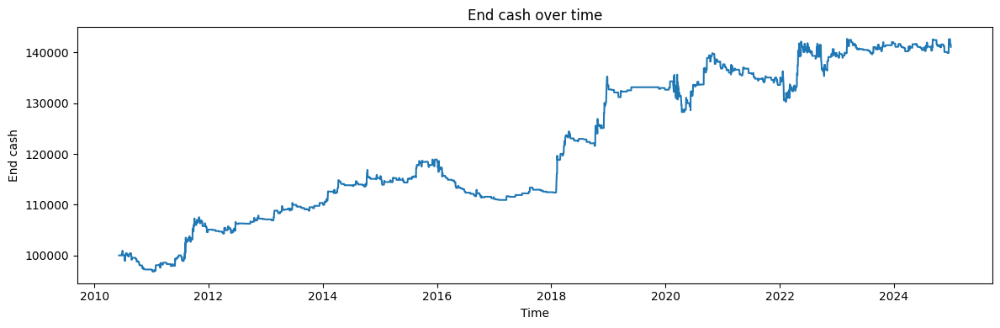

In [47]:
s = results.copy()

sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
sp_df

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

if "observation_date" in sp_df.columns:
    sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
    sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
# plt.plot(sp_df['SP500'].astype(float))
plt.plot
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

# VIX conditionning

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import math

import datetime as dt

import matplotlib.dates as mdates

# Volatility lower treshold

In [73]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization,
                                  sigma_leverage_period, sigma_leverage_bound, sigma_target, VIX_treshold):

    # ---------- Load & prepare intraday data ----------
    df = pd.read_csv('/data/workspace_files/final_us_data.csv',
                     usecols=['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum'])

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST) and build hour/day on NY time
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date        # <-- keep as datetime.date (DO NOT stringify)

    # US RTH 09:30–16:00 ET
    import datetime as dt
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Order & mid price
    df = df.sort_values(['symbol', 'hour', 'day'])
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])

    # Opening price per symbol-day
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')

    # Settle and previous settle (per symbol/day)
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
          .groupby(['symbol','day'])['price'].last()
          .rename('settl_price')
    )
    prev_settle = (
        daily_settle.groupby(level='symbol').shift(1).rename('settl_price_previous')
    )
    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])

    # Intraday move vs open
    df['move'] = np.where(
        df['open_price'] > 0,
        np.abs(df['price'] / df['open_price'] - 1),
        np.nan
    )

    # Rolling mean of move by (symbol, hour)
    win = int(sigma_leverage_bound) if sigma_leverage_bound is not None else 1
    if win < 1:
        win = 1
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
          .transform(lambda x: x.rolling(win, min_periods=win).mean())
    )

    # Bands
    df['upper_bound'] = df[['open_price','settl_price_previous']].max(axis=1) * (1 + coef_sigma * df['sigma_observed']) \
                        + percentage_penalization * df['open_price']
    df['lower_bound'] = df[['open_price','settl_price_previous']].min(axis=1) * (1 - coef_sigma * df['sigma_observed']) \
                        - percentage_penalization * df['open_price']

    # End-of-day return
    df['return'] = df['settl_price'] / df['open_price'] - 1

    # 14D rolling std of returns per symbol
    daily = (df.sort_values(['symbol','day'])
               .groupby(['symbol','day'], as_index=False)['return'].last())
    daily['ret_std_14d'] = (
        daily.groupby('symbol')['return']
             .transform(lambda s: s.rolling(int(sigma_leverage_period), min_periods=int(sigma_leverage_period)).std())
    )
    df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')

    df = df.sort_values(['symbol', 'day', 'hour'])

    # ---------- Load & merge VIX (daily) ----------
    vol_df = pd.read_csv('/data/workspace_files/VIX_History.csv', usecols=['DATE', 'CLOSE'])
    vol_df = vol_df.rename(columns={'DATE':'day', 'CLOSE':'VIX'})

    # Parse to timezone-naive dates and shift by one day (use yesterday's VIX)
    vol_df['day'] = pd.to_datetime(vol_df['day'], format='%m/%d/%Y', errors='coerce').dt.date
    vol_df = vol_df.dropna(subset=['day'])
    vol_df = vol_df.sort_values('day')
    vol_df['VIX'] = pd.to_numeric(vol_df['VIX'], errors='coerce').shift(1)

    # Ensure unique per-day (take last if duplicates)
    vol_df = vol_df.groupby('day', as_index=False).last()

    # Some trading days may not have VIX (holidays). Build a calendar from df['day'] and ffill VIX.
    all_days = pd.DataFrame({'day': sorted(df['day'].unique())})
    vol_df = all_days.merge(vol_df, on='day', how='left').sort_values('day')
    vol_df['VIX'] = vol_df['VIX'].ffill()

    # Merge back (left join; broadcasts daily VIX to intraday rows)
    df = df.merge(vol_df, on='day', how='left')

    # ---------- Run backtest ----------
    results = backtest(df, 1, sigma_target, VIX_treshold)
    return results

In [74]:
def backtest(backtest_df, rank_to_expiry, sigma_target, VIX_treshold, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target, VIX_treshold)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [75]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target, VIX_treshold):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    if backtest_df['VIX'].iloc[0] < VIX_treshold:
        return initial_cash

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 0.5 * min(4, sigma_target / ret_std)  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)



    for i in range(1, len(price_list) - 1):
        if price_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * price_list[i] * 1.00001
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * price_list[i] * 0.99999
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * price_list[i] * 0.99999
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * price_list[i] * 1.00001
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * price_list[-1] * 0.99999
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * price_list[-1] * 1.00001
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [80]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1, 20)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
1,2010-06-08 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
2,2010-06-09 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
3,2010-06-10 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
4,2010-06-11 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,196664.141121,196664.141121,0.0,0.0,False
3739,2024-12-26 00:00:00-05:00,196664.141121,196664.141121,0.0,0.0,False
3740,2024-12-27 00:00:00-05:00,196664.141121,196664.141121,0.0,0.0,False
3741,2024-12-30 00:00:00-05:00,196664.141121,196664.141121,0.0,0.0,False


In [81]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [82]:
evaluate_strategy(results)

{'total_return': 0.966641411212418,
 'irr_annual': 0.04658678299393482,
 'vol_annual': 0.09847688913784838,
 'sharpe': 0.5112849627754379,
 'hit_ratio': 0.4523449319213313,
 'mdd': -0.1781763780436855,
 'n_days': 3743,
 'n_traded_days': 661}

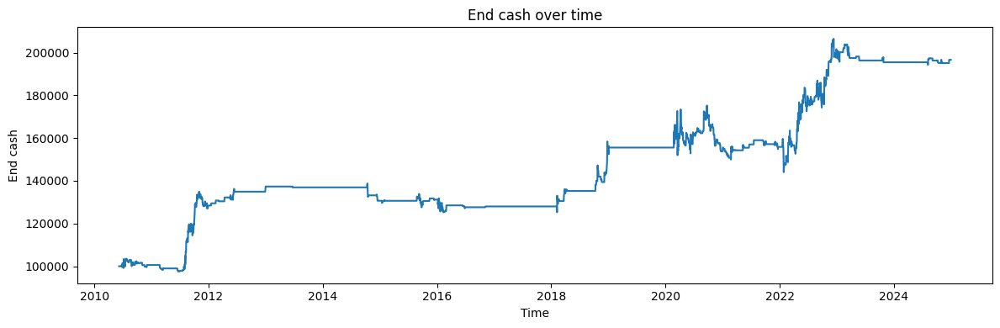

In [83]:
s = results.copy()

sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
sp_df

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

if "observation_date" in sp_df.columns:
    sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
    sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
# plt.plot(sp_df['SP500'].astype(float))
plt.plot
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

Results for VIX treshold: 10
{'total_return': 2.9426795382997812, 'irr_annual': 0.09676116255663403, 'vol_annual': 0.11392317995074701, 'sharpe': 0.8673762275357245, 'hit_ratio': 0.4355179704016913, 'mdd': -0.18321474680506908, 'n_days': 3743, 'n_traded_days': 1419}
Results for VIX treshold: 12
{'total_return': 2.7784890923747945, 'irr_annual': 0.0936247630474405, 'vol_annual': 0.11362419631407783, 'sharpe': 0.8441472878809023, 'hit_ratio': 0.43700503959683223, 'mdd': -0.1827183594542913, 'n_days': 3743, 'n_traded_days': 1389}
Results for VIX treshold: 14
{'total_return': 2.385900048024813, 'irr_annual': 0.08557708737822045, 'vol_annual': 0.11174574707958854, 'sharpe': 0.7903380140316003, 'hit_ratio': 0.44025661587810744, 'mdd': -0.18343967839454714, 'n_days': 3743, 'n_traded_days': 1247}
Results for VIX treshold: 16
{'total_return': 1.981124525749852, 'irr_annual': 0.07631145252525906, 'vol_annual': 0.10769921068010505, 'sharpe': 0.736339323838252, 'hit_ratio': 0.4504761904761905, 'md

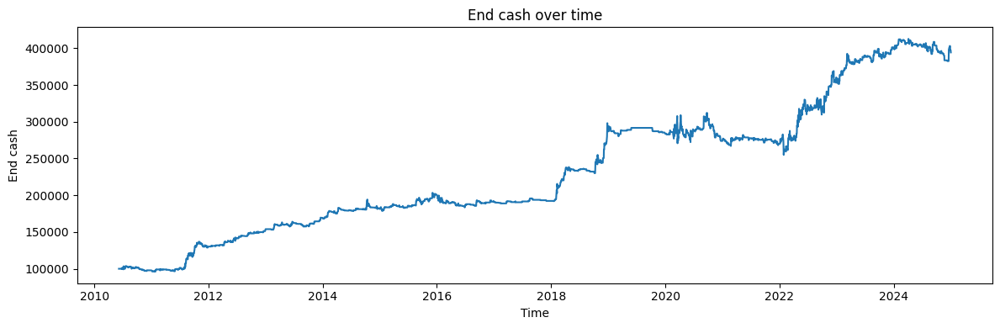

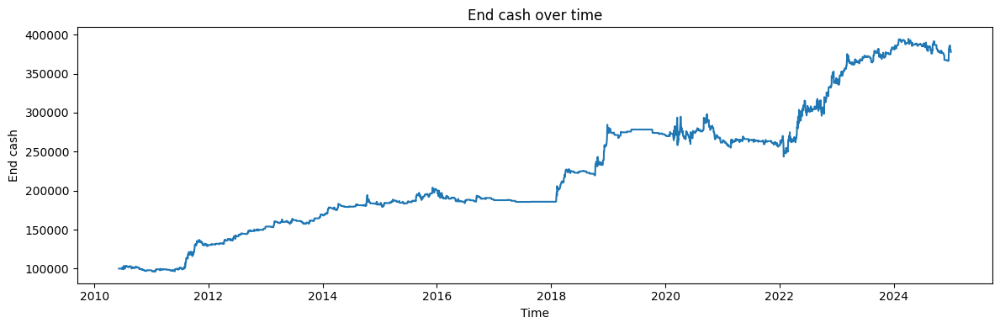

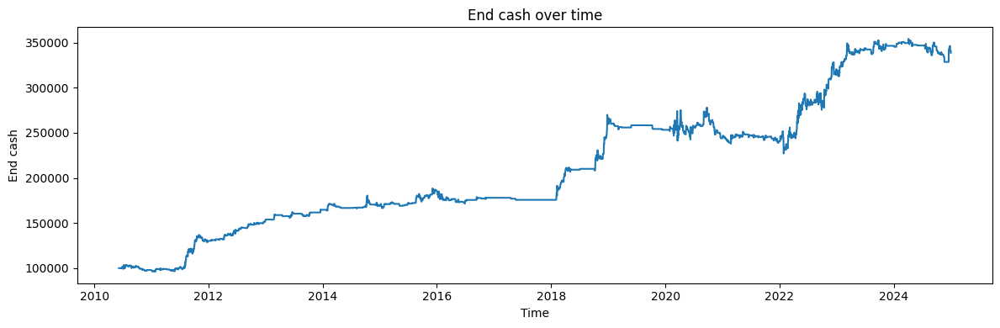

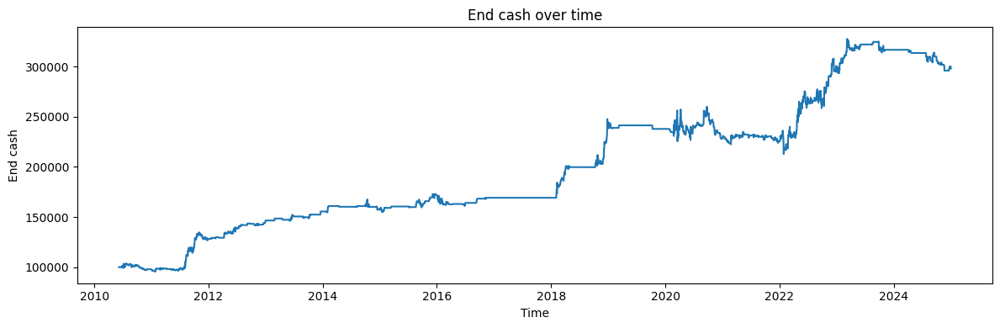

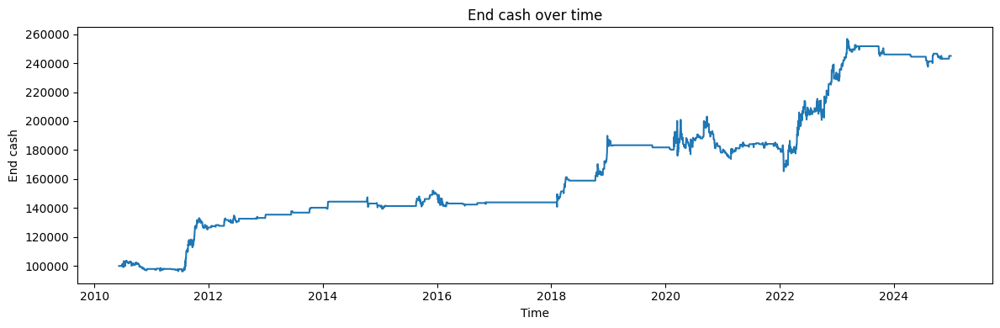

...

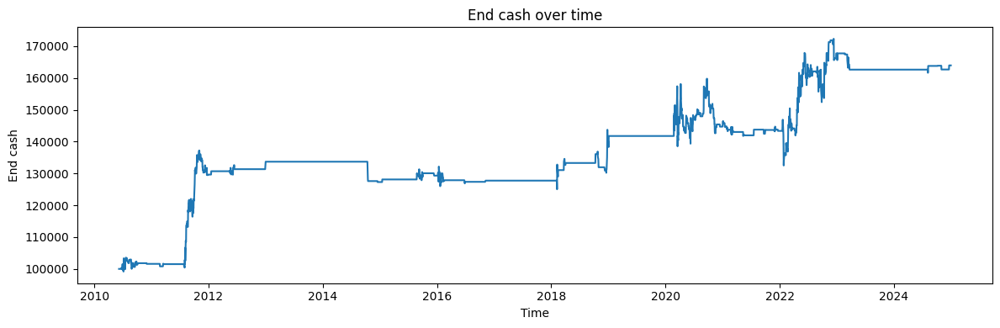

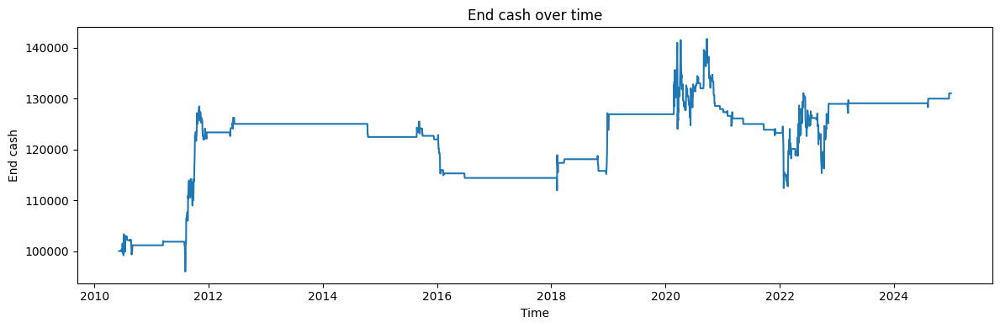

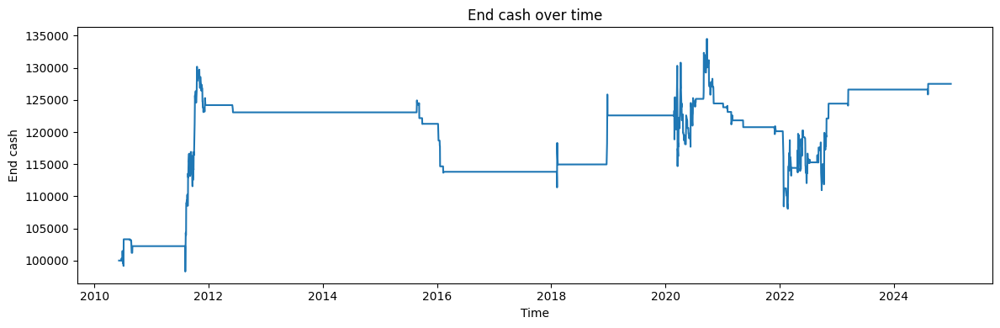

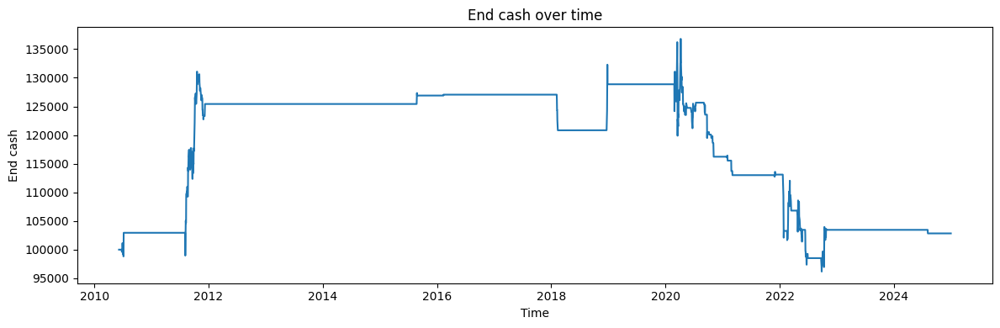

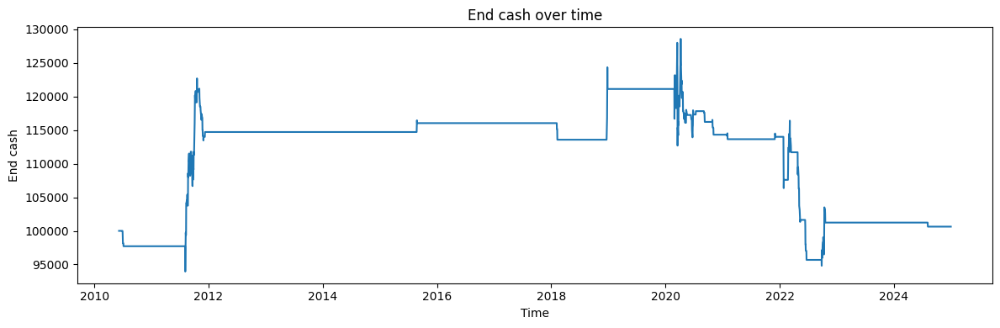

In [86]:
for i in [10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30]:
    results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1, i)
    print(f"Results for VIX treshold: {i}")
    print(evaluate_strategy(results))
    s = results.copy()
    
    # If you have a Time column, make it the datetime index
    if "Time" in s.columns:
        s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
        s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

    # Plot end_cash over time
    plt.figure(figsize=(12,4))
    plt.plot(s.date, s["end_cash"].astype(float))
    # plt.plot(sp_df['SP500'].astype(float))
    plt.plot
    plt.title("End cash over time")
    plt.xlabel("Time")
    plt.ylabel("End cash")
    plt.tight_layout()
    plt.show()

Results for VIX treshold: 30
{'total_return': 0.006300099137487747, 'irr_annual': 0.0004229172940648507, 'vol_annual': 0.06713609588718768, 'sharpe': 0.039764014976679696, 'hit_ratio': 0.40217391304347827, 'mdd': -0.2625425301743036, 'n_days': 3743, 'n_traded_days': 184}
Results for VIX treshold: 32
{'total_return': 0.14019682457498517, 'irr_annual': 0.008872316880618847, 'vol_annual': 0.05997511998549994, 'sharpe': 0.1771539200077972, 'hit_ratio': 0.424, 'mdd': -0.22953980986172698, 'n_days': 3743, 'n_traded_days': 125}
Results for VIX treshold: 34
{'total_return': 0.13945829051249126, 'irr_annual': 0.008828308150265363, 'vol_annual': 0.052110002741884986, 'sharpe': 0.1947258182784154, 'hit_ratio': 0.44047619047619047, 'mdd': -0.1769922357782964, 'n_days': 3743, 'n_traded_days': 84}
Results for VIX treshold: 36
{'total_return': 0.20565240412499297, 'irr_annual': 0.012670908077652587, 'vol_annual': 0.051235230264472596, 'sharpe': 0.27137222183929915, 'hit_ratio': 0.49230769230769234, '

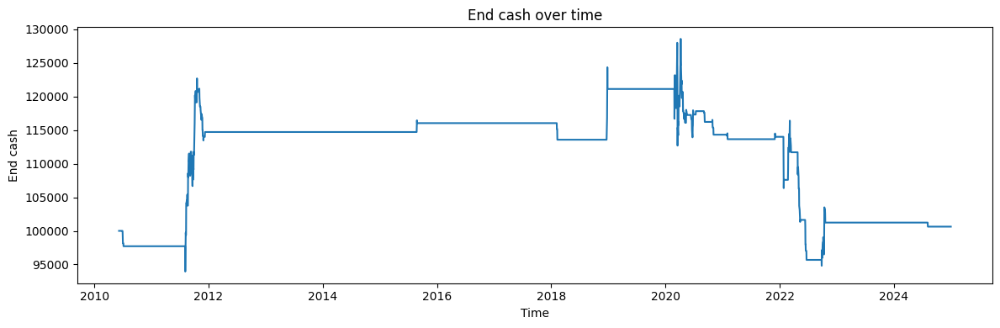

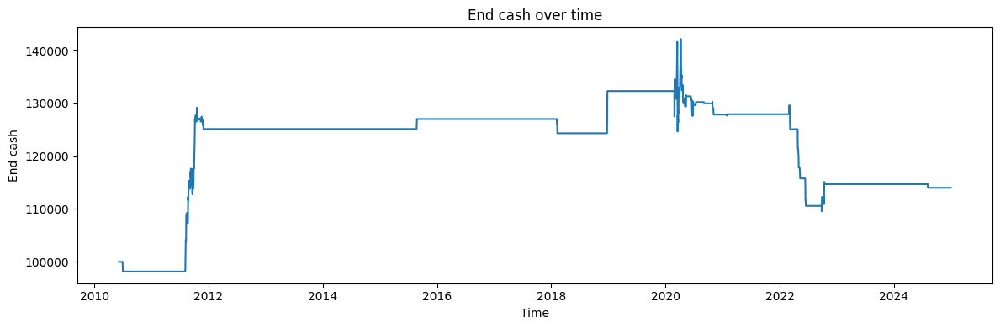

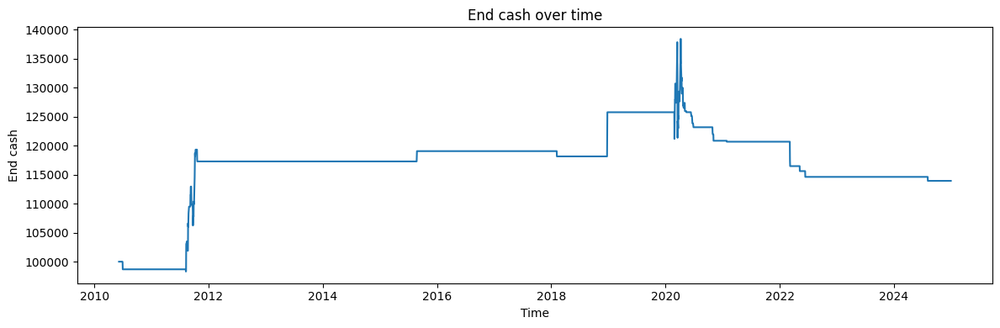

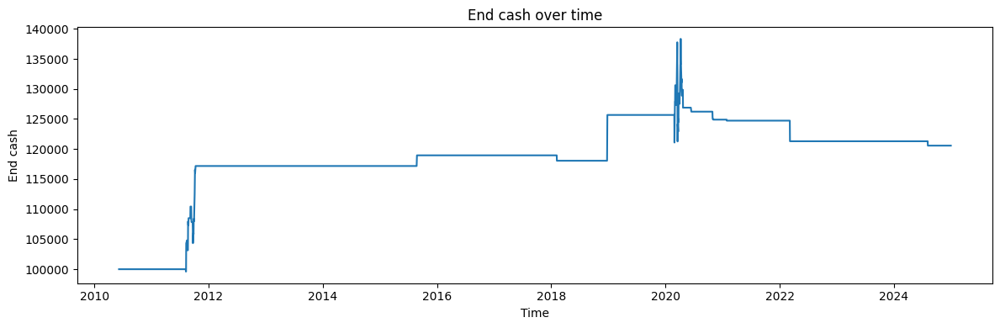

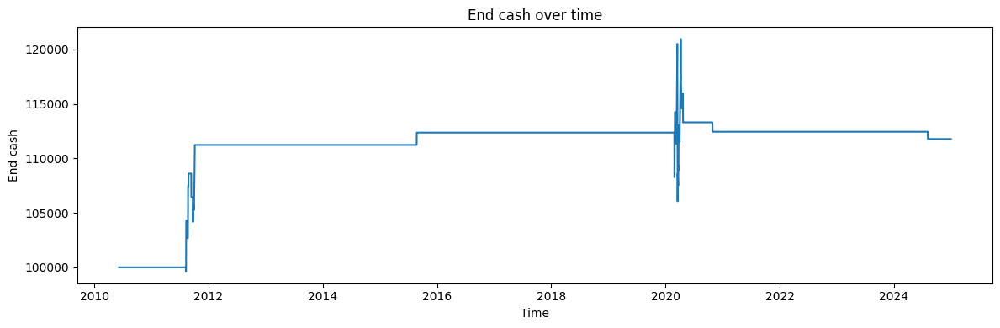

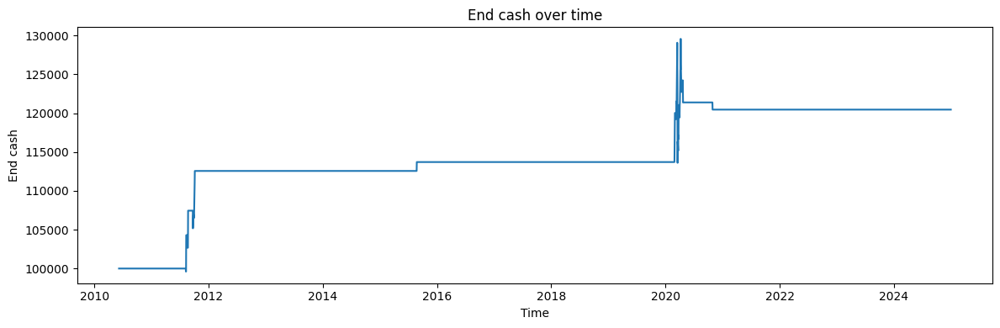

In [87]:
for i in [30, 32, 34, 36, 38, 40]:
    results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1, i)
    print(f"Results for VIX treshold: {i}")
    print(evaluate_strategy(results))
    s = results.copy()

    sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
    sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
    sp_df

    # If you have a Time column, make it the datetime index
    if "Time" in s.columns:
        s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
        s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

    if "observation_date" in sp_df.columns:
        sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
        sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

    # Plot end_cash over time
    plt.figure(figsize=(12,4))
    plt.plot(s.date, s["end_cash"].astype(float))
    # plt.plot(sp_df['SP500'].astype(float))
    plt.plot
    plt.title("End cash over time")
    plt.xlabel("Time")
    plt.ylabel("End cash")
    plt.tight_layout()
    plt.show()

# volatility upper threshold

In [18]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization,
                                  sigma_leverage_period, sigma_leverage_bound, sigma_target, VIX_treshold):

    # ---------- Load & prepare intraday data ----------
    df = pd.read_csv('/data/workspace_files/final_us_data.csv',
                     usecols=['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum'])

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST) and build hour/day on NY time
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date        # <-- keep as datetime.date (DO NOT stringify)

    # US RTH 09:30–16:00 ET
    import datetime as dt
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Order & mid price
    df = df.sort_values(['symbol', 'hour', 'day'])
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])

    # Opening price per symbol-day
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')

    # Settle and previous settle (per symbol/day)
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
          .groupby(['symbol','day'])['price'].last()
          .rename('settl_price')
    )
    prev_settle = (
        daily_settle.groupby(level='symbol').shift(1).rename('settl_price_previous')
    )
    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])

    # Intraday move vs open
    df['move'] = np.where(
        df['open_price'] > 0,
        np.abs(df['price'] / df['open_price'] - 1),
        np.nan
    )

    # Rolling mean of move by (symbol, hour)
    win = int(sigma_leverage_bound) if sigma_leverage_bound is not None else 1
    if win < 1:
        win = 1
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
          .transform(lambda x: x.rolling(win, min_periods=win).mean())
    )

    # Bands
    df['upper_bound'] = df[['open_price','settl_price_previous']].max(axis=1) * (1 + coef_sigma * df['sigma_observed']) \
                        + percentage_penalization * df['open_price']
    df['lower_bound'] = df[['open_price','settl_price_previous']].min(axis=1) * (1 - coef_sigma * df['sigma_observed']) \
                        - percentage_penalization * df['open_price']

    # End-of-day return
    df['return'] = df['settl_price'] / df['open_price'] - 1

    # 14D rolling std of returns per symbol
    daily = (df.sort_values(['symbol','day'])
               .groupby(['symbol','day'], as_index=False)['return'].last())
    daily['ret_std_14d'] = (
        daily.groupby('symbol')['return']
             .transform(lambda s: s.rolling(int(sigma_leverage_period), min_periods=int(sigma_leverage_period)).std())
    )
    df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')

    df = df.sort_values(['symbol', 'day', 'hour'])

    # ---------- Load & merge VIX (daily) ----------
    vol_df = pd.read_csv('/data/workspace_files/VIX_History.csv', usecols=['DATE', 'CLOSE'])
    vol_df = vol_df.rename(columns={'DATE':'day', 'CLOSE':'VIX'})

    # Parse to timezone-naive dates and shift by one day (use yesterday's VIX)
    vol_df['day'] = pd.to_datetime(vol_df['day'], format='%m/%d/%Y', errors='coerce').dt.date
    vol_df = vol_df.dropna(subset=['day'])
    vol_df = vol_df.sort_values('day')
    vol_df['VIX'] = pd.to_numeric(vol_df['VIX'], errors='coerce').shift(1)

    # Ensure unique per-day (take last if duplicates)
    vol_df = vol_df.groupby('day', as_index=False).last()

    # Some trading days may not have VIX (holidays). Build a calendar from df['day'] and ffill VIX.
    all_days = pd.DataFrame({'day': sorted(df['day'].unique())})
    vol_df = all_days.merge(vol_df, on='day', how='left').sort_values('day')
    vol_df['VIX'] = vol_df['VIX'].ffill()

    # Merge back (left join; broadcasts daily VIX to intraday rows)
    df = df.merge(vol_df, on='day', how='left')

    # ---------- Run backtest ----------
    results = backtest(df, 1, sigma_target, VIX_treshold)
    return results

In [19]:
def backtest(backtest_df, rank_to_expiry, sigma_target, VIX_treshold, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target, VIX_treshold)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [20]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target, VIX_treshold):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    if backtest_df['VIX'].iloc[0] >= VIX_treshold:
        return initial_cash

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 1  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)



    for i in range(1, len(price_list) - 1):
        if price_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * price_list[i] * 1.00001
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * price_list[i] * 0.99999
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * price_list[i] * 0.99999
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * price_list[i] * 1.00001
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * price_list[-1] * 0.99999
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * price_list[-1] * 1.00001
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [21]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.2, np.inf)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
1,2010-06-08 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
2,2010-06-09 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
3,2010-06-10 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
4,2010-06-11 00:00:00-04:00,100000.000000,100000.000000,0.000000,0.000000,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,205070.078476,205705.547431,635.468955,0.003099,True
3739,2024-12-26 00:00:00-05:00,205705.547431,205705.547431,0.000000,0.000000,False
3740,2024-12-27 00:00:00-05:00,205705.547431,204274.634844,-1430.912588,-0.006956,True
3741,2024-12-30 00:00:00-05:00,204274.634844,204274.634844,0.000000,0.000000,False


In [22]:
def evaluate_strategy(perf: pd.DataFrame, risk_free_rate: float = 0.0) -> dict:
    # Basic checks and ordering
    needed = {'date','start_cash','end_cash','pnl','return','traded'}
    missing = needed.difference(perf.columns)
    if missing:
        raise ValueError(f"Missing required columns: {sorted(missing)}")

    df = perf.copy().sort_values('date').reset_index(drop=True)

    # Total return (equity curve start->end)
    total_return = df["end_cash"].iloc[-1] / df["start_cash"].iloc[0] - 1

    # Daily returns (drop NaNs/infs quietly)
    daily_returns = pd.to_numeric(df["return"], errors="coerce").replace([np.inf, -np.inf], np.nan).dropna()
    n_obs = len(daily_returns)

    # Geometric mean daily return (IRR over observed daily returns)
    if n_obs > 0:
        gross = (1.0 + daily_returns.values)
        irr_daily = np.prod(gross) ** (1.0 / n_obs) - 1.0
        irr_annual = (1.0 + irr_daily) ** 252 - 1.0
    else:
        irr_daily = np.nan
        irr_annual = np.nan

    # Volatility (annualized)
    if n_obs > 1:
        vol_daily = float(daily_returns.std(ddof=1))
        vol_annual = vol_daily * np.sqrt(252.0)
    else:
        vol_daily = np.nan
        vol_annual = np.nan

    # Sharpe (annualized), using annual rf converted to daily
    rf_daily = (1.0 + float(risk_free_rate)) ** (1.0 / 252.0) - 1.0
    if n_obs > 1 and pd.notna(vol_daily) and vol_daily > 0:
        sharpe = ((daily_returns.mean() - rf_daily) / vol_daily) * np.sqrt(252.0)
    else:
        sharpe = np.nan

    # Hit ratio among traded days (your 'traded' flag)
    traded_days = df[df["traded"] == True]
    if len(traded_days) > 0:
        hit_ratio = float((traded_days["pnl"] > 0).mean())
    else:
        hit_ratio = np.nan

    # Max drawdown on the equity curve (end_cash)
    cum_curve = pd.to_numeric(df["end_cash"], errors="coerce")
    rolling_max = cum_curve.cummax()
    drawdowns = (cum_curve - rolling_max) / rolling_max
    mdd = float(drawdowns.min())  # negative number (e.g., -0.18 for -18%)

    return {
        "total_return": float(total_return),
        "irr_annual": float(irr_annual) if pd.notna(irr_annual) else np.nan,
        "vol_annual": float(vol_annual) if pd.notna(vol_annual) else np.nan,
        "sharpe": float(sharpe) if pd.notna(sharpe) else np.nan,
        "hit_ratio": float(hit_ratio) if pd.notna(hit_ratio) else np.nan,
        "mdd": mdd,
        "n_days": int(len(df)),
        "n_traded_days": int(len(traded_days)),
    }

In [23]:
evaluate_strategy(results)

{'total_return': 1.0351007403874357,
 'irr_annual': 0.04900064375833679,
 'vol_annual': 0.057489997461675435,
 'sharpe': 0.8608211966335058,
 'hit_ratio': 0.43469101123595505,
 'mdd': -0.09386661993782544,
 'n_days': 3743,
 'n_traded_days': 1424}

In [24]:
s = results.copy()

sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
sp_df

# If you have a Time column, make it the datetime index
if "Time" in s.columns:
    s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
    s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

if "observation_date" in sp_df.columns:
    sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
    sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

# Plot end_cash over time
plt.figure(figsize=(12,4))
plt.plot(s.date, s["end_cash"].astype(float))
# plt.plot(sp_df['SP500'].astype(float))
plt.plot
plt.title("End cash over time")
plt.xlabel("Time")
plt.ylabel("End cash")
plt.tight_layout()
plt.show()

Results for VIX treshold: 0
{'total_return': 0.0, 'irr_annual': 0.0, 'vol_annual': 0.0, 'sharpe': nan, 'hit_ratio': nan, 'mdd': 0.0, 'n_days': 3743, 'n_traded_days': 0}
Results for VIX treshold: 10
{'total_return': -0.002329249124999877, 'irr_annual': -0.00015698886310422377, 'vol_annual': 0.0008635500002715931, 'sharpe': -0.1813773770649726, 'hit_ratio': 0.2, 'mdd': -0.0029441713000000163, 'n_days': 3743, 'n_traded_days': 5}
Results for VIX treshold: 12
{'total_return': 0.019815199674998896, 'irr_annual': 0.0013218992263506202, 'vol_annual': 0.0041208554414554205, 'sharpe': 0.32262499414744505, 'hit_ratio': 0.34285714285714286, 'mdd': -0.010540739546654564, 'n_days': 3743, 'n_traded_days': 35}
Results for VIX treshold: 14
{'total_return': 0.07520935087499514, 'irr_annual': 0.004894084489704076, 'vol_annual': 0.010905023228459003, 'sharpe': 0.45313334070076144, 'hit_ratio': 0.3954802259887006, 'mdd': -0.016794228897619327, 'n_days': 3743, 'n_traded_days': 177}
Results for VIX treshold:

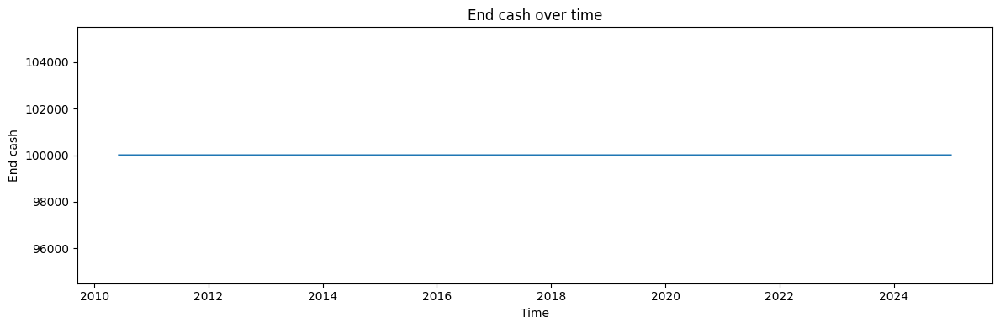

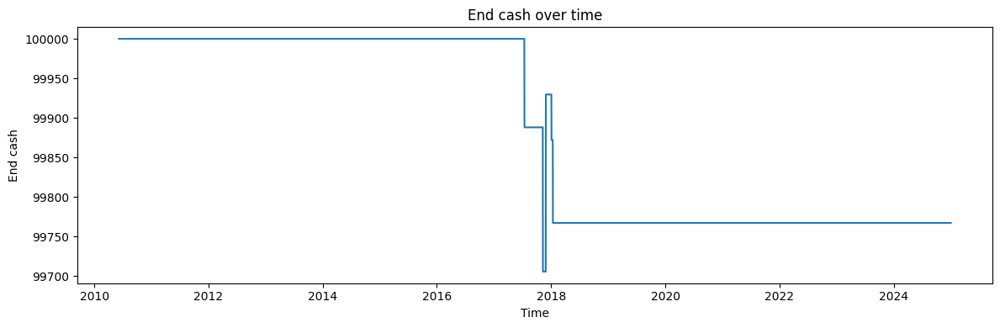

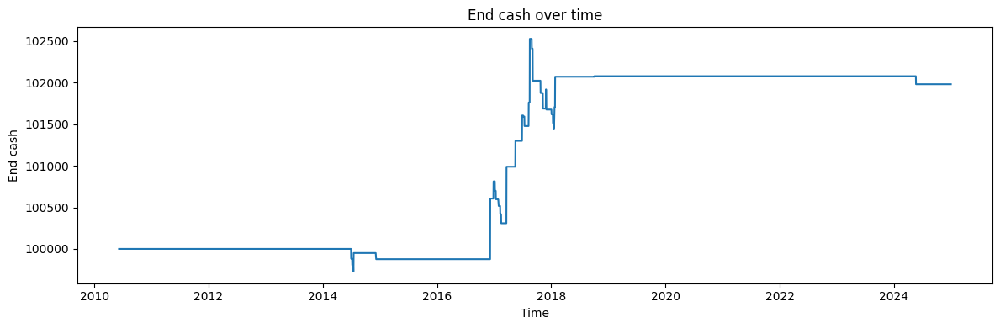

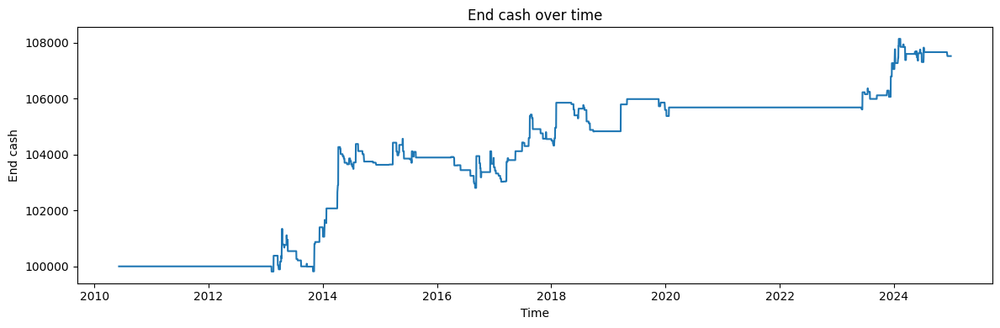

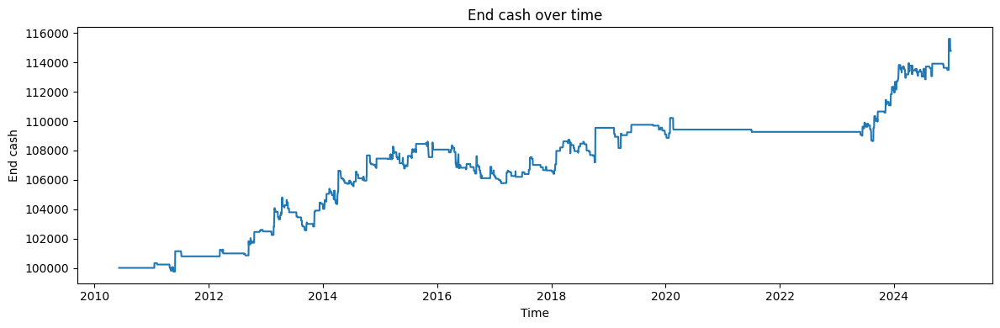

...

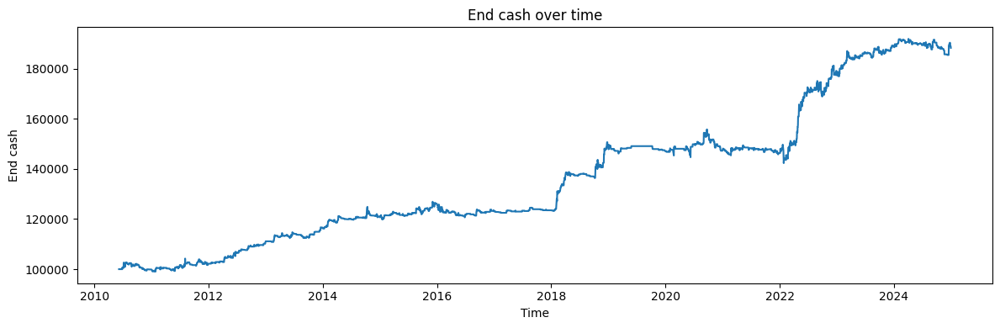

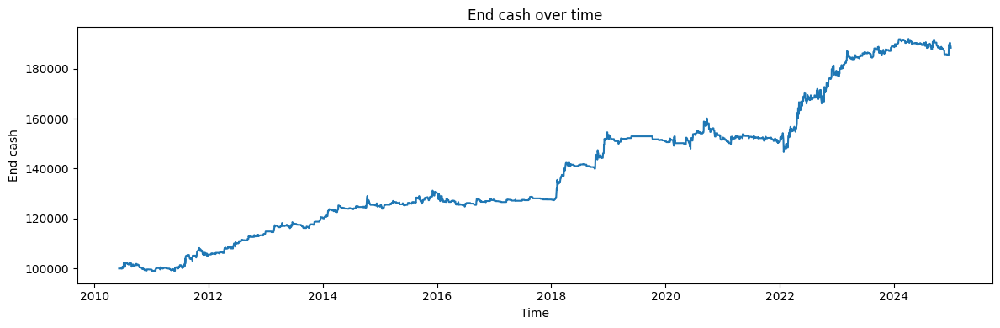

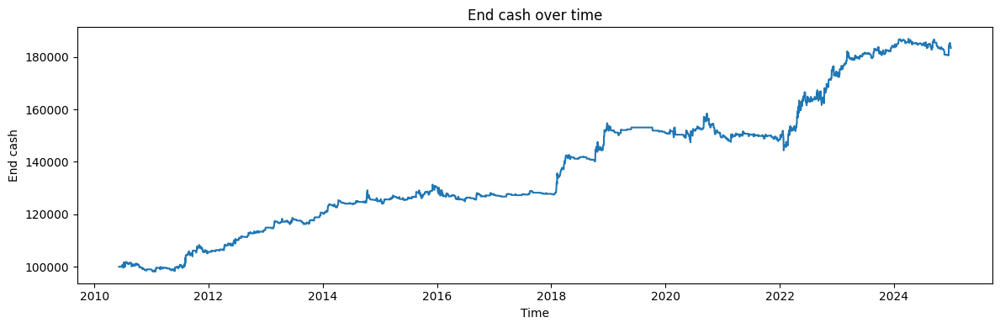

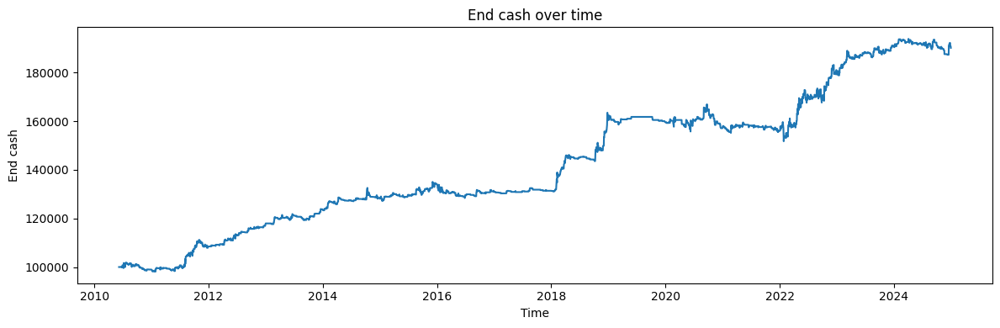

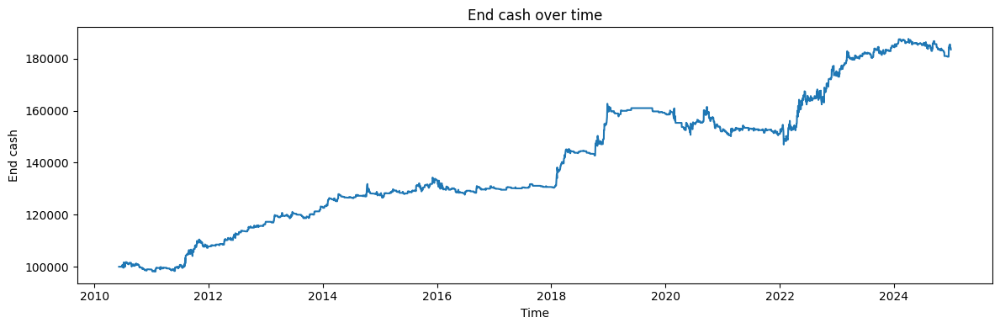

In [27]:
for i in [0, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 1000]:
    results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.2, i)
    print(f"Results for VIX treshold: {i}")
    print(evaluate_strategy(results))
    s = results.copy()
    
    # If you have a Time column, make it the datetime index
    if "Time" in s.columns:
        s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
        s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

    # Plot end_cash over time
    plt.figure(figsize=(12,4))
    plt.plot(s.date, s["end_cash"].astype(float))
    # plt.plot(sp_df['SP500'].astype(float))
    plt.plot
    plt.title("End cash over time")
    plt.xlabel("Time")
    plt.ylabel("End cash")
    plt.tight_layout()
    plt.show()

# Volatility upper and lower treshold

In [92]:
def backtest_with_hyperparameters(coef_sigma, percentage_penalization,
                                  sigma_leverage_period, sigma_leverage_bound, sigma_target, VIX_treshold_upper, VIX_treshold_lower):

    # ---------- Load & prepare intraday data ----------
    df = pd.read_csv('/data/workspace_files/final_us_data.csv',
                     usecols=['Time', 'symbol', 'expiry_order', 'bid_px_00', 'ask_px_00', 'vwap_cum'])

    df['Time'] = pd.to_datetime(df['Time'], errors='coerce', utc=True)
    df = df.dropna(subset=['Time'])

    # Convert UTC -> New York (handles DST) and build hour/day on NY time
    df['Time'] = df['Time'].dt.tz_convert('America/New_York')
    df['hour'] = df['Time'].dt.strftime('%H:%M')
    df['day']  = df['Time'].dt.date        # <-- keep as datetime.date (DO NOT stringify)

    # US RTH 09:30–16:00 ET
    import datetime as dt
    market_open, market_close = dt.time(9, 30), dt.time(16, 0)
    df = df[df['Time'].dt.time.between(market_open, market_close)]

    # Order & mid price
    df = df.sort_values(['symbol', 'hour', 'day'])
    df['price'] = 0.5 * (df['bid_px_00'] + df['ask_px_00'])

    # Opening price per symbol-day
    df['open_price'] = df.groupby(['symbol', 'day'])['price'].transform('first')

    # Settle and previous settle (per symbol/day)
    daily_settle = (
        df.sort_values(['symbol','day','Time'])
          .groupby(['symbol','day'])['price'].last()
          .rename('settl_price')
    )
    prev_settle = (
        daily_settle.groupby(level='symbol').shift(1).rename('settl_price_previous')
    )
    df = df.join(daily_settle, on=['symbol','day'])
    df = df.join(prev_settle,   on=['symbol','day'])

    # Intraday move vs open
    df['move'] = np.where(
        df['open_price'] > 0,
        np.abs(df['price'] / df['open_price'] - 1),
        np.nan
    )

    # Rolling mean of move by (symbol, hour)
    win = int(sigma_leverage_bound) if sigma_leverage_bound is not None else 1
    if win < 1:
        win = 1
    df['sigma_observed'] = (
        df.groupby(['symbol', 'hour'])['move']
          .transform(lambda x: x.rolling(win, min_periods=win).mean())
    )

    # Bands
    df['upper_bound'] = df[['open_price','settl_price_previous']].max(axis=1) * (1 + coef_sigma * df['sigma_observed']) \
                        + percentage_penalization * df['open_price']
    df['lower_bound'] = df[['open_price','settl_price_previous']].min(axis=1) * (1 - coef_sigma * df['sigma_observed']) \
                        - percentage_penalization * df['open_price']

    # End-of-day return
    df['return'] = df['settl_price'] / df['open_price'] - 1

    # 14D rolling std of returns per symbol
    daily = (df.sort_values(['symbol','day'])
               .groupby(['symbol','day'], as_index=False)['return'].last())
    daily['ret_std_14d'] = (
        daily.groupby('symbol')['return']
             .transform(lambda s: s.rolling(int(sigma_leverage_period), min_periods=int(sigma_leverage_period)).std())
    )
    df = df.merge(daily[['symbol','day','ret_std_14d']], on=['symbol','day'], how='left')

    df = df.sort_values(['symbol', 'day', 'hour'])

    # ---------- Load & merge VIX (daily) ----------
    vol_df = pd.read_csv('/data/workspace_files/VIX_History.csv', usecols=['DATE', 'CLOSE'])
    vol_df = vol_df.rename(columns={'DATE':'day', 'CLOSE':'VIX'})

    # Parse to timezone-naive dates and shift by one day (use yesterday's VIX)
    vol_df['day'] = pd.to_datetime(vol_df['day'], format='%m/%d/%Y', errors='coerce').dt.date
    vol_df = vol_df.dropna(subset=['day'])
    vol_df = vol_df.sort_values('day')
    vol_df['VIX'] = pd.to_numeric(vol_df['VIX'], errors='coerce').shift(1)

    # Ensure unique per-day (take last if duplicates)
    vol_df = vol_df.groupby('day', as_index=False).last()

    # Some trading days may not have VIX (holidays). Build a calendar from df['day'] and ffill VIX.
    all_days = pd.DataFrame({'day': sorted(df['day'].unique())})
    vol_df = all_days.merge(vol_df, on='day', how='left').sort_values('day')
    vol_df['VIX'] = vol_df['VIX'].ffill()

    # Merge back (left join; broadcasts daily VIX to intraday rows)
    df = df.merge(vol_df, on='day', how='left')

    # ---------- Run backtest ----------
    results = backtest(df, 1, sigma_target, VIX_treshold_upper, VIX_treshold_lower)
    return results

In [93]:
def backtest(backtest_df, rank_to_expiry, sigma_target, VIX_treshold_upper, VIX_treshold_lower, initial_cash=100_000):
    df1 = backtest_df.copy()

    # Ensure Time is datetime and non-null
    df1['Time'] = pd.to_datetime(df1['Time'], errors='coerce')
    df1 = df1.dropna(subset=['Time'])

    # Unique trading days (normalized to midnight) in ascending order
    unique_days = (
        df1['Time'].dt.normalize()
          .drop_duplicates()
          .sort_values()
          .to_list()
    )

    results = []
    cash = initial_cash

    for day_ts in unique_days:
        start_cash = cash
        # print(f"Running backtest for {day_ts.date()}")

        # keep your existing signature for backtest_one_day
        cash = backtest_one_day(df1, day_ts, rank_to_expiry, start_cash, sigma_target, VIX_treshold_upper, VIX_treshold_lower)
        # print(f"Cash after {day_ts.date()}: {cash}\n")

        pnl = cash - start_cash
        results.append({
            "date": day_ts,  # normalized pandas Timestamp
            "start_cash": start_cash,
            "end_cash": cash,
            "pnl": pnl,
            "return": (pnl / start_cash) if start_cash else np.nan,
            "traded": (pnl != 0),
        })

    return (pd.DataFrame(results)
              .sort_values("date")
              .reset_index(drop=True))

# backtest(df, rank_to_expiry = 1, sigma_target=0.02, initial_cash=100_000)

In [94]:
def backtest_one_day(df, day_str, rank_to_expiry, initial_cash, sigma_target, VIX_treshold_upper, VIX_treshold_lower):
    day = pd.to_datetime(day_str).date()

    backtest_df = df[df['expiry_order'] == rank_to_expiry]
    backtest_df = (backtest_df.loc[(backtest_df['day'] == day)]
                               .sort_values('Time')
                               .copy())
    backtest_df = backtest_df.sort_values('hour')

    if backtest_df['VIX'].iloc[0] < VIX_treshold_upper:
        return initial_cash
    
    if backtest_df['VIX'].iloc[0] > VIX_treshold_lower:
        return initial_cash

    # --- basic guards ---
    if backtest_df.empty:
        return initial_cash

    # Pull scalars safely
    ret_std = backtest_df['ret_std_14d'].iloc[0]
    open_price = backtest_df['open_price'].iloc[0]

    # Validate inputs used in floor(); avoid NaN / inf / nonpositive std or price
    if (not np.isfinite(ret_std)) or (ret_std <= 0) or (not np.isfinite(open_price)) or (open_price <= 0):
        total_shares_to_hold = 0
    else:
        lev = 0.5 * min(4, sigma_target / ret_std)  # cap leverage at 4x
        sizing = initial_cash * lev / open_price
        total_shares_to_hold = int(np.floor(sizing)) if np.isfinite(sizing) and sizing > 0 else 0

    # Extract arrays
    bid_list     = backtest_df['bid_px_00'].to_numpy()
    ask_list     = backtest_df['ask_px_00'].to_numpy()
    upper_bound  = backtest_df['upper_bound'].to_numpy()
    lower_bound  = backtest_df['lower_bound'].to_numpy()
    vwap_list    = backtest_df['vwap_cum'].to_numpy()
    hour         = backtest_df['hour'].to_numpy()
    price_list   = backtest_df['price'].to_numpy()

    # Length / NaN checks
    n = len(bid_list)
    if not (len(ask_list) == len(vwap_list) == len(hour) == len(upper_bound) == len(lower_bound) == len(price_list) == n) or n == 0:
        return initial_cash

    # IMPORTANT: your previous NaN check added arrays together (elementwise sum).
    # Do proper per-array NaN checks:
    if (np.isnan(bid_list).any() or np.isnan(ask_list).any() or
        np.isnan(vwap_list).any() or np.isnan(upper_bound).any() or
        np.isnan(lower_bound).any() or np.isnan(price_list).any()):
        return initial_cash

    position = 0
    cash = float(initial_cash)



    for i in range(1, len(price_list) - 1):
        if price_list[i] > max(upper_bound[i], vwap_list[i]):
            # we must be long and buy more than what we already have
            if total_shares_to_hold > position:
                shares_to_buy = total_shares_to_hold - position
                position += shares_to_buy
                initial_cash -= shares_to_buy * price_list[i] * 1.00001
                # print(f"Bought {shares_to_buy} shares at {ask_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] < min(vwap_list[i], lower_bound[i]):
            # we must be short and sell more than what we already have
            if -total_shares_to_hold < position:
                shares_to_sell = position + total_shares_to_hold
                position -= shares_to_sell
                initial_cash += shares_to_sell * price_list[i] * 0.99999
                # print(f"Sold {shares_to_sell} shares at {bid_list[i]} on {day_str} at {hour[i]}")

        elif price_list[i] >= min(vwap_list[i], lower_bound[i]) and max(upper_bound[i], vwap_list[i]) >= ask_list[i]:
            # we must close our position
            if position > 0: # we are long so we need to sell
                initial_cash += position * price_list[i] * 0.99999
                # print(f"Sold {position} shares at {bid_list[i]} on {day_str} at {hour[i]}")
                position = 0
            elif position < 0: # we are short so we need to buy
                initial_cash -= abs(position) * price_list[i] * 1.00001
                # print(f"Bought {abs(position)} shares at {ask_list[i]} on {day_str} at {hour[i]}")
                position = 0

    # closing daily position at last time point
    if position > 0: # we are long so we need to sell
        initial_cash += position * price_list[-1] * 0.99999
        position = 0

    elif position < 0: # we are short so we need to buy
        initial_cash -= abs(position) * price_list[-1] * 1.00001
        position = 0

    return initial_cash

# backtest_one_day(df, "2011-10-10", 1, 100000)

In [96]:
results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1, 20, 22)
results

,date,start_cash,end_cash,pnl,return,traded
0,2010-06-07 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
1,2010-06-08 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
2,2010-06-09 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
3,2010-06-10 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
4,2010-06-11 00:00:00-04:00,100000.000000,100000.000000,0.0,0.0,False
...,...,...,...,...,...,...
3738,2024-12-24 00:00:00-05:00,120002.341509,120002.341509,0.0,0.0,False
3739,2024-12-26 00:00:00-05:00,120002.341509,120002.341509,0.0,0.0,False
3740,2024-12-27 00:00:00-05:00,120002.341509,120002.341509,0.0,0.0,False
3741,2024-12-30 00:00:00-05:00,120002.341509,120002.341509,0.0,0.0,False


In [97]:
evaluate_strategy(results)

{'total_return': 0.2000234150874911,
 'irr_annual': 0.01235189776610146,
 'vol_annual': 0.03132113781741611,
 'sharpe': 0.40745372196738777,
 'hit_ratio': 0.4846153846153846,
 'mdd': -0.07433135949099237,
 'n_days': 3743,
 'n_traded_days': 130}

Results for VIX treshold: (0, 5)
{'total_return': 0.0, 'irr_annual': 0.0, 'vol_annual': 0.0, 'sharpe': nan, 'hit_ratio': nan, 'mdd': 0.0, 'n_days': 3743, 'n_traded_days': 0}
Results for VIX treshold: (5, 10)
{'total_return': -0.004705332100000237, 'irr_annual': -0.0003174868946560494, 'vol_annual': 0.0017373194565182683, 'sharpe': -0.18190596671247686, 'hit_ratio': 0.2, 'mdd': -0.005964347550000239, 'n_days': 3743, 'n_traded_days': 5}
Results for VIX treshold: (10, 15)
{'total_return': 0.15454350991248433, 'irr_annual': 0.009721993005506802, 'vol_annual': 0.026504872017176016, 'sharpe': 0.37820331138604846, 'hit_ratio': 0.38549618320610685, 'mdd': -0.039690895744822825, 'n_days': 3743, 'n_traded_days': 262}
Results for VIX treshold: (15, 20)
{'total_return': 0.724608909924946, 'irr_annual': 0.03737399303204891, 'vol_annual': 0.05043660663684556, 'sharpe': 0.7524741422400381, 'hit_ratio': 0.4386317907444668, 'mdd': -0.09457374542534809, 'n_days': 3743, 'n_traded_days': 497}
Results for 

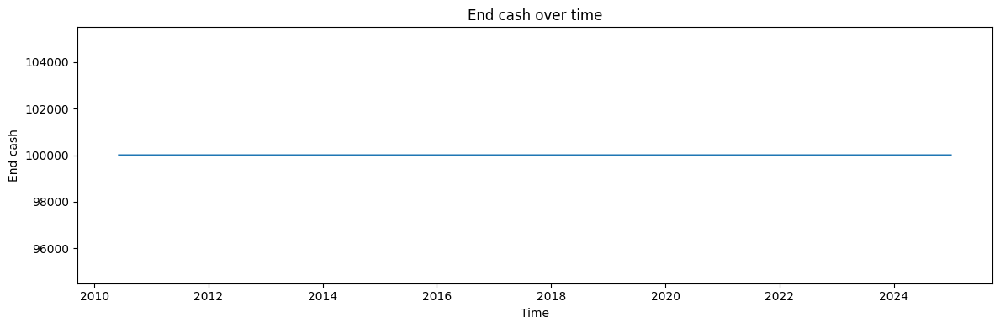

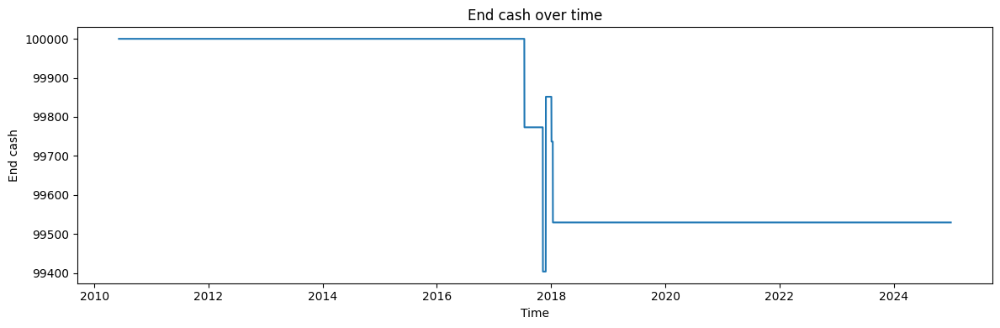

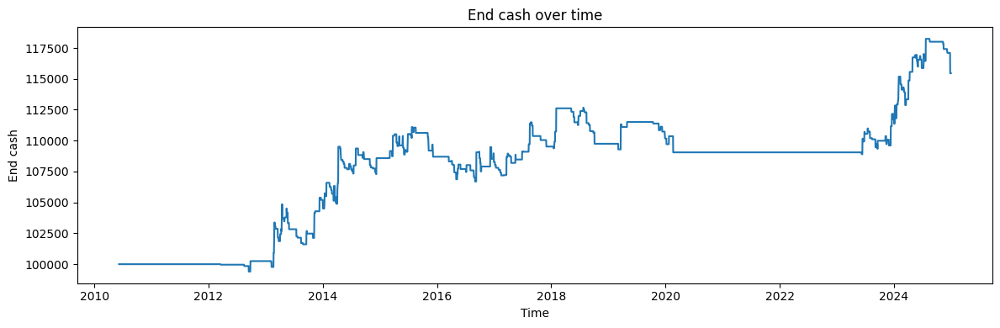

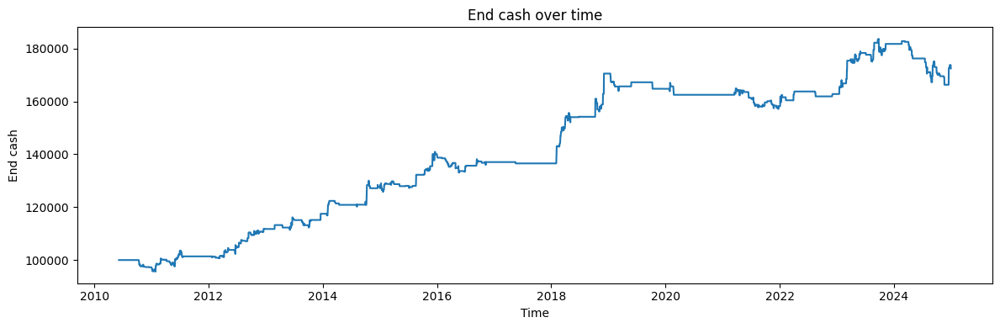

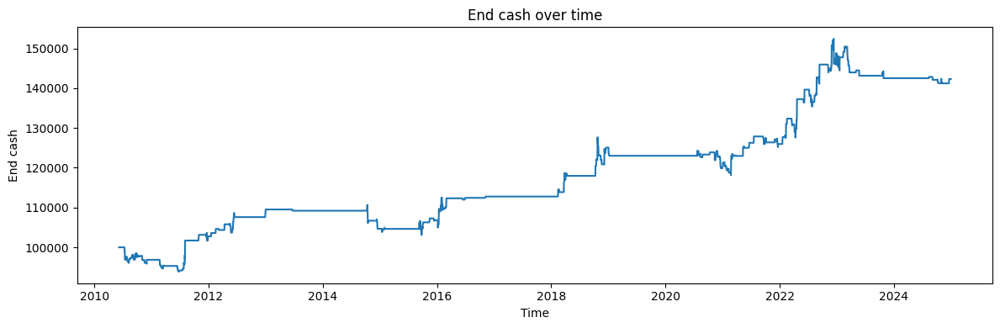

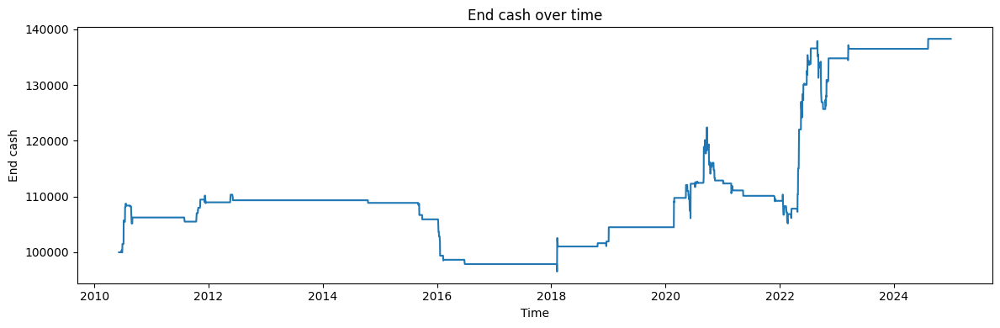

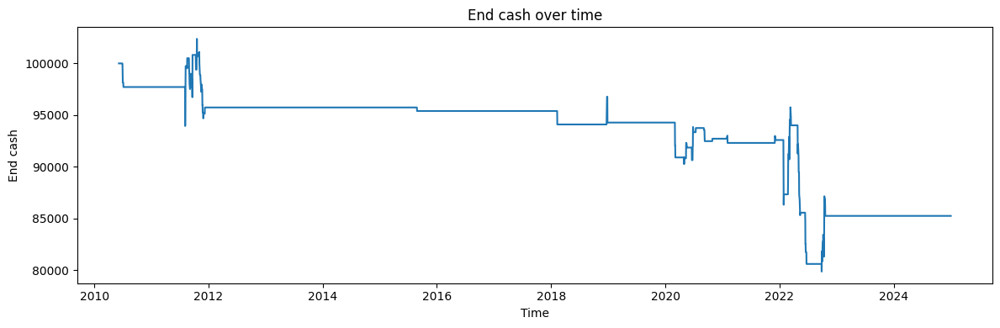

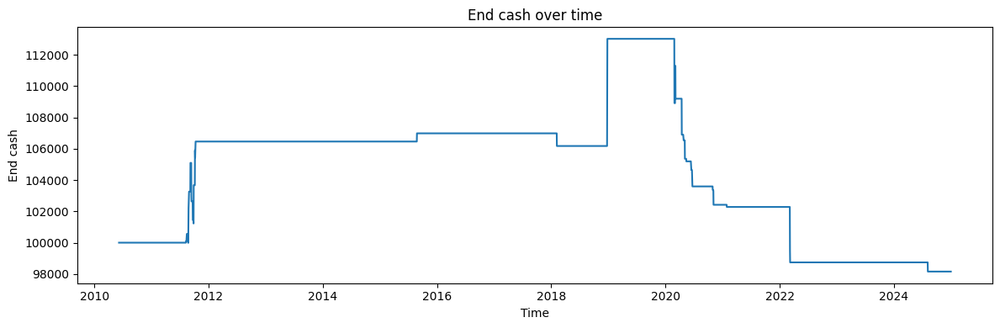

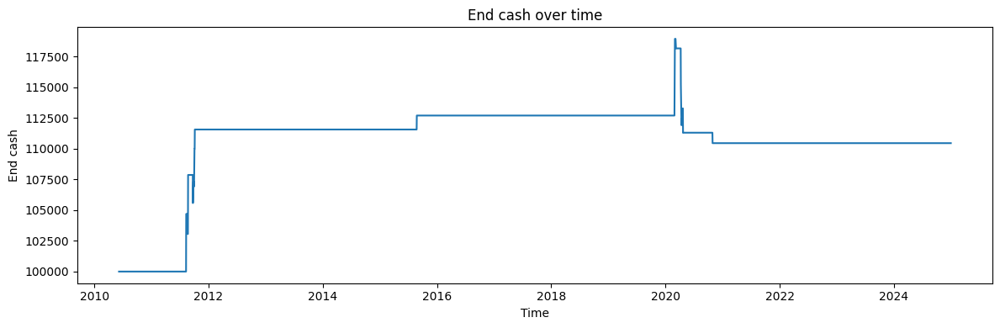

In [98]:
for i in [(0, 5), (5, 10), (10, 15), (15, 20), (20, 25), (25, 30), (30,35), (35, 40), (40, 45)]:
    results = backtest_with_hyperparameters(0.1, 0.005, 10, 14, 0.1, i[0], i[1])
    print(f"Results for VIX treshold: {i}")
    print(evaluate_strategy(results))
    s = results.copy()

    sp_df = pd.read_csv("/data/workspace_files/SP500.csv")
    sp_df['SP500'] = 189095.59434874536 * sp_df['SP500'] / 1938.76
    sp_df

    # If you have a Time column, make it the datetime index
    if "Time" in s.columns:
        s["Time"] = pd.to_datetime(s["Time"], errors="coerce")
        s = s.dropna(subset=["Time"]).sort_values("Time").set_index("Time")

    if "observation_date" in sp_df.columns:
        sp_df["observation_date"] = pd.to_datetime(sp_df["observation_date"], errors="coerce")
        sp_df = sp_df.dropna(subset=["observation_date"]).sort_values("observation_date").set_index("observation_date")

    # Plot end_cash over time
    plt.figure(figsize=(12,4))
    plt.plot(s.date, s["end_cash"].astype(float))
    # plt.plot(sp_df['SP500'].astype(float))
    plt.plot
    plt.title("End cash over time")
    plt.xlabel("Time")
    plt.ylabel("End cash")
    plt.tight_layout()
    plt.show()